## Nonlinear interaction of radiation belt electrons with electromagnetic ion cyclotron waves
Albert and Bortnik (2009)


In [2]:
import numpy as np
import os
import sys
import inspect
import matplotlib.pyplot as plt


#Define WPIT package location
current_dir =  os.path.abspath(os.path.dirname('__file__'))
fpath = os.path.abspath(current_dir + "/..")
sys.path.append(fpath)


import WPIT.Environment_mod as env
import WPIT.WaveProperties_mod as wave
import WPIT.WPI_mod.parallel_EMIC_mod as wpi


### 1. Define simulation parameters

Here we define all the initial parameters of the simulation in respect with the particle and the wave

In [6]:
L_sim=4  #L-shell of the simulation 
Bw_sim=2*10**(-9)

aeq0_deg=55  #initial equatorial pitch angle
aeq0=np.deg2rad(aeq0_deg) #convert pitch angle to rad

Ekev0=2000 #initial energy keV
lamda0_deg=0 # starting electron latitude
lamda0=np.deg2rad(lamda0_deg) #convert latitude to rad

f_wave=1.84 # wave frequency in Hz
w_wave=2*np.pi*f_wave #wave angular frequency

# eta0_deg=np.arange(0,361,30)#initial phases of electrons
eta0_deg=np.linspace(0,360,24)
eta0=np.deg2rad(eta0_deg) #convert initial phases to rad


B0=32200*10**(-9)
slat=np.sin(lamda0)
clat=np.cos(lamda0)
slat_term = np.sqrt(1 + 3*slat*slat)
B_sim=(B0/(L_sim**3))*slat_term/(clat**6)
    
wce_sim=env.omega_cyclotron(B_sim,env.const.qe,env.const.me)
wcHe_sim=env.omega_cyclotron(B_sim,env.const.qe,env.const.mHe)
wcO_sim=env.omega_cyclotron(B_sim,env.const.qe,env.const.mO)
wcH_sim=env.omega_cyclotron(B_sim,env.const.qe,env.const.mH)



slateq=np.sin(lamda0)
clateq=np.cos(lamda0)
slat_termeq = np.sqrt(1 + 3*slateq*slateq)
Beq=(B0/(L_sim**3))*slat_termeq/(clateq**6)

wce_sim_eq=env.omega_cyclotron(Beq,env.const.qe,env.const.me)
wcHe_sim_eq=env.omega_cyclotron(Beq,env.const.qe,env.const.mHe)
wmega_sim=0.96*wcHe_sim_eq

wpe_sim_eq=15*wce_sim_eq

ne_simeq=(wpe_sim_eq*wpe_sim_eq*env.const.me*env.const.epsilon0)/(env.const.qe*env.const.qe)

ne_sim=env.density_FL_denton(ne_simeq,lamda0)
nH_sim=0.77*ne_sim
nHe_sim=0.2*ne_sim
nO_sim=0.03*ne_sim
wpe_sim=env.omega_plasma(ne_sim,env.const.qe,env.const.mH)
wpH_sim=env.omega_plasma(nH_sim,env.const.qe,env.const.mH)
wpHe_sim=env.omega_plasma(nHe_sim,env.const.qe,env.const.mHe)
wpO_sim=env.omega_plasma(nO_sim,env.const.qe,env.const.mO)

alpha0=env.aeq2alpha(L_sim,lamda0,aeq0)
musq0=wave.refr_index_parallel_EMIC(w_wave,wpe_sim,wce_sim,wpH_sim,wcH_sim,wpO_sim,wcO_sim,wpHe_sim,wcHe_sim)
kappa0=np.sqrt(musq0)*w_wave/env.const.c_light
upar0,uper0,ppar0,pper0,gamma0=env.initial_velocity(Ekev0,alpha0,env.const.me)    


dwc_ds0=env.dwc_ds(wce_sim,lamda0,L_sim)
dk_dt=0

H0=wpi.nonlinear_H(pper0,ppar0,kappa0,gamma0,env.const.me,wce_sim,dk_dt,dwc_ds0,0)
thet0,wtsq0=wpi.nonlinear_theta(pper0,ppar0,Bw_sim,kappa0,gamma0,env.const.me,env.const.qe,wce_sim,wmega_sim)
S0=wpi.nonlinear_S(H0,wtsq0)

t=0.06 #simulation duration (s)
h=0.00001  #simulation stepsize
Nsteps=int(t/h) #number of simulation steps



### 2. Allocate outputs

In [7]:
pper=np.zeros((len(eta0),Nsteps+1))
ppar=np.zeros((len(eta0),Nsteps+1))
eta=np.zeros((len(eta0),Nsteps+1))
lamda=np.zeros((len(eta0),Nsteps+1))
time=np.zeros((len(eta0),Nsteps+1))
uper=np.zeros((len(eta0),Nsteps+1))
upar=np.zeros((len(eta0),Nsteps+1))
zeta=np.zeros((len(eta0),Nsteps+1))
alpha=np.zeros((len(eta0),Nsteps+1))
aeq=np.zeros((len(eta0),Nsteps+1))
vresz_o=np.zeros((len(eta0),Nsteps+1))
Eres_o=np.zeros((len(eta0),Nsteps+1))
mu_adiabatic=np.zeros((len(eta0),Nsteps+1))
deta_dt=np.zeros((len(eta0),Nsteps+1))
kappa_out=np.zeros((len(eta0),Nsteps+1))
kx_out=np.zeros((len(eta0),Nsteps+1))
kz_out=np.zeros((len(eta0),Nsteps+1))
gamma=np.zeros((len(eta0),Nsteps+1))
E_kin=np.zeros((len(eta0),Nsteps+1))
ref_sq=np.zeros((len(eta0),Nsteps+1))
u_res_out=np.zeros((len(eta0),Nsteps+1))
H_out=np.zeros((len(eta0),Nsteps+1))
S_out=np.zeros((len(eta0),Nsteps+1))
detadt_out=np.zeros((len(eta0),Nsteps+1))
wtrsq_out=np.zeros((len(eta0),Nsteps+1))
thet_out=np.zeros((len(eta0),Nsteps+1))

### 3. Import WPIT routines

In [10]:
detasts_0=[]
for k in range(0,len(eta0)):
    eta0tmp=wpi.detadt(ppar0,pper0,eta0[k],Bw_sim,wmega_sim,kappa0,wce_sim,gamma0,env.const.qe,env.const.me,'electron')
    detasts_0.append(eta0tmp)


In [12]:
for k in range(0,len(eta0)):
    i=0
    time[k,0]=0
    pper[k,0]=pper0
    ppar[k,0]=ppar0
    eta[k,0]=eta0[k]
    lamda[k,0]=lamda0
    zeta[k,0]=0
    upar[k,0]=upar0
    uper[k,0]=uper0
    alpha[k,0]=alpha0
    aeq[k,0]=aeq0
    gamma[k,0]=gamma0
    E_kin[k,0]=1.602176487E-16*Ekev0
    ref_sq[k,0]=musq0
    kappa_out[k,0]=kappa0
    H_out[k,0]=H0
    S_out[k,0]=S0
    detadt_out[k,0]=detasts_0[k]
    wtrsq_out[k,0]=wtsq0
    thet_out[k,0]=thet0
    print(np.rad2deg(eta[k,0]))
##############################################
    while i<Nsteps:
##############################################################################################################        
        #First step of Runge-Kutta

        Bw_sim=Bw_sim


        B0=32200*10**(-9)
        slat=np.sin(lamda[k,i])
        clat=np.cos(lamda[k,i])
        slat_term = np.sqrt(1 + 3*slat*slat)
        Bmagtmp=(B0/(L_sim**3))*slat_term/(clat**6)

        n_etmp=env.density_FL_denton(ne_simeq,lamda[k,i])
        n_Htmp=0.77*n_etmp
        n_Hetmp=0.2*n_etmp
        n_Otmp=0.03*n_etmp

        wcetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.me)
        wcHtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mH)
        wcHetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mHe)
        wcOtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mO)
        
        wpetmp=env.omega_plasma(n_etmp,env.const.qe,env.const.me)
        wpHtmp=env.omega_plasma(n_Htmp,env.const.qe,env.const.mH)
        wpHetmp=env.omega_plasma(n_Hetmp,env.const.qe,env.const.mHe)
        wpOtmp=env.omega_plasma(n_Otmp,env.const.qe,env.const.mO)

        musqtmp=wave.refr_index_parallel_EMIC(w_wave,wpetmp,wcetmp,wpHtmp,wcHtmp,wpOtmp,wcOtmp,wpHetmp,wcHetmp)
        kappatmp=np.sqrt(musqtmp)*w_wave/env.const.c_light
        

        dwh_dstmp=env.dwc_ds(wcetmp,lamda[k,i],L_sim)
        
        p_mag=np.sqrt(ppar[k,i]*ppar[k,i]+pper[k,i]*pper[k,i])
        
        gammatmp=gamma[k,i]

        k1=wpi.dzdt(ppar[k,i],gammatmp,env.const.me)
        l1=wpi.dppardt(pper[k,i],eta[k,i],wcetmp,Bw_sim,gammatmp,dwh_dstmp,env.const.qe,env.const.me)
        m1=wpi.dpperdt(ppar[k,i],pper[k,i],eta[k,i],Bw_sim,gammatmp,wmega_sim,kappatmp,wcetmp,dwh_dstmp,env.const.qe,env.const.me)
        n1=wpi.detadt(ppar[k,i],pper[k,i],eta[k,i],Bw_sim,w_wave,kappatmp,wcetmp,gammatmp,env.const.qe,env.const.me,'electron')
        o1=wpi.dlamdadt(ppar[k,i],lamda[k,i],gammatmp,env.const.me,L_sim)
        p1=wpi.dalphadt(ppar[k,i],pper[k,i],eta[k,i],gammatmp,wcetmp,dwh_dstmp,w_wave,kappatmp,Bw_sim,env.const.me,env.const.qe)
        q1=wpi.daeqdt(ppar[k,i],pper[k,i],eta[k,i],gammatmp,w_wave,kappatmp,Bw_sim,aeq[k,i],alpha[k,i],env.const.me,env.const.qe)
        r1=wpi.dgammadt(pper[k,i],eta[k,i],gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        s1=wpi.dEkdt(pper[k,i],eta[k,i],gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        

#         #Second step of Runge-Kutta
       
        Bw_sim=Bw_sim

            
        B0=32200*10**(-9)
        slat=np.sin(lamda[k,i]+0.5*h*o1)
        clat=np.cos(lamda[k,i]+0.5*h*o1)
        slat_term = np.sqrt(1 + 3*slat*slat)
        Bmagtmp=(B0/(L_sim**3))*slat_term/(clat**6)
        
        n_etmp=env.density_FL_denton(ne_simeq,lamda[k,i]+0.5*h*o1)
        n_Htmp=0.77*n_etmp
        n_Hetmp=0.2*n_etmp
        n_Otmp=0.03*n_etmp

        wcetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.me)
        wcHtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mH)
        wcHetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mHe)
        wcOtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mO)
        
        wpetmp=env.omega_plasma(n_etmp,env.const.qe,env.const.me)
        wpHtmp=env.omega_plasma(n_Htmp,env.const.qe,env.const.mH)
        wpHetmp=env.omega_plasma(n_Hetmp,env.const.qe,env.const.mHe)
        wpOtmp=env.omega_plasma(n_Otmp,env.const.qe,env.const.mO)

        musqtmp=wave.refr_index_parallel_EMIC(w_wave,wpetmp,wcetmp,wpHtmp,wcHtmp,wpOtmp,wcOtmp,wpHetmp,wcHetmp)
        kappatmp=np.sqrt(musqtmp)*w_wave/env.const.c_light
        

        dwh_dstmp=env.dwc_ds(wcetmp,lamda[k,i]+0.5*h*o1,L_sim)
        
        p_mag=np.sqrt((ppar[k,i]+0.5*h*l1)*(ppar[k,i]+0.5*h*l1)+(pper[k,i]+0.5*h*m1)*(pper[k,i]+0.5*h*m1))
        
        gammatmp=gamma[k,i]+0.5*h*r1

        k2=wpi.dzdt(ppar[k,i]+0.5*h*l1,gammatmp,env.const.me)
        l2=wpi.dppardt(pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,wcetmp,Bw_sim,gammatmp,dwh_dstmp,env.const.qe,env.const.me)
        m2=wpi.dpperdt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,Bw_sim,gammatmp,wmega_sim,kappatmp,wcetmp,dwh_dstmp,env.const.qe,env.const.me)
        n2=wpi.detadt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,Bw_sim,w_wave,kappatmp,wcetmp,gammatmp,env.const.qe,env.const.me,'electron')
        o2=wpi.dlamdadt(ppar[k,i]+0.5*h*l1,lamda[k,i]+0.5*h*o1,gammatmp,env.const.me,L_sim)
        p2=wpi.dalphadt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,gammatmp,wcetmp,dwh_dstmp,w_wave,kappatmp,Bw_sim,env.const.me,env.const.qe)
        q2=wpi.daeqdt(ppar[k,i]+0.5*h*l1,pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,gammatmp,w_wave,kappatmp,Bw_sim,aeq[k,i]+0.5*h*q1,alpha[k,i]+0.5*h*p1,env.const.me,env.const.qe)
        r2=wpi.dgammadt(pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        s2=wpi.dEkdt(pper[k,i]+0.5*h*m1,eta[k,i]+0.5*h*n1,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        
#             ##############################################################################################################        
        #Third step of Runge-Kutta

        Bw_sim=Bw_sim

        B0=32200*10**(-9)
        slat=np.sin(lamda[k,i]+0.5*h*o2)
        clat=np.cos(lamda[k,i]+0.5*h*o2)
        slat_term = np.sqrt(1 + 3*slat*slat)
        Bmagtmp=(B0/(L_sim**3))*slat_term/(clat**6)
        
        n_etmp=env.density_FL_denton(ne_simeq,lamda[k,i]+0.5*h*o2)
        n_Htmp=0.77*n_etmp
        n_Hetmp=0.2*n_etmp
        n_Otmp=0.03*n_etmp
        
        wcetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.me)
        wcHtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mH)
        wcHetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mHe)
        wcOtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mO)
        
        wpetmp=env.omega_plasma(n_etmp,env.const.qe,env.const.me)
        wpHtmp=env.omega_plasma(n_Htmp,env.const.qe,env.const.mH)
        wpHetmp=env.omega_plasma(n_Hetmp,env.const.qe,env.const.mHe)
        wpOtmp=env.omega_plasma(n_Otmp,env.const.qe,env.const.mO)

        musqtmp=wave.refr_index_parallel_EMIC(w_wave,wpetmp,wcetmp,wpHtmp,wcHtmp,wpOtmp,wcOtmp,wpHetmp,wcHetmp)
        kappatmp=np.sqrt(musqtmp)*w_wave/env.const.c_light
        

        dwh_dstmp=env.dwc_ds(wcetmp,lamda[k,i]+0.5*h*o2,L_sim)
        
        p_mag=np.sqrt((ppar[k,i]+0.5*h*l2)*(ppar[k,i]+0.5*h*l2)+(pper[k,i]+0.5*h*m2)*(pper[k,i]+0.5*h*m2))
        
        gammatmp=gamma[k,i]+0.5*h*r2

        k3=wpi.dzdt(ppar[k,i]+0.5*h*l2,gammatmp,env.const.me)
        l3=wpi.dppardt(pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,wcetmp,Bw_sim,gammatmp,dwh_dstmp,env.const.qe,env.const.me)
        m3=wpi.dpperdt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,Bw_sim,gammatmp,wmega_sim,kappatmp,wcetmp,dwh_dstmp,env.const.qe,env.const.me)
        n3=wpi.detadt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,Bw_sim,w_wave,kappatmp,wcetmp,gammatmp,env.const.qe,env.const.me,'electron')
        o3=wpi.dlamdadt(ppar[k,i]+0.5*h*l2,lamda[k,i]+0.5*h*o2,gammatmp,env.const.me,L_sim)
        p3=wpi.dalphadt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,gammatmp,wcetmp,dwh_dstmp,w_wave,kappatmp,Bw_sim,env.const.me,env.const.qe)
        q3=wpi.daeqdt(ppar[k,i]+0.5*h*l2,pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,gammatmp,w_wave,kappatmp,Bw_sim,aeq[k,i]+0.5*h*q2,alpha[k,i]+0.5*h*p2,env.const.me,env.const.qe)
        r3=wpi.dgammadt(pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        s3=wpi.dEkdt(pper[k,i]+0.5*h*m2,eta[k,i]+0.5*h*n2,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
               
#             ##############################################################################################################        
#         Fourth step of Runge-Kutta

        Bw_sim=Bw_sim

        B0=32200*10**(-9)
        slat=np.sin(lamda[k,i]+h*o3)
        clat=np.cos(lamda[k,i]+h*o3)
        slat_term = np.sqrt(1 + 3*slat*slat)
        Bmagtmp=(B0/(L_sim**3))*slat_term/(clat**6)
        
        n_etmp=env.density_FL_denton(ne_simeq,lamda[k,i]+h*o3)
        n_Htmp=0.77*n_etmp
        n_Hetmp=0.2*n_etmp
        n_Otmp=0.03*n_etmp

        wcetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.me)
        wcHtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mH)
        wcHetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mHe)
        wcOtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mO)
        
        wpetmp=env.omega_plasma(n_etmp,env.const.qe,env.const.me)
        wpHtmp=env.omega_plasma(n_Htmp,env.const.qe,env.const.mH)
        wpHetmp=env.omega_plasma(n_Hetmp,env.const.qe,env.const.mHe)
        wpOtmp=env.omega_plasma(n_Otmp,env.const.qe,env.const.mO)

        musqtmp=wave.refr_index_parallel_EMIC(w_wave,wpetmp,wcetmp,wpHtmp,wcHtmp,wpOtmp,wcOtmp,wpHetmp,wcHetmp)
        kappatmp=np.sqrt(musqtmp)*w_wave/env.const.c_light
        

        dwh_dstmp=env.dwc_ds(wcetmp,lamda[k,i]+h*o3,L_sim)
        
        p_mag=np.sqrt((ppar[k,i]+h*l3)*(ppar[k,i]+h*l3)+(pper[k,i]+h*m3)*(pper[k,i]+h*m3))
        
        gammatmp=gamma[k,i]+h*r3

        k4=wpi.dzdt(ppar[k,i]+h*l3,gammatmp,env.const.me)
        l4=wpi.dppardt(pper[k,i]+h*m3,eta[k,i]+h*n3,wcetmp,Bw_sim,gammatmp,dwh_dstmp,env.const.qe,env.const.me)
        m4=wpi.dpperdt(ppar[k,i]+h*l3,pper[k,i]+h*m3,eta[k,i]+h*n3,Bw_sim,gammatmp,wmega_sim,kappatmp,wcetmp,dwh_dstmp,env.const.qe,env.const.me)
        n4=wpi.detadt(ppar[k,i]+h*l3,pper[k,i]+h*m3,eta[k,i]+h*n3,Bw_sim,w_wave,kappatmp,wcetmp,gammatmp,env.const.qe,env.const.me,'electron')
        o4=wpi.dlamdadt(ppar[k,i]+h*l3,lamda[k,i]+h*o3,gammatmp,env.const.me,L_sim)
        p4=wpi.dalphadt(ppar[k,i]+h*l3,pper[k,i]+h*m3,eta[k,i]+h*n3,gammatmp,wcetmp,dwh_dstmp,w_wave,kappatmp,Bw_sim,env.const.me,env.const.qe)
        q4=wpi.daeqdt(ppar[k,i]+h*l3,pper[k,i]+h*m3,eta[k,i]+h*n3,gammatmp,w_wave,kappatmp,Bw_sim,aeq[k,i]+h*q3,alpha[k,i]+h*p3,env.const.me,env.const.qe)
        r4=wpi.dgammadt(pper[k,i]+h*m3,eta[k,i]+h*n3,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        s4=wpi.dEkdt(pper[k,i]+h*m3,eta[k,i]+h*n3,gammatmp,Bw_sim,kappatmp,w_wave,env.const.qe,env.const.me)
        
        zeta[k,i+1]=zeta[k,i]+(h/6)*(k1+2*k2+2*k3+k4)
        ppar[k,i+1]=ppar[k,i]+(h/6)*(l1+2*l2+2*l3+l4)
        pper[k,i+1]=pper[k,i]+(h/6)*(m1+2*m2+2*m3+m4)
        eta[k,i+1]=(eta[k,i]+(h/6)*(n1+2*n2+2*n3+n4))
        lamda[k,i+1]=lamda[k,i]+(h/6)*(o1+2*o2+2*o3+o4)
        alpha[k,i+1]=alpha[k,i]+(h/6)*(p1+2*p2+2*p3+p4)
        aeq[k,i+1]=aeq[k,i]+(h/6)*(q1+2*q2+2*q3+q4)
        gamma[k,i+1]=gamma[k,i]+(h/6)*(r1+2*r2+2*r3+r4)
        E_kin[k,i+1]=E_kin[k,i]+(h/6)*(s1+2*s2+2*s3+s4)
        deta_dt[k,i+1]=(1/6)*(n1+2*n2+2*n3+n4)
        
        B0=32200*10**(-9)
        slat=np.sin(lamda[k,i+1])
        clat=np.cos(lamda[k,i+1])
        slat_term = np.sqrt(1 + 3*slat*slat)
        Bmagtmp=(B0/(L_sim**3))*slat_term/(clat**6)
        
        n_etmp=env.density_FL_denton(ne_simeq,lamda[k,i+1])
        n_Htmp=0.77*n_etmp
        n_Hetmp=0.2*n_etmp
        n_Otmp=0.03*n_etmp

        wcetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.me)
        wcHtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mH)
        wcHetmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mHe)
        wcOtmp=env.omega_cyclotron(Bmagtmp,env.const.qe,env.const.mO)
        
        wpetmp=env.omega_plasma(n_etmp,env.const.qe,env.const.me)
        wpHtmp=env.omega_plasma(n_Htmp,env.const.qe,env.const.mH)
        wpHetmp=env.omega_plasma(n_Hetmp,env.const.qe,env.const.mHe)
        wpOtmp=env.omega_plasma(n_Otmp,env.const.qe,env.const.mO)

        musqtmp=wave.refr_index_parallel_EMIC(w_wave,wpetmp,wcetmp,wpHtmp,wcHtmp,wpOtmp,wcOtmp,wpHetmp,wcHetmp)
        kappatmp=np.sqrt(musqtmp)*w_wave/env.const.c_light
        kappa_out[k,i+1]=kappatmp        

        dwh_dstmp=env.dwc_ds(wcetmp,lamda[k,i+1],L_sim)
        
        ref_sq[k,i+1]=musqtmp

        upar[k,i+1]=ppar[k,i+1]/(env.const.me*gammatmp)
        uper[k,i+1]=pper[k,i+1]/(env.const.me*gammatmp)
        u_mag=np.sqrt(upar[k,i+1]**2+uper[k,i+1]**2)
        pmagnitude=np.sqrt(ppar[k,i+1]**2+pper[k,i+1]**2)


        
        dkpardt_run=(kappa_out[k,i]-kappa_out[k,i-1])/h
        #####################################
        Htmp=wpi.nonlinear_H(pper[k,i+1],ppar[k,i+1],kappatmp,gammatmp,env.const.me,wcetmp,dkpardt_run,dwh_dstmp,0)
        thetatmp,wtsqtmp=wpi.nonlinear_theta(pper[k,i+1],ppar[k,i+1],Bw_sim,kappatmp,gammatmp,env.const.me,env.const.qe,wcetmp,wmega_sim)
        Stmp=wpi.nonlinear_S(Htmp,wtsqtmp)
        H_out[k,i+1]=Htmp
        S_out[k,i+1]=Stmp
        wtrsq_out[k,i+1]=wtsqtmp
        thet_out[k,i+1]=thetatmp


        i=i+1
        time[k,i]=time[k,i-1]+h

        print(eta0[k],time[k,i],np.rad2deg(aeq[k,i]))

0.0
0.0 1e-05 54.99981999610584
0.0 2e-05 54.99927996496162
0.0 3.0000000000000004e-05 54.99837984820259
0.0 4e-05 54.997119548624
0.0 5e-05 54.99549893028597
0.0 6e-05 54.99351781866059
0.0 7.000000000000001e-05 54.99117600082144
0.0 8e-05 54.98847322567597
0.0 9e-05 54.98540920424097
0.0 0.0001 54.981983609961866
0.0 0.00011 54.97819607907609
0.0 0.00012 54.974046211021395
0.0 0.00013000000000000002 54.969533568889695
0.0 0.00014000000000000001 54.964657679927186
0.0 0.00015000000000000001 54.95941803608176
0.0 0.00016 54.95381409459832
0.0 0.00017 54.947845278663436
0.0 0.00018 54.94151097809992
0.0 0.00019 54.93481055011294
0.0 0.0002 54.92774332008854
0.0 0.00021 54.92030858244605
0.0 0.00022 54.91250560154576
0.0 0.00023 54.904333612653275
0.0 0.00024 54.89579182296201
0.0 0.00025 54.88687941267563
0.0 0.00026000000000000003 54.87759553615195
0.0 0.00027000000000000006 54.867939323110065
0.0 0.0002800000000000001 54.8579098799027
0.0 0.0002900000000000001 54.84750629085552
0.0 0.

0.0 0.004709999999999976 60.205406530986366
0.0 0.004719999999999976 60.229348711598576
0.0 0.0047299999999999755 60.25242875942567
0.0 0.004739999999999975 60.27462644046241
0.0 0.004749999999999975 60.295922016468566
0.0 0.004759999999999974 60.31629628540172
0.0 0.004769999999999974 60.33573062148191
0.0 0.0047799999999999735 60.35420701475353
0.0 0.004789999999999973 60.37170811000827
0.0 0.004799999999999973 60.3882172449323
0.0 0.004809999999999972 60.403718487340825
0.0 0.004819999999999972 60.41819667136396
0.0 0.0048299999999999715 60.43163743244921
0.0 0.004839999999999971 60.4440272410484
0.0 0.004849999999999971 60.45535343485969
0.0 0.00485999999999997 60.4656042494994
0.0 0.00486999999999997 60.474768847482984
0.0 0.004879999999999969 60.48283734539954
0.0 0.004889999999999969 60.48980083917093
0.0 0.004899999999999969 60.49565142729296
0.0 0.004909999999999968 60.500382231963655
0.0 0.004919999999999968 60.503987418011974
0.0 0.004929999999999967 60.5064622095488
0.0 0.0

0.0 0.009609999999999777 59.042774176614174
0.0 0.009619999999999776 59.00609648767232
0.0 0.009629999999999776 58.96880167048725
0.0 0.009639999999999775 58.930958480792995
0.0 0.009649999999999775 58.89263623470025
0.0 0.009659999999999775 58.8539046601238
0.0 0.009669999999999774 58.81483375140395
0.0 0.009679999999999774 58.77549362752484
0.0 0.009689999999999773 58.73595439428838
0.0 0.009699999999999773 58.696286010756914
0.0 0.009709999999999773 58.65655816023251
0.0 0.009719999999999772 58.61684012599661
0.0 0.009729999999999772 58.57720067198932
0.0 0.009739999999999771 58.537707928565624
0.0 0.009749999999999771 58.498429283424386
0.0 0.00975999999999977 58.45943127776665
0.0 0.00976999999999977 58.420779507702456
0.0 0.00977999999999977 58.38253853089034
0.0 0.00978999999999977 58.344771778360375
0.0 0.009799999999999769 58.30754147144167
0.0 0.009809999999999769 58.2709085436871
0.0 0.009819999999999768 58.234932567662746
0.0 0.009829999999999768 58.19967168644683
0.0 0.009

0.0 0.014609999999999573 58.043648988887455
0.0 0.014619999999999573 58.03918329672867
0.0 0.014629999999999572 58.03722239730949
0.0 0.014639999999999572 58.0377761322626
0.0 0.014649999999999571 58.040843759301495
0.0 0.014659999999999571 58.04641390973933
0.0 0.01466999999999957 58.054464580148206
0.0 0.01467999999999957 58.064963158784046
0.0 0.01468999999999957 58.07786648747538
0.0 0.01469999999999957 58.09312095973681
0.0 0.014709999999999569 58.11066265591763
0.0 0.014719999999999568 58.130417516228015
0.0 0.014729999999999568 58.15230155249716
0.0 0.014739999999999568 58.176221099505604
0.0 0.014749999999999567 58.20207310669538
0.0 0.014759999999999567 58.229745470992924
0.0 0.014769999999999566 58.25911741137969
0.0 0.014779999999999566 58.29005988571076
0.0 0.014789999999999566 58.32243605011165
0.0 0.014799999999999565 58.35610176107722
0.0 0.014809999999999565 58.39090612015258
0.0 0.014819999999999564 58.42669206079614
0.0 0.014829999999999564 58.463296976708655
0.0 0.01

0.0 0.01960999999999937 58.82338205399692
0.0 0.01961999999999937 58.852534898718154
0.0 0.01962999999999937 58.87955896265389
0.0 0.01963999999999937 58.904218804720145
0.0 0.01964999999999937 58.92629892913911
0.0 0.01965999999999937 58.94560580795375
0.0 0.01966999999999937 58.96196971674613
0.0 0.019679999999999368 58.97524636270373
0.0 0.019689999999999368 58.985318286177844
0.0 0.019699999999999367 58.992096019191365
0.0 0.019709999999999367 58.995518986943985
0.0 0.019719999999999367 58.9955561411922
0.0 0.019729999999999366 58.99220631740081
0.0 0.019739999999999366 58.98549831072124
0.0 0.019749999999999365 58.97549066909585
0.0 0.019759999999999365 58.96227120505778
0.0 0.019769999999999364 58.945956231038885
0.0 0.019779999999999364 58.926689526154234
0.0 0.019789999999999364 58.90464104545115
0.0 0.019799999999999363 58.88000538543978
0.0 0.019809999999999363 58.85300002232033
0.0 0.019819999999999362 58.82386334164749
0.0 0.019829999999999362 58.79285248019616
0.0 0.019839

0.0 0.02431999999999918 58.36443629588972
0.0 0.02432999999999918 58.385761631975264
0.0 0.024339999999999178 58.409946107609585
0.0 0.024349999999999178 58.43667625511779
0.0 0.024359999999999177 58.465605101858614
0.0 0.024369999999999177 58.496356577977046
0.0 0.024379999999999177 58.52853032227165
0.0 0.024389999999999176 58.56170682759128
0.0 0.024399999999999176 58.59545286185077
0.0 0.024409999999999175 58.62932709612357
0.0 0.024419999999999175 58.66288586744631
0.0 0.024429999999999175 58.695689001062654
0.0 0.024439999999999174 58.7273056149381
0.0 0.024449999999999174 58.757319828571525
0.0 0.024459999999999173 58.78533629846811
0.0 0.024469999999999173 58.81098550415529
0.0 0.024479999999999173 58.83392871131935
0.0 0.024489999999999172 58.85386254249306
0.0 0.024499999999999172 58.87052309068172
0.0 0.02450999999999917 58.88368951730138
0.0 0.02451999999999917 58.89318708272128
0.0 0.02452999999999917 58.89888956544004
0.0 0.02453999999999917 58.900721034354
0.0 0.02454999

0.0 0.028569999999999006 58.82551488279487
0.0 0.028579999999999006 58.836136739041436
0.0 0.028589999999999005 58.84275785742213
0.0 0.028599999999999005 58.845263445568165
0.0 0.028609999999999004 58.84361024998873
0.0 0.028619999999999004 58.837827378389626
0.0 0.028629999999999003 58.82801587843168
0.0 0.028639999999999003 58.8143470771439
0.0 0.028649999999999003 58.797059705234965
0.0 0.028659999999999002 58.77645585040513
0.0 0.028669999999999002 58.75289580324706
0.0 0.028679999999999 58.726791878196764
0.0 0.028689999999999 58.69860130997637
0.0 0.028699999999999 58.668818342737104
0.0 0.028709999999999 58.63796564431459
0.0 0.028719999999999 58.60658519128352
0.0 0.028729999999999 58.57522878148774
0.0 0.028739999999999 58.544448339094295
0.0 0.028749999999999 58.5147861826972
0.0 0.028759999999998998 58.48676542936606
0.0 0.028769999999998998 58.460880706664156
0.0 0.028779999999998997 58.43758934050322
0.0 0.028789999999998997 58.417303179299054
0.0 0.028799999999998997 58.

0.0 0.03258999999999931 58.76629701203359
0.0 0.03259999999999931 58.781343689109804
0.0 0.03260999999999931 58.79257370338999
0.0 0.032619999999999316 58.799744255719176
0.0 0.03262999999999932 58.80270063433281
0.0 0.03263999999999932 58.80137954185245
0.0 0.032649999999999325 58.795810498491086
0.0 0.03265999999999933 58.78611529311164
0.0 0.03266999999999933 58.77250548883098
0.0 0.032679999999999335 58.75527802502178
0.0 0.03268999999999934 58.73480899285078
0.0 0.03269999999999934 58.71154569680378
0.0 0.032709999999999344 58.68599714969277
0.0 0.03271999999999935 58.658723182885765
0.0 0.03272999999999935 58.630322386173106
0.0 0.03273999999999935 58.601419121798536
0.0 0.032749999999999356 58.572649883613316
0.0 0.03275999999999936 58.544649293874556
0.0 0.03276999999999936 58.51803604576929
0.0 0.032779999999999365 58.493399108309966
0.0 0.03278999999999937 58.471284511042256
0.0 0.03279999999999937 58.45218301854656
0.0 0.032809999999999374 58.43651898883094
0.0 0.03281999999

0.0 0.037420000000000786 58.75980545751551
0.0 0.03743000000000079 58.7623766407617
0.0 0.03744000000000079 58.76070252093299
0.0 0.037450000000000795 58.75482976480798
0.0 0.0374600000000008 58.74491858610611
0.0 0.0374700000000008 58.73123867038978
0.0 0.037480000000000804 58.71416225003534
0.0 0.03749000000000081 58.69415446696362
0.0 0.03750000000000081 58.67176122304373
0.0 0.037510000000000814 58.64759478224183
0.0 0.03752000000000082 58.62231745339967
0.0 0.03753000000000082 58.59662374572046
0.0 0.03754000000000082 58.57122144751877
0.0 0.037550000000000826 58.546812128945234
0.0 0.03756000000000083 58.524071607483606
0.0 0.03757000000000083 58.50363093756237
0.0 0.037580000000000835 58.48605848979303
0.0 0.03759000000000084 58.47184366924182
0.0 0.03760000000000084 58.46138278499203
0.0 0.037610000000000844 58.45496752550696
0.0 0.03762000000000085 58.45277641761127
0.0 0.03763000000000085 58.454869554027745
0.0 0.03764000000000085 58.461186769029595
0.0 0.037650000000000856 5

0.0 0.04213000000000223 58.729833441791286
0.0 0.04214000000000223 58.72636182838843
0.0 0.042150000000002234 58.718976393583155
0.0 0.04216000000000224 58.70791799678297
0.0 0.04217000000000224 58.69354692624689
0.0 0.042180000000002243 58.67633190422125
0.0 0.04219000000000225 58.65683562448688
0.0 0.04220000000000225 58.63569716296092
0.0 0.04221000000000225 58.61361170871227
0.0 0.042220000000002256 58.591308172567
0.0 0.04223000000000226 58.5695253365238
0.0 0.04224000000000226 58.548987300829936
0.0 0.042250000000002265 58.53037905749083
0.0 0.04226000000000227 58.514323060462566
0.0 0.04227000000000227 58.50135766675406
0.0 0.042280000000002274 58.49191828467719
0.0 0.04229000000000228 58.486321984224716
0.0 0.04230000000000228 58.484756202109715
0.0 0.04231000000000228 58.4872720157118
0.0 0.042320000000002286 58.49378227423885
0.0 0.04233000000000229 58.504064672220395
0.0 0.04234000000000229 58.51776964177808
0.0 0.042350000000002296 58.534432738215756
0.0 0.0423600000000023 

0.0 0.04639000000000353 58.64070341462712
0.0 0.046400000000003536 58.65791033890769
0.0 0.04641000000000354 58.67315591037791
0.0 0.04642000000000354 58.68587043443581
0.0 0.046430000000003545 58.69558113474634
0.0 0.04644000000000355 58.70192869927487
0.0 0.04645000000000355 58.70467966690535
0.0 0.046460000000003554 58.703734380955154
0.0 0.04647000000000356 58.69913035004198
0.0 0.04648000000000356 58.69104095351605
0.0 0.04649000000000356 58.67976951681841
0.0 0.046500000000003566 58.66573887273511
0.0 0.04651000000000357 58.64947662802934
0.0 0.04652000000000357 58.63159647835684
0.0 0.046530000000003575 58.6127760591734
0.0 0.04654000000000358 58.593731981473354
0.0 0.04655000000000358 58.57519286738128
0.0 0.046560000000003585 58.557871355857316
0.0 0.04657000000000359 58.54243617470864
0.0 0.04658000000000359 58.5294854537793
0.0 0.046590000000003594 58.519522470778
0.0 0.0466000000000036 58.512934966188986
0.0 0.0466100000000036 58.50997903434501
0.0 0.0466200000000036 58.510

0.0 0.05106000000000496 58.64535534832608
0.0 0.051070000000004966 58.657660061684595
0.0 0.05108000000000497 58.66775116959617
0.0 0.05109000000000497 58.67520360180592
0.0 0.051100000000004975 58.67970566249821
0.0 0.05111000000000498 58.6810708212013
0.0 0.05112000000000498 58.679244632027704
0.0 0.051130000000004984 58.674306682158885
0.0 0.05114000000000499 58.66646755013485
0.0 0.05115000000000499 58.65606082288359
0.0 0.05116000000000499 58.643530301596584
0.0 0.051170000000004996 58.629412641236165
0.0 0.051180000000005 58.61431582847901
0.0 0.051190000000005 58.598894107623885
0.0 0.051200000000005005 58.583820199432076
0.0 0.05121000000000501 58.56975589859307
0.0 0.05122000000000501 58.55732234887867
0.0 0.051230000000005015 58.54707144685595
0.0 0.05124000000000502 58.539459885402415
0.0 0.05125000000000502 58.53482729678047
0.0 0.051260000000005024 58.53337978423698
0.0 0.05127000000000503 58.53517984801882
0.0 0.05128000000000503 58.54014333721784
0.0 0.05129000000000503 

0.0 0.056260000000006555 58.58618710976449
0.0 0.05627000000000656 58.59704411412709
0.0 0.05628000000000656 58.60834933860226
0.0 0.056290000000006564 58.61954441251799
0.0 0.05630000000000657 58.630082959774455
0.0 0.05631000000000657 58.63945677569447
0.0 0.05632000000000657 58.647219072585216
0.0 0.056330000000006576 58.653003978944355
0.0 0.05634000000000658 58.65654180454422
0.0 0.05635000000000658 58.65766984330915
0.0 0.056360000000006585 58.65633865339551
0.0 0.05637000000000659 58.65261383018423
0.0 0.05638000000000659 58.64667329808122
0.0 0.056390000000006595 58.63880013324084
0.0 0.0564000000000066 58.62937093978454
0.0 0.0564100000000066 58.61883987858626
0.0 0.056420000000006604 58.607718614696914
0.0 0.05643000000000661 58.596552707193574
0.0 0.05644000000000661 58.585895288307064
0.0 0.05645000000000661 58.57627922060588
0.0 0.056460000000006616 58.56818922316924
0.0 0.05647000000000662 58.56203566084188
0.0 0.05648000000000662 58.558131746547424
0.0 0.0564900000000066

0.2731819698773733 0.0009100000000000017 52.49326198502802
0.2731819698773733 0.0009200000000000018 52.45233315777405
0.2731819698773733 0.0009300000000000018 52.41136467104574
0.2731819698773733 0.0009400000000000018 52.37037380577206
0.2731819698773733 0.0009500000000000018 52.32937833114272
0.2731819698773733 0.0009600000000000019 52.288396501305115
0.2731819698773733 0.0009700000000000019 52.24744705097129
0.2731819698773733 0.000980000000000002 52.20654918988852
0.2731819698773733 0.000990000000000002 52.16572259612855
0.2731819698773733 0.001000000000000002 52.1249874081521
0.2731819698773733 0.001010000000000002 52.08436421560691
0.2731819698773733 0.001020000000000002 52.04387404882026
0.2731819698773733 0.001030000000000002 52.003538366949044
0.2731819698773733 0.001040000000000002 51.96337904475366
0.2731819698773733 0.001050000000000002 51.923418357965
0.2731819698773733 0.0010600000000000021 51.883678967217804
0.2731819698773733 0.0010700000000000022 51.844183900527305
0.27

0.2731819698773733 0.005479999999999945 58.63160065746281
0.2731819698773733 0.005489999999999945 58.59299870518225
0.2731819698773733 0.005499999999999944 58.55467246539598
0.2731819698773733 0.005509999999999944 58.51663751297496
0.2731819698773733 0.005519999999999943 58.47890899887449
0.2731819698773733 0.005529999999999943 58.44150165509751
0.2731819698773733 0.0055399999999999425 58.404429800147014
0.2731819698773733 0.005549999999999942 58.36770734492808
0.2731819698773733 0.005559999999999942 58.33134779906049
0.2731819698773733 0.005569999999999941 58.29536427756431
0.2731819698773733 0.005579999999999941 58.259769507881906
0.2731819698773733 0.0055899999999999405 58.22457583720104
0.2731819698773733 0.00559999999999994 58.18979524004493
0.2731819698773733 0.00560999999999994 58.15543932609647
0.2731819698773733 0.005619999999999939 58.121519348225064
0.2731819698773733 0.005629999999999939 58.088046210685754
0.2731819698773733 0.0056399999999999385 58.055030477461706
0.273181

0.2731819698773733 0.007889999999999847 58.586678331602364
0.2731819698773733 0.007899999999999846 58.54858390699565
0.2731819698773733 0.007909999999999846 58.51091481853343
0.2731819698773733 0.007919999999999846 58.4737078623664
0.2731819698773733 0.007929999999999845 58.4369990193871
0.2731819698773733 0.007939999999999845 58.400823440443396
0.2731819698773733 0.007949999999999844 58.36521543352313
0.2731819698773733 0.007959999999999844 58.33020845279152
0.2731819698773733 0.007969999999999844 58.295835089360565
0.2731819698773733 0.007979999999999843 58.262127063668565
0.2731819698773733 0.007989999999999843 58.22911521934659
0.2731819698773733 0.007999999999999842 58.19682951844887
0.2731819698773733 0.008009999999999842 58.16529903792413
0.2731819698773733 0.008019999999999841 58.134551967205766
0.2731819698773733 0.008029999999999841 58.104615606800095
0.2731819698773733 0.00803999999999984 58.07551636775344
0.2731819698773733 0.00804999999999984 58.047279771880895
0.273181969

0.2731819698773733 0.011619999999999695 58.98474330182454
0.2731819698773733 0.011629999999999694 59.0230690135489
0.2731819698773733 0.011639999999999694 59.060899080311714
0.2731819698773733 0.011649999999999694 59.09812606211578
0.2731819698773733 0.011659999999999693 59.13464316265719
0.2731819698773733 0.011669999999999693 59.17034458106593
0.2731819698773733 0.011679999999999692 59.20512587091468
0.2731819698773733 0.011689999999999692 59.238884304915906
0.2731819698773733 0.011699999999999692 59.27151924359518
0.2731819698773733 0.011709999999999691 59.302932506105726
0.2731819698773733 0.01171999999999969 59.3330287412391
0.2731819698773733 0.01172999999999969 59.36171579659039
0.2731819698773733 0.01173999999999969 59.38890508375686
0.2731819698773733 0.01174999999999969 59.41451193738635
0.2731819698773733 0.011759999999999689 59.438455965850515
0.2731819698773733 0.011769999999999689 59.46066139129659
0.2731819698773733 0.011779999999999688 59.48105737683332
0.27318196987737

0.2731819698773733 0.015149999999999551 58.91501418176565
0.2731819698773733 0.01515999999999955 58.87703815375942
0.2731819698773733 0.01516999999999955 58.838973847976604
0.2731819698773733 0.01517999999999955 58.80101065729824
0.2731819698773733 0.01518999999999955 58.76333698314497
0.2731819698773733 0.015199999999999549 58.726139313356974
0.2731819698773733 0.015209999999999549 58.68960132167237
0.2731819698773733 0.015219999999999548 58.65390299254749
0.2731819698773733 0.015229999999999548 58.619219774669084
0.2731819698773733 0.015239999999999547 58.58572176612212
0.2731819698773733 0.015249999999999547 58.553572933805675
0.2731819698773733 0.015259999999999546 58.52293036933856
0.2731819698773733 0.015269999999999546 58.49394358336998
0.2731819698773733 0.015279999999999546 58.46675383991358
0.2731819698773733 0.015289999999999545 58.44149353205801
0.2731819698773733 0.015299999999999545 58.418285600175494
0.2731819698773733 0.015309999999999544 58.39724299355371
0.27318196987

0.2731819698773733 0.019519999999999375 59.15441903915385
0.2731819698773733 0.019529999999999374 59.175755889105595
0.2731819698773733 0.019539999999999374 59.19427750252115
0.2731819698773733 0.019549999999999373 59.20982236548126
0.2731819698773733 0.019559999999999373 59.2222544966319
0.2731819698773733 0.019569999999999373 59.23146476422831
0.2731819698773733 0.019579999999999372 59.23737196074382
0.2731819698773733 0.019589999999999372 59.23992362204765
0.2731819698773733 0.01959999999999937 59.23909658098376
0.2731819698773733 0.01960999999999937 59.234897248185
0.2731819698773733 0.01961999999999937 59.22736161608357
0.2731819698773733 0.01962999999999937 59.21655498527381
0.2731819698773733 0.01963999999999937 59.20257141559109
0.2731819698773733 0.01964999999999937 59.185532907435494
0.2731819698773733 0.01965999999999937 59.16558832193524
0.2731819698773733 0.01966999999999937 59.142912051461565
0.2731819698773733 0.019679999999999368 59.11770245472525
0.2731819698773733 0.0

0.2731819698773733 0.023659999999999206 58.59860248340679
0.2731819698773733 0.023669999999999206 58.62032763356721
0.2731819698773733 0.023679999999999205 58.6448518262914
0.2731819698773733 0.023689999999999205 58.671873770669926
0.2731819698773733 0.023699999999999204 58.70106092797854
0.2731819698773733 0.023709999999999204 58.73205349868074
0.2731819698773733 0.023719999999999204 58.7644687657654
0.2731819698773733 0.023729999999999203 58.79790574518561
0.2731819698773733 0.023739999999999203 58.831950089479186
0.2731819698773733 0.023749999999999202 58.866179186472635
0.2731819698773733 0.023759999999999202 58.90016739140327
0.2731819698773733 0.0237699999999992 58.93349132793696
0.2731819698773733 0.0237799999999992 58.96573519150502
0.2731819698773733 0.0237899999999992 58.996495987213386
0.2731819698773733 0.0237999999999992 59.0253886343562
0.2731819698773733 0.0238099999999992 59.05205087033693
0.2731819698773733 0.0238199999999992 59.07614788858868
0.2731819698773733 0.0238

0.2731819698773733 0.029589999999998964 58.79603389410428
0.2731819698773733 0.029599999999998964 58.76654350122173
0.2731819698773733 0.029609999999998964 58.73858586458736
0.2731819698773733 0.029619999999998963 58.712678964864345
0.2731819698773733 0.029629999999998963 58.68930326402317
0.2731819698773733 0.029639999999998962 58.668892678408675
0.2731819698773733 0.029649999999998962 58.651826393797045
0.2731819698773733 0.02965999999999896 58.63842168263495
0.2731819698773733 0.02966999999999896 58.62892786526868
0.2731819698773733 0.02967999999999896 58.62352153553884
0.2731819698773733 0.02968999999999896 58.622303147078775
0.2731819698773733 0.02969999999999896 58.625295030504866
0.2731819698773733 0.02970999999999896 58.63244088396003
0.2731819698773733 0.02971999999999896 58.643606750731614
0.2731819698773733 0.02972999999999896 58.65858346850064
0.2731819698773733 0.029739999999998958 58.677090545792495
0.2731819698773733 0.029749999999998958 58.69878139299758
0.2731819698773

0.2731819698773733 0.034089999999999766 58.74781019771473
0.2731819698773733 0.03409999999999977 58.77239388181291
0.2731819698773733 0.03410999999999977 58.79874189646369
0.2731819698773733 0.034119999999999776 58.82623280816648
0.2731819698773733 0.03412999999999978 58.85421910781566
0.2731819698773733 0.03413999999999978 58.88204255777041
0.2731819698773733 0.034149999999999785 58.90904971113728
0.2731819698773733 0.03415999999999979 58.9346072317609
0.2731819698773733 0.03416999999999979 58.958116657187674
0.2731819698773733 0.034179999999999794 58.979028269190145
0.2731819698773733 0.0341899999999998 58.99685376580582
0.2731819698773733 0.0341999999999998 59.0111774635911
0.2731819698773733 0.0342099999999998 59.02166579726378
0.2731819698773733 0.034219999999999806 59.02807492461588
0.2731819698773733 0.03422999999999981 59.030256286327095
0.2731819698773733 0.03423999999999981 59.02816001228015
0.2731819698773733 0.034249999999999815 59.021836107758695
0.2731819698773733 0.03425

0.2731819698773733 0.03896000000000126 58.87281105721235
0.2731819698773733 0.03897000000000126 58.848233012188295
0.2731819698773733 0.038980000000001264 58.823669479699774
0.2731819698773733 0.03899000000000127 58.79983601071568
0.2731819698773733 0.03900000000000127 58.777428847867945
0.2731819698773733 0.03901000000000127 58.757104289247806
0.2731819698773733 0.039020000000001276 58.73945902269493
0.2731819698773733 0.03903000000000128 58.72501206731898
0.2731819698773733 0.03904000000000128 58.71418892499332
0.2731819698773733 0.039050000000001285 58.707308484527005
0.2731819698773733 0.03906000000000129 58.704573136724214
0.2731819698773733 0.03907000000000129 58.70606245272471
0.2731819698773733 0.039080000000001294 58.71173065539134
0.2731819698773733 0.0390900000000013 58.72140797965135
0.2731819698773733 0.0391000000000013 58.73480587890509
0.2731819698773733 0.0391100000000013 58.751525897518114
0.2731819698773733 0.039120000000001307 58.771071900565516
0.2731819698773733 0.

0.2731819698773733 0.04404000000000281 58.82198072535375
0.2731819698773733 0.044050000000002816 58.84270817079143
0.2731819698773733 0.04406000000000282 58.86360414706448
0.2731819698773733 0.04407000000000282 58.883937038565364
0.2731819698773733 0.044080000000002825 58.90299820167828
0.2731819698773733 0.04409000000000283 58.92012631652659
0.2731819698773733 0.04410000000000283 58.93472972406328
0.2731819698773733 0.044110000000002834 58.946306081271096
0.2731819698773733 0.04412000000000284 58.954458797710586
0.2731819698773733 0.04413000000000284 58.95890984433892
0.2731819698773733 0.044140000000002844 58.95950864308925
0.2731819698773733 0.04415000000000285 58.95623684988132
0.2731819698773733 0.04416000000000285 58.949208935460994
0.2731819698773733 0.04417000000000285 58.93866855220289
0.2731819698773733 0.044180000000002856 58.92498075740021
0.2731819698773733 0.04419000000000286 58.90862025163665
0.2731819698773733 0.04420000000000286 58.89015589013093
0.2731819698773733 0.0

0.2731819698773733 0.04913000000000437 58.765279858263206
0.2731819698773733 0.049140000000004375 58.76949517412439
0.2731819698773733 0.04915000000000438 58.77696750217581
0.2731819698773733 0.04916000000000438 58.78738005905381
0.2731819698773733 0.049170000000004384 58.800293854686295
0.2731819698773733 0.04918000000000439 58.815167360337334
0.2731819698773733 0.04919000000000439 58.83138043689459
0.2731819698773733 0.04920000000000439 58.84826126828822
0.2731819698773733 0.049210000000004396 58.86511495280445
0.2731819698773733 0.0492200000000044 58.88125240782935
0.2731819698773733 0.0492300000000044 58.896018330792536
0.2731819698773733 0.049240000000004405 58.908817111672384
0.2731819698773733 0.04925000000000441 58.91913578562557
0.2731819698773733 0.04926000000000441 58.92656332171646
0.2731819698773733 0.049270000000004414 58.93080574161676
0.2731819698773733 0.04928000000000442 58.93169673333267
0.2731819698773733 0.04929000000000442 58.92920356148541
0.2731819698773733 0.04

0.2731819698773733 0.05428000000000595 58.83359153890509
0.2731819698773733 0.05429000000000595 58.8463784956077
0.2731819698773733 0.054300000000005955 58.85922593070544
0.2731819698773733 0.05431000000000596 58.87153634497448
0.2731819698773733 0.05432000000000596 58.882743046770436
0.2731819698773733 0.054330000000005964 58.8923353143099
0.2731819698773733 0.05434000000000597 58.8998801930795
0.2731819698773733 0.05435000000000597 58.9050402793396
0.2731819698773733 0.05436000000000597 58.907587101631066
0.2731819698773733 0.054370000000005976 58.90740990840836
0.2731819698773733 0.05438000000000598 58.90451979275541
0.2731819698773733 0.05439000000000598 58.89904914563387
0.2731819698773733 0.054400000000005985 58.89124645444739
0.2731819698773733 0.05441000000000599 58.88146648998595
0.2731819698773733 0.05442000000000599 58.87015598781758
0.2731819698773733 0.054430000000005994 58.85783505617825
0.2731819698773733 0.054440000000006 58.84507474108764
0.2731819698773733 0.054450000

0.2731819698773733 0.05955000000000756 58.82133747512996
0.2731819698773733 0.059560000000007565 58.81609996589721
0.2731819698773733 0.05957000000000757 58.812581302791806
0.2731819698773733 0.05958000000000757 58.81097192416504
0.2731819698773733 0.059590000000007574 58.81135730576412
0.2731819698773733 0.05960000000000758 58.813712580148405
0.2731819698773733 0.05961000000000758 58.81790423316135
0.2731819698773733 0.059620000000007584 58.82369873331426
0.2731819698773733 0.05963000000000759 58.83077732933271
0.2731819698773733 0.05964000000000759 58.83875573153963
0.2731819698773733 0.05965000000000759 58.84720704137837
0.2731819698773733 0.059660000000007596 58.85568614935163
0.2731819698773733 0.0596700000000076 58.8637538894307
0.2731819698773733 0.0596800000000076 58.870999486904545
0.2731819698773733 0.059690000000007605 58.877060207032706
0.2731819698773733 0.05970000000000761 58.88163752706046
0.2731819698773733 0.05971000000000761 58.88450953609868
0.2731819698773733 0.0597

0.5463639397547466 0.004589999999999981 60.819857635979176
0.5463639397547466 0.004599999999999981 60.80954174858293
0.5463639397547466 0.00460999999999998 60.79813130349741
0.5463639397547466 0.00461999999999998 60.785636049613196
0.5463639397547466 0.00462999999999998 60.7720667471068
0.5463639397547466 0.004639999999999979 60.75743514637074
0.5463639397547466 0.004649999999999979 60.74175396488624
0.5463639397547466 0.004659999999999978 60.72503686213605
0.5463639397547466 0.004669999999999978 60.70729841266206
0.5463639397547466 0.004679999999999978 60.688554077379074
0.5463639397547466 0.004689999999999977 60.66882017326131
0.5463639397547466 0.004699999999999977 60.648113841523575
0.5463639397547466 0.004709999999999976 60.62645301442301
0.5463639397547466 0.004719999999999976 60.603856380810754
0.5463639397547466 0.0047299999999999755 60.58034335056556
0.5463639397547466 0.004739999999999975 60.55593401804327
0.5463639397547466 0.004749999999999975 60.53064912467694
0.5463639397

0.5463639397547466 0.009159999999999795 59.786685326255366
0.5463639397547466 0.009169999999999795 59.765499364017714
0.5463639397547466 0.009179999999999794 59.742889141768856
0.5463639397547466 0.009189999999999794 59.71889752857392
0.5463639397547466 0.009199999999999793 59.693569953819434
0.5463639397547466 0.009209999999999793 59.66695428336219
0.5463639397547466 0.009219999999999793 59.63910069012203
0.5463639397547466 0.009229999999999792 59.61006151980823
0.5463639397547466 0.009239999999999792 59.579891152477074
0.5463639397547466 0.009249999999999791 59.548645860621825
0.5463639397547466 0.009259999999999791 59.51638366449288
0.5463639397547466 0.00926999999999979 59.48316418533828
0.5463639397547466 0.00927999999999979 59.44904849724076
0.5463639397547466 0.00928999999999979 59.414098978209644
0.5463639397547466 0.00929999999999979 59.37837916116318
0.5463639397547466 0.009309999999999789 59.34195358541005
0.5463639397547466 0.009319999999999789 59.30488764920854
0.546363939

0.5463639397547466 0.014289999999999586 58.51390769075674
0.5463639397547466 0.014299999999999586 58.48727916006596
0.5463639397547466 0.014309999999999585 58.462496234793356
0.5463639397547466 0.014319999999999585 58.43966163210976
0.5463639397547466 0.014329999999999584 58.418869995939716
0.5463639397547466 0.014339999999999584 58.400207556861346
0.5463639397547466 0.014349999999999584 58.383751821307925
0.5463639397547466 0.014359999999999583 58.369571290071626
0.5463639397547466 0.014369999999999583 58.357725206108185
0.5463639397547466 0.014379999999999582 58.348263331659695
0.5463639397547466 0.014389999999999582 58.3412257547496
0.5463639397547466 0.014399999999999582 58.3366427251561
0.5463639397547466 0.014409999999999581 58.334534520035525
0.5463639397547466 0.01441999999999958 58.33491133944324
0.5463639397547466 0.01442999999999958 58.3377732320824
0.5463639397547466 0.01443999999999958 58.343110051698595
0.5463639397547466 0.01444999999999958 58.3509014446269
0.54636393975

0.5463639397547466 0.019579999999999372 59.289794725028955
0.5463639397547466 0.019589999999999372 59.277765297594854
0.5463639397547466 0.01959999999999937 59.26260944498651
0.5463639397547466 0.01960999999999937 59.244458557970354
0.5463639397547466 0.01961999999999937 59.22347017258085
0.5463639397547466 0.01962999999999937 59.19982656851605
0.5463639397547466 0.01963999999999937 59.17373314160313
0.5463639397547466 0.01964999999999937 59.14541656762779
0.5463639397547466 0.01965999999999937 59.11512277687085
0.5463639397547466 0.01966999999999937 59.083114760434825
0.5463639397547466 0.019679999999999368 59.04967023085666
0.5463639397547466 0.019689999999999368 59.01507916057931
0.5463639397547466 0.019699999999999367 58.97964122259455
0.5463639397547466 0.019709999999999367 58.943663157979174
0.5463639397547466 0.019719999999999367 58.90745609513964
0.5463639397547466 0.019729999999999366 58.87133284537893
0.5463639397547466 0.019739999999999366 58.83560519892834
0.546363939754746

0.5463639397547466 0.02457999999999917 58.80388752832125
0.5463639397547466 0.024589999999999168 58.773340560049355
0.5463639397547466 0.024599999999999168 58.744660694819935
0.5463639397547466 0.024609999999999167 58.71822661305064
0.5463639397547466 0.024619999999999167 58.69438745558659
0.5463639397547466 0.024629999999999166 58.673458212983476
0.5463639397547466 0.024639999999999166 58.65571555889416
0.5463639397547466 0.024649999999999166 58.64139418056976
0.5463639397547466 0.024659999999999165 58.63068365317429
0.5463639397547466 0.024669999999999165 58.62372589786524
0.5463639397547466 0.024679999999999164 58.62061325648218
0.5463639397547466 0.024689999999999164 58.62138720827461
0.5463639397547466 0.024699999999999164 58.626037746446436
0.5463639397547466 0.024709999999999163 58.63450342444726
0.5463639397547466 0.024719999999999163 58.646672073950214
0.5463639397547466 0.024729999999999162 58.662382188370394
0.5463639397547466 0.024739999999999162 58.6814249576497
0.54636393

0.5463639397547466 0.029579999999998965 58.837242196139925
0.5463639397547466 0.029589999999998964 58.808863543183705
0.5463639397547466 0.029599999999998964 58.782419242883066
0.5463639397547466 0.029609999999998964 58.75839768850268
0.5463639397547466 0.029619999999998963 58.73724293850909
0.5463639397547466 0.029629999999998963 58.71934638246704
0.5463639397547466 0.029639999999998962 58.70503936526098
0.5463639397547466 0.029649999999998962 58.69458691424262
0.5463639397547466 0.02965999999999896 58.688182693417914
0.5463639397547466 0.02966999999999896 58.685945285639725
0.5463639397547466 0.02967999999999896 58.68791587843919
0.5463639397547466 0.02968999999999896 58.69405740212262
0.5463639397547466 0.02969999999999896 58.70425514062777
0.5463639397547466 0.02970999999999896 58.718318806942335
0.5463639397547466 0.02971999999999896 58.73598604622196
0.5463639397547466 0.02972999999999896 58.75692730170048
0.5463639397547466 0.029739999999998958 58.780751951651986
0.5463639397547

0.5463639397547466 0.034579999999999916 59.04489868400175
0.5463639397547466 0.03458999999999992 59.061910365591885
0.5463639397547466 0.03459999999999992 59.07534906911682
0.5463639397547466 0.034609999999999926 59.084897026613156
0.5463639397547466 0.03461999999999993 59.0903289024394
0.5463639397547466 0.03462999999999993 59.091517004400494
0.5463639397547466 0.034639999999999935 59.08843425904505
0.5463639397547466 0.03464999999999994 59.081154892397436
0.5463639397547466 0.03465999999999994 59.069852800326224
0.5463639397547466 0.034669999999999944 59.05479763566976
0.5463639397547466 0.03467999999999995 59.03634868250488
0.5463639397547466 0.03468999999999995 59.01494663180611
0.5463639397547466 0.03469999999999995 58.991103417163785
0.5463639397547466 0.034709999999999956 58.965390313766136
0.5463639397547466 0.03471999999999996 58.93842454760165
0.5463639397547466 0.03472999999999996 58.91085470346335
0.5463639397547466 0.034739999999999965 58.883345258153334
0.5463639397547466

0.5463639397547466 0.038630000000001156 58.83697900313706
0.5463639397547466 0.03864000000000116 58.81679138286708
0.5463639397547466 0.03865000000000116 58.79937138123351
0.5463639397547466 0.038660000000001166 58.78522228357506
0.5463639397547466 0.03867000000000117 58.77475335904303
0.5463639397547466 0.03868000000000117 58.76826748945485
0.5463639397547466 0.038690000000001175 58.76595194942315
0.5463639397547466 0.03870000000000118 58.76787266001189
0.5463639397547466 0.03871000000000118 58.77397212081233
0.5463639397547466 0.038720000000001184 58.78407109819241
0.5463639397547466 0.03873000000000119 58.79787401638392
0.5463639397547466 0.03874000000000119 58.814977869120895
0.5463639397547466 0.03875000000000119 58.83488434872252
0.5463639397547466 0.038760000000001196 58.85701478235099
0.5463639397547466 0.0387700000000012 58.88072737638884
0.5463639397547466 0.0387800000000012 58.90533620306902
0.5463639397547466 0.038790000000001205 58.9301313208772
0.5463639397547466 0.038800

0.5463639397547466 0.04291000000000247 58.83649424002081
0.5463639397547466 0.04292000000000247 58.82114777229272
0.5463639397547466 0.04293000000000247 58.80890810156118
0.5463639397547466 0.042940000000002476 58.800192319319
0.5463639397547466 0.04295000000000248 58.79529741573771
0.5463639397547466 0.04296000000000248 58.79438951162463
0.5463639397547466 0.042970000000002485 58.79749779138842
0.5463639397547466 0.04298000000000249 58.80451340400769
0.5463639397547466 0.04299000000000249 58.81519338567174
0.5463639397547466 0.043000000000002495 58.82916944068678
0.5463639397547466 0.0430100000000025 58.84596120954321
0.5463639397547466 0.0430200000000025 58.86499346713906
0.5463639397547466 0.043030000000002504 58.8856165407623
0.5463639397547466 0.04304000000000251 58.90712912464688
0.5463639397547466 0.04305000000000251 58.92880260052219
0.5463639397547466 0.04306000000000251 58.94990595263822
0.5463639397547466 0.043070000000002516 58.96973038855634
0.5463639397547466 0.0430800000

0.5463639397547466 0.049570000000004506 58.98068106678824
0.5463639397547466 0.04958000000000451 58.988553532407956
0.5463639397547466 0.04959000000000451 58.993320075326686
0.5463639397547466 0.049600000000004515 58.994792466900094
0.5463639397547466 0.04961000000000452 58.992914552417645
0.5463639397547466 0.04962000000000452 58.98776420133281
0.5463639397547466 0.049630000000004525 58.97955045998998
0.5463639397547466 0.04964000000000453 58.96860595520665
0.5463639397547466 0.04965000000000453 58.9553746799715
0.5463639397547466 0.049660000000004534 58.94039540139134
0.5463639397547466 0.04967000000000454 58.92428107530315
0.5463639397547466 0.04968000000000454 58.90769483148279
0.5463639397547466 0.04969000000000454 58.89132329751287
0.5463639397547466 0.049700000000004546 58.87584823837096
0.5463639397547466 0.04971000000000455 58.86191767689485
0.5463639397547466 0.04972000000000455 58.85011779990586
0.5463639397547466 0.049730000000004555 58.84094702109995
0.5463639397547466 0.0

0.5463639397547466 0.05624000000000655 58.86336856764446
0.5463639397547466 0.05625000000000655 58.86156434875472
0.5463639397547466 0.056260000000006555 58.86229384905132
0.5463639397547466 0.05627000000000656 58.865516643075644
0.5463639397547466 0.05628000000000656 58.87106574821707
0.5463639397547466 0.056290000000006564 58.8786572193722
0.5463639397547466 0.05630000000000657 58.88790622063287
0.5463639397547466 0.05631000000000657 58.89834837966833
0.5463639397547466 0.05632000000000657 58.909464897030226
0.5463639397547466 0.056330000000006576 58.9207097146755
0.5463639397547466 0.05634000000000658 58.931537052678685
0.5463639397547466 0.05635000000000658 58.94142778214118
0.5463639397547466 0.056360000000006585 58.94991337561782
0.5463639397547466 0.05637000000000659 58.956596509564044
0.5463639397547466 0.05638000000000659 58.96116772798876
0.5463639397547466 0.056390000000006595 58.96341786162611
0.5463639397547466 0.0564000000000066 58.96324609870555
0.5463639397547466 0.0564

0.81954590963212 0.002700000000000006 56.001783443755215
0.81954590963212 0.0027100000000000062 56.035260441565256
0.81954590963212 0.0027200000000000063 56.06873549313774
0.81954590963212 0.0027300000000000063 56.102212926412605
0.81954590963212 0.0027400000000000063 56.13569706723803
0.81954590963212 0.0027500000000000063 56.16919223642367
0.81954590963212 0.0027600000000000064 56.20270274678558
0.81954590963212 0.0027700000000000064 56.23623290017833
0.81954590963212 0.0027800000000000064 56.26978698450983
0.81954590963212 0.0027900000000000065 56.30336927073476
0.81954590963212 0.0028000000000000065 56.33698400982204
0.81954590963212 0.0028100000000000065 56.370635429692015
0.81954590963212 0.0028200000000000065 56.40432773211928
0.81954590963212 0.0028300000000000066 56.43806508959644
0.81954590963212 0.0028400000000000066 56.47185164215501
0.81954590963212 0.0028500000000000066 56.50569149413872
0.81954590963212 0.0028600000000000066 56.53958871092543
0.81954590963212 0.002870000

0.81954590963212 0.007909999999999846 57.77322602298997
0.81954590963212 0.007919999999999846 57.75192651318111
0.81954590963212 0.007929999999999845 57.73160163258144
0.81954590963212 0.007939999999999845 57.712266472483755
0.81954590963212 0.007949999999999844 57.69393542232583
0.81954590963212 0.007959999999999844 57.676622173255275
0.81954590963212 0.007969999999999844 57.66033972125532
0.81954590963212 0.007979999999999843 57.64510036977722
0.81954590963212 0.007989999999999843 57.63091573182811
0.81954590963212 0.007999999999999842 57.61779673146631
0.81954590963212 0.008009999999999842 57.60575360465923
0.81954590963212 0.008019999999999841 57.59479589946207
0.81954590963212 0.008029999999999841 57.58493247547887
0.81954590963212 0.00803999999999984 57.576171502570496
0.81954590963212 0.00804999999999984 57.56852045877731
0.81954590963212 0.00805999999999984 57.561986127427765
0.81954590963212 0.00806999999999984 57.556574593407035
0.81954590963212 0.008079999999999839 57.552291

0.81954590963212 0.012899999999999643 59.42479138550211
0.81954590963212 0.012909999999999642 59.43229241805035
0.81954590963212 0.012919999999999642 59.43748099994689
0.81954590963212 0.012929999999999641 59.440336022852854
0.81954590963212 0.012939999999999641 59.440845133864435
0.81954590963212 0.01294999999999964 59.439004827661215
0.81954590963212 0.01295999999999964 59.434820495671744
0.81954590963212 0.01296999999999964 59.42830643177306
0.81954590963212 0.01297999999999964 59.41948579439628
0.81954590963212 0.012989999999999639 59.40839052526731
0.81954590963212 0.012999999999999639 59.395061225363335
0.81954590963212 0.013009999999999638 59.379546989009526
0.81954590963212 0.013019999999999638 59.361905197368834
0.81954590963212 0.013029999999999637 59.34220127288893
0.81954590963212 0.013039999999999637 59.320508396558566
0.81954590963212 0.013049999999999637 59.29690719008791
0.81954590963212 0.013059999999999636 59.271485365360896
0.81954590963212 0.013069999999999636 59.24

0.81954590963212 0.017789999999999445 58.33971926872195
0.81954590963212 0.017799999999999445 58.33506687288302
0.81954590963212 0.017809999999999444 58.33345095278261
0.81954590963212 0.017819999999999444 58.33488348787756
0.81954590963212 0.017829999999999444 58.33935610613472
0.81954590963212 0.017839999999999443 58.34684007250343
0.81954590963212 0.017849999999999443 58.35728639829739
0.81954590963212 0.017859999999999442 58.37062607228932
0.81954590963212 0.017869999999999442 58.386770414004374
0.81954590963212 0.01787999999999944 58.40561154933858
0.81954590963212 0.01788999999999944 58.42702300821685
0.81954590963212 0.01789999999999944 58.45086044353262
0.81954590963212 0.01790999999999944 58.47696247006869
0.81954590963212 0.01791999999999944 58.50515162148213
0.81954590963212 0.01792999999999944 58.53523542274089
0.81954590963212 0.01793999999999944 58.56700757462476
0.81954590963212 0.01794999999999944 58.60024924605079
0.81954590963212 0.017959999999999438 58.63473046905737

0.81954590963212 0.022899999999999237 58.807827009277005
0.81954590963212 0.022909999999999237 58.77312462305028
0.81954590963212 0.022919999999999236 58.73852464064587
0.81954590963212 0.022929999999999236 58.70442558604738
0.81954590963212 0.022939999999999235 58.67122015364442
0.81954590963212 0.022949999999999235 58.63929069948104
0.81954590963212 0.022959999999999234 58.609004858489975
0.81954590963212 0.022969999999999234 58.5807113363317
0.81954590963212 0.022979999999999234 58.55473592188855
0.81954590963212 0.022989999999999233 58.53137776350062
0.81954590963212 0.022999999999999233 58.51090594873542
0.81954590963212 0.023009999999999232 58.493556423914434
0.81954590963212 0.023019999999999232 58.47952928583013
0.81954590963212 0.02302999999999923 58.468986474119
0.81954590963212 0.02303999999999923 58.462049888645716
0.81954590963212 0.02304999999999923 58.458799952027405
0.81954590963212 0.02305999999999923 58.4592746331024
0.81954590963212 0.02306999999999923 58.46346894273

0.81954590963212 0.028289999999999017 58.54729163247964
0.81954590963212 0.028299999999999017 58.539801183307524
0.81954590963212 0.028309999999999017 58.53639241868759
0.81954590963212 0.028319999999999016 58.537123223300924
0.81954590963212 0.028329999999999016 58.54198091314126
0.81954590963212 0.028339999999999015 58.55088236490198
0.81954590963212 0.028349999999999015 58.56367535521694
0.81954590963212 0.028359999999999014 58.580141089868
0.81954590963212 0.028369999999999014 58.59999788225168
0.81954590963212 0.028379999999999014 58.62290592014862
0.81954590963212 0.028389999999999013 58.648473040528685
0.81954590963212 0.028399999999999013 58.67626141411485
0.81954590963212 0.028409999999999012 58.705795025078636
0.81954590963212 0.028419999999999012 58.73656781688938
0.81954590963212 0.02842999999999901 58.76805236330213
0.81954590963212 0.02843999999999901 58.799708914015866
0.81954590963212 0.02844999999999901 58.83099465788147
0.81954590963212 0.02845999999999901 58.86137304

0.81954590963212 0.03455999999999991 58.7279297166993
0.81954590963212 0.03456999999999991 58.75511346919326
0.81954590963212 0.034579999999999916 58.7828526580218
0.81954590963212 0.03458999999999992 58.81048289718636
0.81954590963212 0.03459999999999992 58.837343443431365
0.81954590963212 0.034609999999999926 58.86279297270064
0.81954590963212 0.03461999999999993 58.88622479944763
0.81954590963212 0.03462999999999993 58.90708118673227
0.81954590963212 0.034639999999999935 58.924866426063836
0.81954590963212 0.03464999999999994 58.93915840269186
0.81954590963212 0.03465999999999994 58.94961840269648
0.81954590963212 0.034669999999999944 58.955998961159565
0.81954590963212 0.03467999999999995 58.95814959461298
0.81954590963212 0.03468999999999995 58.95602030498748
0.81954590963212 0.03469999999999995 58.94966278599965
0.81954590963212 0.034709999999999956 58.939229306286315
0.81954590963212 0.03471999999999996 58.92496928687423
0.81954590963212 0.03472999999999996 58.90722363411825
0.8

0.81954590963212 0.03956000000000144 58.76883186479601
0.81954590963212 0.039570000000001444 58.793140103255304
0.81954590963212 0.03958000000000145 58.81701141242491
0.81954590963212 0.03959000000000145 58.839738805538424
0.81954590963212 0.039600000000001453 58.86065119798953
0.81954590963212 0.03961000000000146 58.879132906310076
0.81954590963212 0.03962000000000146 58.894641339446814
0.81954590963212 0.03963000000000146 58.90672242984361
0.81954590963212 0.039640000000001466 58.91502343178279
0.81954590963212 0.03965000000000147 58.91930279468535
0.81954590963212 0.03966000000000147 58.919436896595066
0.81954590963212 0.039670000000001475 58.91542349648807
0.81954590963212 0.03968000000000148 58.90738183357689
0.81954590963212 0.03969000000000148 58.89554936893996
0.81954590963212 0.039700000000001484 58.8802752318818
0.81954590963212 0.03971000000000149 58.86201050276443
0.81954590963212 0.03972000000000149 58.841295537360324
0.81954590963212 0.03973000000000149 58.818744615554415

0.81954590963212 0.04456000000000297 58.85455187362347
0.81954590963212 0.044570000000002975 58.83830466371996
0.81954590963212 0.04458000000000298 58.81997637964471
0.81954590963212 0.04459000000000298 58.80021360892223
0.81954590963212 0.044600000000002984 58.77971628447053
0.81954590963212 0.04461000000000299 58.75921339670442
0.81954590963212 0.04462000000000299 58.73943722384395
0.81954590963212 0.044630000000002994 58.721096972939435
0.81954590963212 0.044640000000003 58.70485281119864
0.81954590963212 0.044650000000003 58.69129131261422
0.81954590963212 0.044660000000003 58.68090333912715
0.81954590963212 0.044670000000003006 58.67406531323279
0.81954590963212 0.04468000000000301 58.671024719530784
0.81954590963212 0.04469000000000301 58.671890500806036
0.81954590963212 0.044700000000003015 58.676628799082025
0.81954590963212 0.04471000000000302 58.68506424687842
0.81954590963212 0.04472000000000302 58.696886754512185
0.81954590963212 0.044730000000003024 58.7116634828998
0.8195

0.81954590963212 0.050190000000004696 58.8133817187244
0.81954590963212 0.0502000000000047 58.82722292149238
0.81954590963212 0.0502100000000047 58.839039645760764
0.81954590963212 0.050220000000004705 58.84834709623845
0.81954590963212 0.05023000000000471 58.85476590989781
0.81954590963212 0.05024000000000471 58.858036321042796
0.81954590963212 0.050250000000004715 58.858027675057414
0.81954590963212 0.05026000000000472 58.8547431281345
0.81954590963212 0.05027000000000472 58.84831946615534
0.81954590963212 0.050280000000004724 58.839022051106795
0.81954590963212 0.05029000000000473 58.827234977854445
0.81954590963212 0.05030000000000473 58.81344661778394
0.81954590963212 0.05031000000000473 58.79823085381302
0.81954590963212 0.050320000000004736 58.7822244794584
0.81954590963212 0.05033000000000474 58.76610143761146
0.81954590963212 0.05034000000000474 58.750544795927624
0.81954590963212 0.050350000000004745 58.73621757012394
0.81954590963212 0.05036000000000475 58.7237336843706
0.81

0.81954590963212 0.05622000000000654 58.75940325219651
0.81954590963212 0.056230000000006546 58.749409716173425
0.81954590963212 0.05624000000000655 58.740895451379686
0.81954590963212 0.05625000000000655 58.73428634239563
0.81954590963212 0.056260000000006555 58.72991427327973
0.81954590963212 0.05627000000000656 58.72799863069336
0.81954590963212 0.05628000000000656 58.72863391318329
0.81954590963212 0.056290000000006564 58.73178438947774
0.81954590963212 0.05630000000000657 58.7372862239418
0.81954590963212 0.05631000000000657 58.74485691239164
0.81954590963212 0.05632000000000657 58.75411131306246
0.81954590963212 0.056330000000006576 58.7645830802162
0.81954590963212 0.05634000000000658 58.77574996432346
0.81954590963212 0.05635000000000658 58.78706126580616
0.81954590963212 0.056360000000006585 58.797965727076644
0.81954590963212 0.05637000000000659 58.80793830244852
0.81954590963212 0.05638000000000659 58.81650451754768
0.81954590963212 0.056390000000006595 58.82326146449649
0.8

1.0927278795094932 0.0012300000000000026 51.62395297874445
1.0927278795094932 0.0012400000000000026 51.63771957785118
1.0927278795094932 0.0012500000000000026 51.65242442066239
1.0927278795094932 0.0012600000000000027 51.66805542851602
1.0927278795094932 0.0012700000000000027 51.68459989838622
1.0927278795094932 0.0012800000000000027 51.70204452961448
1.0927278795094932 0.0012900000000000027 51.72037545153723
1.0927278795094932 0.0013000000000000028 51.73957825191167
1.0927278795094932 0.0013100000000000028 51.75963800604064
1.0927278795094932 0.0013200000000000028 51.780539306496806
1.0927278795094932 0.0013300000000000028 51.80226629334618
1.0927278795094932 0.0013400000000000029 51.824802684771896
1.0927278795094932 0.0013500000000000029 51.848131807999884
1.0927278795094932 0.001360000000000003 51.872236630429484
1.0927278795094932 0.001370000000000003 51.897099790874066
1.0927278795094932 0.001380000000000003 51.92270363081901
1.0927278795094932 0.001390000000000003 51.94903022560

1.0927278795094932 0.006209999999999915 56.67455249080205
1.0927278795094932 0.006219999999999915 56.69698387018956
1.0927278795094932 0.006229999999999914 56.71993984971206
1.0927278795094932 0.006239999999999914 56.74341956479439
1.0927278795094932 0.006249999999999914 56.76742193115359
1.0927278795094932 0.006259999999999913 56.791945633809064
1.0927278795094932 0.006269999999999913 56.81698911581528
1.0927278795094932 0.006279999999999912 56.84255056672156
1.0927278795094932 0.006289999999999912 56.86862791076379
1.0927278795094932 0.006299999999999912 56.89521879479449
1.0927278795094932 0.006309999999999911 56.92232057595878
1.0927278795094932 0.006319999999999911 56.94993030912496
1.0927278795094932 0.00632999999999991 56.97804473407975
1.0927278795094932 0.00633999999999991 57.00666026250009
1.0927278795094932 0.0063499999999999095 57.03577296471423
1.0927278795094932 0.006359999999999909 57.06537855626723
1.0927278795094932 0.006369999999999909 57.09547238430707
1.092727879509

1.0927278795094932 0.011189999999999712 57.89252416091793
1.0927278795094932 0.011199999999999712 57.86054252386792
1.0927278795094932 0.011209999999999712 57.829653220283404
1.0927278795094932 0.011219999999999711 57.79991984843874
1.0927278795094932 0.01122999999999971 57.771403452318104
1.0927278795094932 0.01123999999999971 57.744162436660226
1.0927278795094932 0.01124999999999971 57.71825248723275
1.0927278795094932 0.01125999999999971 57.69372649602467
1.0927278795094932 0.011269999999999709 57.67063449104555
1.0927278795094932 0.011279999999999709 57.64902357042348
1.0927278795094932 0.011289999999999708 57.62893784050104
1.0927278795094932 0.011299999999999708 57.610418357639546
1.0927278795094932 0.011309999999999707 57.593503073456276
1.0927278795094932 0.011319999999999707 57.57822678323621
1.0927278795094932 0.011329999999999707 57.56462107728096
1.0927278795094932 0.011339999999999706 57.5527142949799
1.0927278795094932 0.011349999999999706 57.54253148141447
1.092727879509

1.0927278795094932 0.015849999999999524 58.441253498128624
1.0927278795094932 0.015859999999999524 58.477985133291575
1.0927278795094932 0.015869999999999523 58.51394171251975
1.0927278795094932 0.015879999999999523 58.54893072171026
1.0927278795094932 0.015889999999999523 58.58276372967721
1.0927278795094932 0.015899999999999522 58.615257484203134
1.0927278795094932 0.015909999999999522 58.64623499766102
1.0927278795094932 0.01591999999999952 58.67552661425164
1.0927278795094932 0.01592999999999952 58.70297105070553
1.0927278795094932 0.01593999999999952 58.72841640219597
1.0927278795094932 0.01594999999999952 58.75172110520589
1.0927278795094932 0.01595999999999952 58.77275484919219
1.0927278795094932 0.01596999999999952 58.79139942910048
1.0927278795094932 0.01597999999999952 58.80754953110075
1.0927278795094932 0.01598999999999952 58.82111344434083
1.0927278795094932 0.015999999999999518 58.8320136920453
1.0927278795094932 0.016009999999999518 58.840187575917014
1.0927278795094932 

1.0927278795094932 0.020659999999999328 58.31373579013423
1.0927278795094932 0.020669999999999328 58.278105737200974
1.0927278795094932 0.020679999999999327 58.24303252496487
1.0927278795094932 0.020689999999999327 58.20884119753737
1.0927278795094932 0.020699999999999327 58.17584844654378
1.0927278795094932 0.020709999999999326 58.14435971168372
1.0927278795094932 0.020719999999999326 58.114666394144066
1.0927278795094932 0.020729999999999325 58.08704320604801
1.0927278795094932 0.020739999999999325 58.061745677468636
1.0927278795094932 0.020749999999999325 58.039007840813184
1.0927278795094932 0.020759999999999324 58.0190401106227
1.0927278795094932 0.020769999999999324 58.002027375053764
1.0927278795094932 0.020779999999999323 57.988127313532544
1.0927278795094932 0.020789999999999323 57.9774689533061
1.0927278795094932 0.020799999999999323 57.970151475869194
1.0927278795094932 0.020809999999999322 57.96624328251543
1.0927278795094932 0.02081999999999932 57.96578132654486
1.09272787

1.0927278795094932 0.026069999999999108 58.15155951388787
1.0927278795094932 0.026079999999999107 58.177560317977864
1.0927278795094932 0.026089999999999107 58.205834745114
1.0927278795094932 0.026099999999999107 58.235969671708446
1.0927278795094932 0.026109999999999106 58.267524354356624
1.0927278795094932 0.026119999999999106 58.30003683125616
1.0927278795094932 0.026129999999999105 58.33303065572831
1.0927278795094932 0.026139999999999105 58.36602186414088
1.0927278795094932 0.026149999999999105 58.39852607618651
1.0927278795094932 0.026159999999999104 58.43006562267296
1.0927278795094932 0.026169999999999104 58.46017659482091
1.0927278795094932 0.026179999999999103 58.48841570959375
1.0927278795094932 0.026189999999999103 58.51436688781446
1.0927278795094932 0.026199999999999102 58.537647445730165
1.0927278795094932 0.026209999999999102 58.557913806196545
1.0927278795094932 0.0262199999999991 58.57486664266749
1.0927278795094932 0.0262299999999991 58.58825537755679
1.0927278795094

1.0927278795094932 0.029869999999998953 58.128015495740726
1.0927278795094932 0.029879999999998953 58.11754392684585
1.0927278795094932 0.029889999999998952 58.111139290122665
1.0927278795094932 0.02989999999999895 58.10892155949516
1.0927278795094932 0.02990999999999895 58.110932044877636
1.0927278795094932 0.02991999999999895 58.11713251562603
1.0927278795094932 0.02992999999999895 58.12740583953293
1.0927278795094932 0.02993999999999895 58.1415581285444
1.0927278795094932 0.02994999999999895 58.159322352407706
1.0927278795094932 0.02995999999999895 58.1803633521721
1.0927278795094932 0.02996999999999895 58.204284157501604
1.0927278795094932 0.02997999999999895 58.23063348573925
1.0927278795094932 0.029989999999998948 58.25891427718108
1.0927278795094932 0.029999999999998948 58.28859310061718
1.0927278795094932 0.030009999999998947 58.31911024635215
1.0927278795094932 0.030019999999998947 58.349890311014974
1.0927278795094932 0.030029999999998946 58.38035306978459
1.0927278795094932 

1.0927278795094932 0.03622000000000042 58.16904652234714
1.0927278795094932 0.03623000000000042 58.17379743065643
1.0927278795094932 0.036240000000000425 58.18272861166494
1.0927278795094932 0.03625000000000043 58.19560423830248
1.0927278795094932 0.03626000000000043 58.212085025163994
1.0927278795094932 0.036270000000000434 58.23173736235228
1.0927278795094932 0.03628000000000044 58.25404497513338
1.0927278795094932 0.03629000000000044 58.278422765739705
1.0927278795094932 0.03630000000000044 58.30423243344162
1.0927278795094932 0.036310000000000446 58.3307994237266
1.0927278795094932 0.03632000000000045 58.357430728317226
1.0927278795094932 0.03633000000000045 58.38343304520756
1.0927278795094932 0.036340000000000455 58.40813081139632
1.0927278795094932 0.03635000000000046 58.430883639211935
1.0927278795094932 0.03636000000000046 58.45110271802023
1.0927278795094932 0.036370000000000464 58.46826578414719
1.0927278795094932 0.03638000000000047 58.4819303102653
1.0927278795094932 0.036

1.0927278795094932 0.041010000000001885 58.20733092019428
1.0927278795094932 0.04102000000000189 58.20349922179001
1.0927278795094932 0.04103000000000189 58.20383877742693
1.0927278795094932 0.041040000000001894 58.208336862645055
1.0927278795094932 0.0410500000000019 58.21684667351388
1.0927278795094932 0.0410600000000019 58.22909224506117
1.0927278795094932 0.041070000000001904 58.24467772288387
1.0927278795094932 0.04108000000000191 58.26310063059017
1.0927278795094932 0.04109000000000191 58.28376862500502
1.0927278795094932 0.04110000000000191 58.30601910680432
1.0927278795094932 0.041110000000001916 58.329140962216144
1.0927278795094932 0.04112000000000192 58.352397655068145
1.0927278795094932 0.04113000000000192 58.37505086857072
1.0927278795094932 0.041140000000001925 58.39638391094954
1.0927278795094932 0.04115000000000193 58.41572414411562
1.0927278795094932 0.04116000000000193 58.43246376383135
1.0927278795094932 0.041170000000001934 58.44607834601439
1.0927278795094932 0.041

1.0927278795094932 0.04602000000000342 58.290402247578484
1.0927278795094932 0.04603000000000342 58.27363351991857
1.0927278795094932 0.046040000000003425 58.2591709865871
1.0927278795094932 0.04605000000000343 58.247567418133286
1.0927278795094932 0.04606000000000343 58.239267202967156
1.0927278795094932 0.046070000000003435 58.23458829587872
1.0927278795094932 0.04608000000000344 58.23370918748109
1.0927278795094932 0.04609000000000344 58.23666154026246
1.0927278795094932 0.046100000000003444 58.24332886418488
1.0927278795094932 0.04611000000000345 58.25345130477965
1.0927278795094932 0.04612000000000345 58.26663631077713
1.0927278795094932 0.04613000000000345 58.28237465843199
1.0927278795094932 0.046140000000003456 58.30006105634674
1.0927278795094932 0.04615000000000346 58.31901835476388
1.0927278795094932 0.04616000000000346 58.338524248833345
1.0927278795094932 0.046170000000003465 58.35783930176841
1.0927278795094932 0.04618000000000347 58.37623511974559
1.0927278795094932 0.04

1.0927278795094932 0.05121000000000501 58.40813370857657
1.0927278795094932 0.05122000000000501 58.40426511694382
1.0927278795094932 0.051230000000005015 58.39737126815098
1.0927278795094932 0.05124000000000502 58.38774757455401
1.0927278795094932 0.05125000000000502 58.375806837719935
1.0927278795094932 0.051260000000005024 58.36206307610612
1.0927278795094932 0.05127000000000503 58.34711092281769
1.0927278795094932 0.05128000000000503 58.33160115221504
1.0927278795094932 0.05129000000000503 58.31621312617922
1.0927278795094932 0.051300000000005036 58.30162519703268
1.0927278795094932 0.05131000000000504 58.28848433326073
1.0927278795094932 0.05132000000000504 58.27737641147355
1.0927278795094932 0.051330000000005045 58.268798711100345
1.0927278795094932 0.05134000000000505 58.26313613275463
1.0927278795094932 0.05135000000000505 58.26064252493122
1.0927278795094932 0.051360000000005054 58.26142824906791
1.0927278795094932 0.05137000000000506 58.2654547569818
1.0927278795094932 0.0513

1.0927278795094932 0.05788000000000705 58.347503061659935
1.0927278795094932 0.057890000000007054 58.33743900085629
1.0927278795094932 0.05790000000000706 58.32721590937242
1.0927278795094932 0.05791000000000706 58.3173578276176
1.0927278795094932 0.05792000000000706 58.308375355113014
1.0927278795094932 0.057930000000007066 58.300738047095315
1.0927278795094932 0.05794000000000707 58.29484806220172
1.0927278795094932 0.05795000000000707 58.29101689172413
1.0927278795094932 0.057960000000007075 58.28944691673523
1.0927278795094932 0.05797000000000708 58.29021925495997
1.0927278795094932 0.05798000000000708 58.29328889755122
1.0927278795094932 0.057990000000007084 58.298487548399336
1.0927278795094932 0.05800000000000709 58.30553393710702
1.0927278795094932 0.05801000000000709 58.314050762056574
1.0927278795094932 0.058020000000007094 58.323586908842
1.0927278795094932 0.0580300000000071 58.33364324214601
1.0927278795094932 0.0580400000000071 58.34370012022685
1.0927278795094932 0.05805

1.3659098493868667 0.0028800000000000067 58.57792490511139
1.3659098493868667 0.0028900000000000067 58.61848910467915
1.3659098493868667 0.0029000000000000067 58.658986941507834
1.3659098493868667 0.0029100000000000068 58.69941103161479
1.3659098493868667 0.002920000000000007 58.73975367897079
1.3659098493868667 0.002930000000000007 58.78000687311308
1.3659098493868667 0.002940000000000007 58.8201622871226
1.3659098493868667 0.002950000000000007 58.860211275987275
1.3659098493868667 0.002960000000000007 58.90014487537311
1.3659098493868667 0.002970000000000007 58.93995380082538
1.3659098493868667 0.002980000000000007 58.97962844742229
1.3659098493868667 0.002990000000000007 59.019158889903494
1.3659098493868667 0.003000000000000007 59.058534883296005
1.3659098493868667 0.003010000000000007 59.097745864059846
1.3659098493868667 0.003020000000000007 59.1367809517756
1.3659098493868667 0.003030000000000007 59.17562895139605
1.3659098493868667 0.003040000000000007 59.21427835608323
1.36590

1.3659098493868667 0.007879999999999847 57.83036254080658
1.3659098493868667 0.007889999999999847 57.86095247478562
1.3659098493868667 0.007899999999999846 57.89077425320984
1.3659098493868667 0.007909999999999846 57.91979828640365
1.3659098493868667 0.007919999999999846 57.947995315455984
1.3659098493868667 0.007929999999999845 57.975336469256646
1.3659098493868667 0.007939999999999845 58.001793322220436
1.3659098493868667 0.007949999999999844 58.027337952527496
1.3659098493868667 0.007959999999999844 58.05194300069945
1.3659098493868667 0.007969999999999844 58.07558172832357
1.3659098493868667 0.007979999999999843 58.09822807673019
1.3659098493868667 0.007989999999999843 58.11985672542277
1.3659098493868667 0.007999999999999842 58.14044315005511
1.3659098493868667 0.008009999999999842 58.15996367974602
1.3659098493868667 0.008019999999999841 58.17839555351938
1.3659098493868667 0.008029999999999841 58.195716975655564
1.3659098493868667 0.00803999999999984 58.21190716974001
1.36590984

1.3659098493868667 0.01224999999999967 56.130626738102976
1.3659098493868667 0.012259999999999669 56.1171751447665
1.3659098493868667 0.012269999999999668 56.10545902491043
1.3659098493868667 0.012279999999999668 56.09550456919543
1.3659098493868667 0.012289999999999668 56.087334358287556
1.3659098493868667 0.012299999999999667 56.080967315880144
1.3659098493868667 0.012309999999999667 56.076418664796606
1.3659098493868667 0.012319999999999666 56.073699886140346
1.3659098493868667 0.012329999999999666 56.07281868149386
1.3659098493868667 0.012339999999999665 56.07377893820619
1.3659098493868667 0.012349999999999665 56.07658069784621
1.3659098493868667 0.012359999999999665 56.081220127938124
1.3659098493868667 0.012369999999999664 56.087689497135464
1.3659098493868667 0.012379999999999664 56.09597715402937
1.3659098493868667 0.012389999999999663 56.10606750982677
1.3659098493868667 0.012399999999999663 56.117941025173536
1.3659098493868667 0.012409999999999663 56.13157420143584
1.365909

1.3659098493868667 0.01787999999999944 56.821675621120754
1.3659098493868667 0.01788999999999944 56.78495541219002
1.3659098493868667 0.01789999999999944 56.748817246392306
1.3659098493868667 0.01790999999999944 56.713494199615795
1.3659098493868667 0.01791999999999944 56.679213840957516
1.3659098493868667 0.01792999999999944 56.64619680416725
1.3659098493868667 0.01793999999999944 56.614655411607856
1.3659098493868667 0.01794999999999944 56.58479235776203
1.3659098493868667 0.017959999999999438 56.55679945870737
1.3659098493868667 0.017969999999999438 56.53085647339253
1.3659098493868667 0.017979999999999437 56.50713000198683
1.3659098493868667 0.017989999999999437 56.48577246604754
1.3659098493868667 0.017999999999999437 56.46692117476029
1.3659098493868667 0.018009999999999436 56.45069748105803
1.3659098493868667 0.018019999999999436 56.43720603101517
1.3659098493868667 0.018029999999999435 56.42653410954307
1.3659098493868667 0.018039999999999435 56.418751085078945
1.36590984938686

1.3659098493868667 0.022879999999999238 56.76049797450869
1.3659098493868667 0.022889999999999237 56.79407472858179
1.3659098493868667 0.022899999999999237 56.82845837881839
1.3659098493868667 0.022909999999999237 56.86326439728732
1.3659098493868667 0.022919999999999236 56.8981027052031
1.3659098493868667 0.022929999999999236 56.932582036596806
1.3659098493868667 0.022939999999999235 56.96631434621257
1.3659098493868667 0.022949999999999235 56.99891921142498
1.3659098493868667 0.022959999999999234 57.03002817701706
1.3659098493868667 0.022969999999999234 57.05928899135569
1.3659098493868667 0.022979999999999234 57.08636968289127
1.3659098493868667 0.022989999999999233 57.11096242701561
1.3659098493868667 0.022999999999999233 57.132787155148364
1.3659098493868667 0.023009999999999232 57.15159486047949
1.3659098493868667 0.023019999999999232 57.167170558053336
1.3659098493868667 0.02302999999999923 57.17933586079899
1.3659098493868667 0.02303999999999923 57.18795113763949
1.365909849386

1.3659098493868667 0.02751999999999905 56.770297226654186
1.3659098493868667 0.02752999999999905 56.74128369396537
1.3659098493868667 0.027539999999999048 56.71433921616189
1.3659098493868667 0.027549999999999047 56.68989984662467
1.3659098493868667 0.027559999999999047 56.66836142111667
1.3659098493868667 0.027569999999999047 56.6500730706084
1.3659098493868667 0.027579999999999046 56.63533147771285
1.3659098493868667 0.027589999999999046 56.62437597298941
1.3659098493868667 0.027599999999999045 56.6173845539869
1.3659098493868667 0.027609999999999045 56.61447089509652
1.3659098493868667 0.027619999999999045 56.6156824003104
1.3659098493868667 0.027629999999999044 56.62099933408415
1.3659098493868667 0.027639999999999044 56.630335047942644
1.3659098493868667 0.027649999999999043 56.64353730252034
1.3659098493868667 0.027659999999999043 56.66039066667181
1.3659098493868667 0.027669999999999043 56.68061995741058
1.3659098493868667 0.027679999999999042 56.703894667029914
1.36590984938686

1.3659098493868667 0.03286999999999939 57.01110228085994
1.3659098493868667 0.032879999999999396 56.98971571320904
1.3659098493868667 0.0328899999999994 56.965620834337535
1.3659098493868667 0.0328999999999994 56.9393554441591
1.3659098493868667 0.032909999999999405 56.91150668617959
1.3659098493868667 0.03291999999999941 56.882698122635595
1.3659098493868667 0.03292999999999941 56.8535759114177
1.3659098493868667 0.032939999999999414 56.82479438120763
1.3659098493868667 0.03294999999999942 56.79700132242433
1.3659098493868667 0.03295999999999942 56.77082332595682
1.3659098493868667 0.03296999999999942 56.74685150825956
1.3659098493868667 0.032979999999999426 56.72562795944557
1.3659098493868667 0.03298999999999943 56.707633240085606
1.3659098493868667 0.03299999999999943 56.69327523240844
1.3659098493868667 0.033009999999999436 56.68287962275426
1.3659098493868667 0.03301999999999944 56.67668225507198
1.3659098493868667 0.03302999999999944 56.674823550905664
1.3659098493868667 0.03303

1.3659098493868667 0.037870000000000924 56.93997954586818
1.3659098493868667 0.03788000000000093 56.96158756968023
1.3659098493868667 0.03789000000000093 56.98050551254587
1.3659098493868667 0.03790000000000093 56.99619796614027
1.3659098493868667 0.037910000000000936 57.008221708207984
1.3659098493868667 0.03792000000000094 57.016237854074475
1.3659098493868667 0.03793000000000094 57.020021110786516
1.3659098493868667 0.037940000000000945 57.019465925932124
1.3659098493868667 0.03795000000000095 57.01458939533351
1.3659098493868667 0.03796000000000095 57.00553086433801
1.3659098493868667 0.037970000000000954 56.99254822707093
1.3659098493868667 0.03798000000000096 56.97601099791932
1.3659098493868667 0.03799000000000096 56.9563903008184
1.3659098493868667 0.038000000000000964 56.934245995245746
1.3659098493868667 0.03801000000000097 56.91021123294986
1.3659098493868667 0.03802000000000097 56.88497481500068
1.3659098493868667 0.03803000000000097 56.85926179226345
1.3659098493868667 0.0

1.3659098493868667 0.042770000000002424 56.85951561381449
1.3659098493868667 0.04278000000000243 56.88184903505013
1.3659098493868667 0.04279000000000243 56.903670839077755
1.3659098493868667 0.04280000000000243 56.92422184856202
1.3659098493868667 0.042810000000002436 56.94278972267384
1.3659098493868667 0.04282000000000244 56.95873314386841
1.3659098493868667 0.04283000000000244 56.97150330493095
1.3659098493868667 0.042840000000002446 56.980662075653214
1.3659098493868667 0.04285000000000245 56.9858963593337
1.3659098493868667 0.04286000000000245 56.98702827607687
1.3659098493868667 0.042870000000002455 56.98402092859963
1.3659098493868667 0.04288000000000246 56.976979616446656
1.3659098493868667 0.04289000000000246 56.966148468725805
1.3659098493868667 0.042900000000002464 56.95190256823092
1.3659098493868667 0.04291000000000247 56.93473574616603
1.3659098493868667 0.04292000000000247 56.9152443406051
1.3659098493868667 0.04293000000000247 56.89410733487251
1.3659098493868667 0.042

1.3659098493868667 0.047870000000003986 56.80662144274795
1.3659098493868667 0.04788000000000399 56.821556641896784
1.3659098493868667 0.04789000000000399 56.838407881479576
1.3659098493868667 0.047900000000003995 56.856466151956404
1.3659098493868667 0.047910000000004 56.874975581135644
1.3659098493868667 0.047920000000004 56.89316560851203
1.3659098493868667 0.047930000000004004 56.910283156601714
1.3659098493868667 0.04794000000000401 56.92562343555925
1.3659098493868667 0.04795000000000401 56.938558180346725
1.3659098493868667 0.04796000000000401 56.94856032102177
1.3659098493868667 0.047970000000004016 56.9552243014756
1.3659098493868667 0.04798000000000402 56.95828146909974
1.3659098493868667 0.04799000000000402 56.957610143347615
1.3659098493868667 0.048000000000004026 56.953240129843216
1.3659098493868667 0.04801000000000403 56.9453515823453
1.3659098493868667 0.04802000000000403 56.93426823829293
1.3659098493868667 0.048030000000004035 56.9204451792343
1.3659098493868667 0.048

1.3659098493868667 0.05287000000000552 56.80117602767995
1.3659098493868667 0.05288000000000552 56.801927785566114
1.3659098493868667 0.05289000000000552 56.80588016563721
1.3659098493868667 0.052900000000005526 56.812835036785664
1.3659098493868667 0.05291000000000553 56.82244695567324
1.3659098493868667 0.05292000000000553 56.834241582133174
1.3659098493868667 0.052930000000005535 56.847640626240796
1.3659098493868667 0.05294000000000554 56.86199172640755
1.3659098493868667 0.05295000000000554 56.87660142632219
1.3659098493868667 0.052960000000005544 56.89076934980944
1.3659098493868667 0.05297000000000555 56.903821756549135
1.3659098493868667 0.05298000000000555 56.91514286864927
1.3659098493868667 0.052990000000005553 56.92420264521865
1.3659098493868667 0.05300000000000556 56.930580000779386
1.3659098493868667 0.05301000000000556 56.93398076870594
1.3659098493868667 0.05302000000000556 56.93424997001736
1.3659098493868667 0.053030000000005566 56.931378145691276
1.3659098493868667 

1.3659098493868667 0.057860000000007045 56.82560733453397
1.3659098493868667 0.05787000000000705 56.822588519645656
1.3659098493868667 0.05788000000000705 56.82205779013309
1.3659098493868667 0.057890000000007054 56.82404157487951
1.3659098493868667 0.05790000000000706 56.828425006770416
1.3659098493868667 0.05791000000000706 56.834959234017276
1.3659098493868667 0.05792000000000706 56.84327701061895
1.3659098493868667 0.057930000000007066 56.85291528824946
1.3659098493868667 0.05794000000000707 56.86334301806745
1.3659098493868667 0.05795000000000707 56.87399207222929
1.3659098493868667 0.057960000000007075 56.884289132900264
1.3659098493868667 0.05797000000000708 56.89368655450035
1.3659098493868667 0.05798000000000708 56.90169053172494
1.3659098493868667 0.057990000000007084 56.90788532711573
1.3659098493868667 0.05800000000000709 56.91195274557762
1.3659098493868667 0.05801000000000709 56.91368641697294
1.3659098493868667 0.058020000000007094 56.913000714463585
1.3659098493868667 0

1.63909181926424 0.0032800000000000077 60.26437443939237
1.63909181926424 0.0032900000000000078 60.27481742271739
1.63909181926424 0.003300000000000008 60.284434642939274
1.63909181926424 0.003310000000000008 60.293219155833384
1.63909181926424 0.003320000000000008 60.301164497065415
1.63909181926424 0.003330000000000008 60.3082646946988
1.63909181926424 0.003340000000000008 60.31451428090077
1.63909181926424 0.003350000000000008 60.319908302809345
1.63909181926424 0.003360000000000008 60.32444233252573
1.63909181926424 0.003370000000000008 60.328112476199266
1.63909181926424 0.003380000000000008 60.33091538217521
1.63909181926424 0.003390000000000008 60.3328482481781
1.63909181926424 0.003400000000000008 60.333908827506825
1.63909181926424 0.003410000000000008 60.33409543422087
1.63909181926424 0.003420000000000008 60.33340694730022
1.63909181926424 0.003430000000000008 60.331842813765164
1.63909181926424 0.003440000000000008 60.32940305074559
1.63909181926424 0.003450000000000008 60.

1.63909181926424 0.007869999999999848 47.92322815573056
1.63909181926424 0.007879999999999847 47.94591801952381
1.63909181926424 0.007889999999999847 47.96895253376192
1.63909181926424 0.007899999999999846 47.992323626634025
1.63909181926424 0.007909999999999846 48.016023270072225
1.63909181926424 0.007919999999999846 48.040043483760215
1.63909181926424 0.007929999999999845 48.064376338901425
1.63909181926424 0.007939999999999845 48.089013961746645
1.63909181926424 0.007949999999999844 48.113948536882
1.63909181926424 0.007959999999999844 48.139172310277964
1.63909181926424 0.007969999999999844 48.164677592101185
1.63909181926424 0.007979999999999843 48.190456759290676
1.63909181926424 0.007989999999999843 48.21650225790092
1.63909181926424 0.007999999999999842 48.242806605214184
1.63909181926424 0.008009999999999842 48.26936239162524
1.63909181926424 0.008019999999999841 48.2961622823016
1.63909181926424 0.008029999999999841 48.32319901862282
1.63909181926424 0.00803999999999984 48.35

1.63909181926424 0.012869999999999644 48.67631108823776
1.63909181926424 0.012879999999999643 48.702265257004804
1.63909181926424 0.012889999999999643 48.727274641096194
1.63909181926424 0.012899999999999643 48.75131004845655
1.63909181926424 0.012909999999999642 48.774343011279406
1.63909181926424 0.012919999999999642 48.79634584679637
1.63909181926424 0.012929999999999641 48.817291717780485
1.63909181926424 0.012939999999999641 48.83715469257222
1.63909181926424 0.01294999999999964 48.85590980443406
1.63909181926424 0.01295999999999964 48.8735331100367
1.63909181926424 0.01296999999999964 48.89000174687881
1.63909181926424 0.01297999999999964 48.90529398944204
1.63909181926424 0.012989999999999639 48.919389303883555
1.63909181926424 0.012999999999999639 48.93226840107015
1.63909181926424 0.013009999999999638 48.943913287761106
1.63909181926424 0.013019999999999638 48.954307315750775
1.63909181926424 0.013029999999999637 48.96343522878691
1.63909181926424 0.013039999999999637 48.97128

1.63909181926424 0.017859999999999442 47.5728409734503
1.63909181926424 0.017869999999999442 47.6090646858827
1.63909181926424 0.01787999999999944 47.645903360653314
1.63909181926424 0.01788999999999944 47.68319616400846
1.63909181926424 0.01789999999999944 47.72077934188681
1.63909181926424 0.01790999999999944 47.758486918311505
1.63909181926424 0.01791999999999944 47.796151416594334
1.63909181926424 0.01792999999999944 47.833604600497154
1.63909181926424 0.01793999999999944 47.87067823223093
1.63909181926424 0.01794999999999944 47.90720484391529
1.63909181926424 0.017959999999999438 47.943018518874766
1.63909181926424 0.017969999999999438 47.97795567891663
1.63909181926424 0.017979999999999437 48.01185587352313
1.63909181926424 0.017989999999999437 48.04456256670246
1.63909181926424 0.017999999999999437 48.07592391708186
1.63909181926424 0.018009999999999436 48.105793546697164
1.63909181926424 0.018019999999999436 48.1340312938387
1.63909181926424 0.018029999999999435 48.160503945258

1.63909181926424 0.02285999999999924 47.58208070514167
1.63909181926424 0.022869999999999238 47.55208852424919
1.63909181926424 0.022879999999999238 47.52415972708065
1.63909181926424 0.022889999999999237 47.49857167759663
1.63909181926424 0.022899999999999237 47.47557890272844
1.63909181926424 0.022909999999999237 47.455410522228625
1.63909181926424 0.022919999999999236 47.43826792004679
1.63909181926424 0.022929999999999236 47.42432268071363
1.63909181926424 0.022939999999999235 47.4137148118356
1.63909181926424 0.022949999999999235 47.40655127122446
1.63909181926424 0.022959999999999234 47.40290481442648
1.63909181926424 0.022969999999999234 47.40281317549573
1.63909181926424 0.022979999999999234 47.40627859079414
1.63909181926424 0.022989999999999233 47.413267672421085
1.63909181926424 0.022999999999999233 47.423711634600686
1.63909181926424 0.023009999999999232 47.43750687301189
1.63909181926424 0.023019999999999232 47.454515893661565
1.63909181926424 0.02302999999999923 47.474568

1.63909181926424 0.027859999999999035 47.50808001957078
1.63909181926424 0.027869999999999034 47.50295143758401
1.63909181926424 0.027879999999999034 47.50210240884911
1.63909181926424 0.027889999999999034 47.50554778120272
1.63909181926424 0.027899999999999033 47.51322995197742
1.63909181926424 0.027909999999999033 47.52501971640113
1.63909181926424 0.027919999999999032 47.540718347144406
1.63909181926424 0.027929999999999032 47.560060871819275
1.63909181926424 0.02793999999999903 47.582720493399606
1.63909181926424 0.02794999999999903 47.608314077784335
1.63909181926424 0.02795999999999903 47.63640861350377
1.63909181926424 0.02796999999999903 47.66652853126816
1.63909181926424 0.02797999999999903 47.69816375601361
1.63909181926424 0.02798999999999903 47.73077835158081
1.63909181926424 0.02799999999999903 47.76381960836825
1.63909181926424 0.02800999999999903 47.79672741735583
1.63909181926424 0.02801999999999903 47.8289437698559
1.63909181926424 0.028029999999999028 47.8599222212007

1.63909181926424 0.03285999999999939 47.90712961731447
1.63909181926424 0.03286999999999939 47.92428030114557
1.63909181926424 0.032879999999999396 47.937306712002844
1.63909181926424 0.0328899999999994 47.945889279062634
1.63909181926424 0.0328999999999994 47.9498175081833
1.63909181926424 0.032909999999999405 47.94899515483541
1.63909181926424 0.03291999999999941 47.9434426716772
1.63909181926424 0.03292999999999941 47.93329687206686
1.63909181926424 0.032939999999999414 47.91880780901944
1.63909181926424 0.03294999999999942 47.90033292767174
1.63909181926424 0.03295999999999942 47.87832860784047
1.63909181926424 0.03296999999999942 47.85333927125189
1.63909181926424 0.032979999999999426 47.825984284784866
1.63909181926424 0.03298999999999943 47.79694294563523
1.63909181926424 0.03299999999999943 47.766937885419985
1.63909181926424 0.033009999999999436 47.73671727637048
1.63909181926424 0.03301999999999944 47.70703626218443
1.63909181926424 0.03302999999999944 47.67863806698447
1.639

1.63909181926424 0.03786000000000092 47.60988393447122
1.63909181926424 0.037870000000000924 47.61040478573967
1.63909181926424 0.03788000000000093 47.61592638431858
1.63909181926424 0.03789000000000093 47.626258893283804
1.63909181926424 0.03790000000000093 47.64104789491783
1.63909181926424 0.037910000000000936 47.65978673905801
1.63909181926424 0.03792000000000094 47.68183422330879
1.63909181926424 0.03793000000000094 47.706436929494934
1.63909181926424 0.037940000000000945 47.73275537174674
1.63909181926424 0.03795000000000095 47.75989298359882
1.63909181926424 0.03796000000000095 47.78692688855564
1.63909181926424 0.037970000000000954 47.81293936166152
1.63909181926424 0.03798000000000096 47.837048896670865
1.63909181926424 0.03799000000000096 47.858439839933325
1.63909181926424 0.038000000000000964 47.87638963181466
1.63909181926424 0.03801000000000097 47.89029280218716
1.63909181926424 0.03802000000000097 47.89968099102328
1.63909181926424 0.03803000000000097 47.90423840192767
1

1.63909181926424 0.04286000000000245 47.81162867659319
1.63909181926424 0.042870000000002455 47.78936544814468
1.63909181926424 0.04288000000000246 47.76572227711509
1.63909181926424 0.04289000000000246 47.7417356721185
1.63909181926424 0.042900000000002464 47.71846034647048
1.63909181926424 0.04291000000000247 47.696922760111235
1.63909181926424 0.04292000000000247 47.67807535759671
1.63909181926424 0.04293000000000247 47.662753620850324
1.63909181926424 0.042940000000002476 47.65163800355423
1.63909181926424 0.04295000000000248 47.64522264127924
1.63909181926424 0.04296000000000248 47.643792438498735
1.63909181926424 0.042970000000002485 47.647409732822204
1.63909181926424 0.04298000000000249 47.65591125147552
1.63909181926424 0.04299000000000249 47.6689155376256
1.63909181926424 0.043000000000002495 47.68584047270153
1.63909181926424 0.0430100000000025 47.70592999512067
1.63909181926424 0.0430200000000025 47.72828865276087
1.63909181926424 0.043030000000002504 47.75192225637866
1.63

1.63909181926424 0.04785000000000398 47.80031437616504
1.63909181926424 0.04786000000000398 47.8170489590248
1.63909181926424 0.047870000000003986 47.8305247786195
1.63909181926424 0.04788000000000399 47.840013696962
1.63909181926424 0.04789000000000399 47.84500466737325
1.63909181926424 0.047900000000003995 47.84523027044006
1.63909181926424 0.047910000000004 47.84068056463007
1.63909181926424 0.047920000000004 47.83160367449265
1.63909181926424 0.047930000000004004 47.81849307982117
1.63909181926424 0.04794000000000401 47.80206210991896
1.63909181926424 0.04795000000000401 47.78320670024498
1.63909181926424 0.04796000000000401 47.7629580369588
1.63909181926424 0.047970000000004016 47.742427284113326
1.63909181926424 0.04798000000000402 47.72274512450285
1.63909181926424 0.04799000000000402 47.704999297267705
1.63909181926424 0.048000000000004026 47.69017362257552
1.63909181926424 0.04801000000000403 47.67909210705569
1.63909181926424 0.04802000000000403 47.67237157822312
1.6390918192

1.63909181926424 0.05285000000000551 47.69693821872273
1.63909181926424 0.052860000000005514 47.69193673998637
1.63909181926424 0.05287000000000552 47.69131452643917
1.63909181926424 0.05288000000000552 47.69511063256906
1.63909181926424 0.05289000000000552 47.70306675904422
1.63909181926424 0.052900000000005526 47.71464546447609
1.63909181926424 0.05291000000000553 47.72906789918906
1.63909181926424 0.05292000000000553 47.7453680138167
1.63909181926424 0.052930000000005535 47.76245897544176
1.63909181926424 0.05294000000000554 47.77920676300962
1.63909181926424 0.05295000000000554 47.79450565082854
1.63909181926424 0.052960000000005544 47.80735048701835
1.63909181926424 0.05297000000000555 47.81690123554753
1.63909181926424 0.05298000000000555 47.822536046610615
1.63909181926424 0.052990000000005553 47.82389002181335
1.63909181926424 0.05300000000000556 47.820877749012226
1.63909181926424 0.05301000000000556 47.81369854529432
1.63909181926424 0.05302000000000556 47.802824163405205
1.6

1.63909181926424 0.05785000000000704 47.775013040243095
1.63909181926424 0.057860000000007045 47.78693338783959
1.63909181926424 0.05787000000000705 47.796583502573284
1.63909181926424 0.05788000000000705 47.80323086160888
1.63909181926424 0.057890000000007054 47.80637401446665
1.63909181926424 0.05790000000000706 47.80577826418384
1.63909181926424 0.05791000000000706 47.80149212488285
1.63909181926424 0.05792000000000706 47.7938437713278
1.63909181926424 0.057930000000007066 47.78341765945845
1.63909181926424 0.05794000000000707 47.771012474731116
1.63909181926424 0.05795000000000707 47.75758265326495
1.63909181926424 0.057960000000007075 47.7441669449584
1.63909181926424 0.05797000000000708 47.731808767451206
1.63909181926424 0.05798000000000708 47.721474250940304
1.63909181926424 0.057990000000007084 47.713974649867986
1.63909181926424 0.05800000000000709 47.70989995715845
1.63909181926424 0.05801000000000709 47.7095699376748
1.63909181926424 0.058020000000007094 47.713007373648416


1.9122737891416133 0.0028600000000000066 59.55568189205279
1.9122737891416133 0.0028700000000000067 59.57859496456413
1.9122737891416133 0.0028800000000000067 59.600950218272104
1.9122737891416133 0.0028900000000000067 59.622737226493825
1.9122737891416133 0.0029000000000000067 59.64394567013164
1.9122737891416133 0.0029100000000000068 59.66456535099239
1.9122737891416133 0.002920000000000007 59.6845862051959
1.9122737891416133 0.002930000000000007 59.7039983166449
1.9122737891416133 0.002940000000000007 59.72279193052736
1.9122737891416133 0.002950000000000007 59.74095746682159
1.9122737891416133 0.002960000000000007 59.75848553377378
1.9122737891416133 0.002970000000000007 59.77536694131674
1.9122737891416133 0.002980000000000007 59.79159271439844
1.9122737891416133 0.002990000000000007 59.807154106187994
1.9122737891416133 0.003000000000000007 59.82204261112697
1.9122737891416133 0.003010000000000007 59.83624997779315
1.9122737891416133 0.003020000000000007 59.84976822154429
1.91227

1.9122737891416133 0.008639999999999816 53.13974180835226
1.9122737891416133 0.008649999999999816 53.13493649154395
1.9122737891416133 0.008659999999999815 53.12952710747538
1.9122737891416133 0.008669999999999815 53.12351321964904
1.9122737891416133 0.008679999999999815 53.11689463307415
1.9122737891416133 0.008689999999999814 53.10967139524411
1.9122737891416133 0.008699999999999814 53.10184379683472
1.9122737891416133 0.008709999999999813 53.09341237212127
1.9122737891416133 0.008719999999999813 53.08437789911345
1.9122737891416133 0.008729999999999813 53.07474139940744
1.9122737891416133 0.008739999999999812 53.06450413775537
1.9122737891416133 0.008749999999999812 53.05366762135286
1.9122737891416133 0.008759999999999811 53.04223359884609
1.9122737891416133 0.008769999999999811 53.03020405906033
1.9122737891416133 0.00877999999999981 53.01758122945269
1.9122737891416133 0.00878999999999981 53.00436757429221
1.9122737891416133 0.00879999999999981 52.99056579257135
1.912273789141613

1.9122737891416133 0.013629999999999613 47.22674267285172
1.9122737891416133 0.013639999999999613 47.19532563973366
1.9122737891416133 0.013649999999999612 47.16469902248269
1.9122737891416133 0.013659999999999612 47.13489611398914
1.9122737891416133 0.013669999999999611 47.10594936799091
1.9122737891416133 0.013679999999999611 47.07789037447832
1.9122737891416133 0.01368999999999961 47.05074983569451
1.9122737891416133 0.01369999999999961 47.02455754267461
1.9122737891416133 0.01370999999999961 46.99934235226764
1.9122737891416133 0.01371999999999961 46.97513216458554
1.9122737891416133 0.013729999999999609 46.95195390082491
1.9122737891416133 0.013739999999999608 46.92983348140844
1.9122737891416133 0.013749999999999608 46.90879580439465
1.9122737891416133 0.013759999999999608 46.888864724106796
1.9122737891416133 0.013769999999999607 46.87006302993389
1.9122737891416133 0.013779999999999607 46.85241242525976
1.9122737891416133 0.013789999999999606 46.83593350647887
1.912273789141613

1.9122737891416133 0.01843999999999942 47.434091279994696
1.9122737891416133 0.018449999999999418 47.40860501139498
1.9122737891416133 0.018459999999999418 47.38510157647959
1.9122737891416133 0.018469999999999417 47.36369593263382
1.9122737891416133 0.018479999999999417 47.34449307977446
1.9122737891416133 0.018489999999999417 47.32758754464406
1.9122737891416133 0.018499999999999416 47.313062910021365
1.9122737891416133 0.018509999999999416 47.30099139067794
1.9122737891416133 0.018519999999999415 47.29143345779137
1.9122737891416133 0.018529999999999415 47.28443751341
1.9122737891416133 0.018539999999999415 47.28003961645113
1.9122737891416133 0.018549999999999414 47.27826326160253
1.9122737891416133 0.018559999999999414 47.279119212384465
1.9122737891416133 0.018569999999999413 47.282605389513854
1.9122737891416133 0.018579999999999413 47.28870681559289
1.9122737891416133 0.018589999999999413 47.2973956170181
1.9122737891416133 0.018599999999999412 47.30863108387185
1.9122737891416

1.9122737891416133 0.023899999999999196 48.1185862027871
1.9122737891416133 0.023909999999999196 48.1044170742572
1.9122737891416133 0.023919999999999195 48.08692820812717
1.9122737891416133 0.023929999999999195 48.066314946475295
1.9122737891416133 0.023939999999999195 48.04280800131963
1.9122737891416133 0.023949999999999194 48.01667093861499
1.9122737891416133 0.023959999999999194 47.98819728318644
1.9122737891416133 0.023969999999999193 47.9577072761146
1.9122737891416133 0.023979999999999193 47.92554432013662
1.9122737891416133 0.023989999999999193 47.89207115226778
1.9122737891416133 0.023999999999999192 47.85766578604674
1.9122737891416133 0.02400999999999919 47.822717268527825
1.9122737891416133 0.02401999999999919 47.787621299361156
1.9122737891416133 0.02402999999999919 47.75277576099576
1.9122737891416133 0.02403999999999919 47.71857621019669
1.9122737891416133 0.02404999999999919 47.685411381675934
1.9122737891416133 0.02405999999999919 47.653658754693495
1.9122737891416133

1.9122737891416133 0.028049999999999027 47.97613319351192
1.9122737891416133 0.028059999999999027 47.99917296015657
1.9122737891416133 0.028069999999999026 48.01893770647401
1.9122737891416133 0.028079999999999026 48.03509264854996
1.9122737891416133 0.028089999999999025 48.04736391893433
1.9122737891416133 0.028099999999999025 48.05554325347578
1.9122737891416133 0.028109999999999025 48.05949158893035
1.9122737891416133 0.028119999999999024 48.05914151115834
1.9122737891416133 0.028129999999999024 48.05449851167495
1.9122737891416133 0.028139999999999023 48.045641028819155
1.9122737891416133 0.028149999999999023 48.03271926865397
1.9122737891416133 0.028159999999999023 48.015952819716205
1.9122737891416133 0.028169999999999022 47.99562709470004
1.9122737891416133 0.028179999999999022 47.97208865088607
1.9122737891416133 0.02818999999999902 47.945739459400556
1.9122737891416133 0.02819999999999902 47.91703021097746
1.9122737891416133 0.02820999999999902 47.88645276254743
1.912273789141

1.9122737891416133 0.031859999999999083 47.62682940628479
1.9122737891416133 0.03186999999999909 47.614582833860375
1.9122737891416133 0.03187999999999909 47.606783136101335
1.9122737891416133 0.03188999999999909 47.60361111129625
1.9122737891416133 0.031899999999999096 47.60514032468333
1.9122737891416133 0.0319099999999991 47.61133520096814
1.9122737891416133 0.0319199999999991 47.62205171317744
1.9122737891416133 0.031929999999999105 47.63704065740318
1.9122737891416133 0.03193999999999911 47.655953435652116
1.9122737891416133 0.03194999999999911 47.678350204029705
1.9122737891416133 0.031959999999999114 47.70371018299065
1.9122737891416133 0.03196999999999912 47.73144387229434
1.9122737891416133 0.03197999999999912 47.76090686721322
1.9122737891416133 0.03198999999999912 47.79141493567202
1.9122737891416133 0.031999999999999126 47.82225998914275
1.9122737891416133 0.03200999999999913 47.852726563642335
1.9122737891416133 0.03201999999999913 47.882108421017975
1.9122737891416133 0.0

1.9122737891416133 0.035520000000000204 47.8961966307087
1.9122737891416133 0.03553000000000021 47.91908956711027
1.9122737891416133 0.03554000000000021 47.93868612813574
1.9122737891416133 0.03555000000000021 47.954415827841146
1.9122737891416133 0.035560000000000216 47.965821149936836
1.9122737891416133 0.03557000000000022 47.97257063966088
1.9122737891416133 0.03558000000000022 47.97446840682704
1.9122737891416133 0.035590000000000226 47.971459797725245
1.9122737891416133 0.03560000000000023 47.96363308900748
1.9122737891416133 0.03561000000000023 47.951217153275806
1.9122737891416133 0.035620000000000235 47.93457514336184
1.9122737891416133 0.03563000000000024 47.91419433993749
1.9122737891416133 0.03564000000000024 47.89067240463616
1.9122737891416133 0.035650000000000244 47.86470037734582
1.9122737891416133 0.03566000000000025 47.83704285014278
1.9122737891416133 0.03567000000000025 47.80851583908155
1.9122737891416133 0.03568000000000025 47.779962955608916
1.9122737891416133 0.0

1.9122737891416133 0.04118000000000194 47.71939649972815
1.9122737891416133 0.04119000000000194 47.73906986227445
1.9122737891416133 0.04120000000000194 47.76147256496811
1.9122737891416133 0.041210000000001946 47.78569565667543
1.9122737891416133 0.04122000000000195 47.81075846666353
1.9122737891416133 0.04123000000000195 47.83564866447015
1.9122737891416133 0.041240000000001956 47.85936325743583
1.9122737891416133 0.04125000000000196 47.88094884507467
1.9122737891416133 0.04126000000000196 47.89953954241995
1.9122737891416133 0.041270000000001965 47.914391135944946
1.9122737891416133 0.04128000000000197 47.924910229829045
1.9122737891416133 0.04129000000000197 47.93067736205349
1.9122737891416133 0.041300000000001974 47.931463306427105
1.9122737891416133 0.04131000000000198 47.927238019252826
1.9122737891416133 0.04132000000000198 47.91817193312516
1.9122737891416133 0.04133000000000198 47.90462954399338
1.9122737891416133 0.041340000000001986 47.88715548201674
1.9122737891416133 0.0

1.9122737891416133 0.044990000000003104 47.72360112788075
1.9122737891416133 0.04500000000000311 47.712566583005895
1.9122737891416133 0.04501000000000311 47.706132498814
1.9122737891416133 0.04502000000000311 47.704612338950994
1.9122737891416133 0.045030000000003116 47.708078813859174
1.9122737891416133 0.04504000000000312 47.71636003540968
1.9122737891416133 0.04505000000000312 47.72904815251249
1.9122737891416133 0.045060000000003125 47.745519983514185
1.9122737891416133 0.04507000000000313 47.764968471651194
1.9122737891416133 0.04508000000000313 47.78644319149806
1.9122737891416133 0.045090000000003135 47.80889767025377
1.9122737891416133 0.04510000000000314 47.83124098523199
1.9122737891416133 0.04511000000000314 47.85239096747595
1.9122737891416133 0.045120000000003144 47.87132637285231
1.9122737891416133 0.04513000000000315 47.88713555359185
1.9122737891416133 0.04514000000000315 47.89905944286061
1.9122737891416133 0.04515000000000315 47.90652701706576
1.9122737891416133 0.04

1.9122737891416133 0.04951000000000449 47.88589673452985
1.9122737891416133 0.04952000000000449 47.87915511609458
1.9122737891416133 0.049530000000004494 47.86824339307804
1.9122737891416133 0.0495400000000045 47.85379167074254
1.9122737891416133 0.0495500000000045 47.83663595828398
1.9122737891416133 0.0495600000000045 47.8177715374268
1.9122737891416133 0.049570000000004506 47.798296646232494
1.9122737891416133 0.04958000000000451 47.7793493503163
1.9122737891416133 0.04959000000000451 47.762041052302806
1.9122737891416133 0.049600000000004515 47.7473905211389
1.9122737891416133 0.04961000000000452 47.73626252724423
1.9122737891416133 0.04962000000000452 47.72931508238079
1.9122737891416133 0.049630000000004525 47.72695886887961
1.9122737891416133 0.04964000000000453 47.72933170624717
1.9122737891416133 0.04965000000000453 47.736289893271596
1.9122737891416133 0.049660000000004534 47.74741706954391
1.9122737891416133 0.04967000000000454 47.76204997869293
1.9122737891416133 0.04968000

1.9122737891416133 0.05480000000000611 47.752222065023695
1.9122737891416133 0.05481000000000611 47.74815009305641
1.9122737891416133 0.054820000000006114 47.74826202702327
1.9122737891416133 0.05483000000000612 47.75254678455365
1.9122737891416133 0.05484000000000612 47.76069437314883
1.9122737891416133 0.05485000000000612 47.772119265002424
1.9122737891416133 0.054860000000006126 47.78600424963915
1.9122737891416133 0.05487000000000613 47.801360967413146
1.9122737891416133 0.05488000000000613 47.817102047045914
1.9122737891416133 0.054890000000006135 47.83211907306118
1.9122737891416133 0.05490000000000614 47.84536051156787
1.9122737891416133 0.05491000000000614 47.85590414665018
1.9122737891416133 0.054920000000006144 47.86301937818619
1.9122737891416133 0.05493000000000615 47.86621573333501
1.9122737891416133 0.05494000000000615 47.86527499558571
1.9122737891416133 0.054950000000006154 47.86026535846182
1.9122737891416133 0.05496000000000616 47.85153693588322
1.9122737891416133 0.0

2.1854557590189865 0.000980000000000002 53.89808269289843
2.1854557590189865 0.000990000000000002 53.9156318852644
2.1854557590189865 0.001000000000000002 53.93370855296656
2.1854557590189865 0.001010000000000002 53.95230538921158
2.1854557590189865 0.001020000000000002 53.97141496480119
2.1854557590189865 0.001030000000000002 53.991029736840574
2.1854557590189865 0.001040000000000002 54.01114205743805
2.1854557590189865 0.001050000000000002 54.031744182378375
2.1854557590189865 0.0010600000000000021 54.05282827975309
2.1854557590189865 0.0010700000000000022 54.07438643853127
2.1854557590189865 0.0010800000000000022 54.09641067705499
2.1854557590189865 0.0010900000000000022 54.11889295144416
2.1854557590189865 0.0011000000000000022 54.141825163896065
2.1854557590189865 0.0011100000000000023 54.16519917086546
2.1854557590189865 0.0011200000000000023 54.18900679111202
2.1854557590189865 0.0011300000000000023 54.213239813602065
2.1854557590189865 0.0011400000000000023 54.23789000525289
2.

2.1854557590189865 0.005459999999999946 51.294977321385375
2.1854557590189865 0.005469999999999945 51.26441155478681
2.1854557590189865 0.005479999999999945 51.2341813818466
2.1854557590189865 0.005489999999999945 51.204293629709625
2.1854557590189865 0.005499999999999944 51.17475511440762
2.1854557590189865 0.005509999999999944 51.145572635294876
2.1854557590189865 0.005519999999999943 51.1167529694013
2.1854557590189865 0.005529999999999943 51.08830286570999
2.1854557590189865 0.0055399999999999425 51.06022903936712
2.1854557590189865 0.005549999999999942 51.03253816583161
2.1854557590189865 0.005559999999999942 51.005236874973065
2.1854557590189865 0.005569999999999941 50.97833174512632
2.1854557590189865 0.005579999999999941 50.95182929711128
2.1854557590189865 0.0055899999999999405 50.92573598822721
2.1854557590189865 0.00559999999999994 50.90005820623052
2.1854557590189865 0.00560999999999994 50.8748022633057
2.1854557590189865 0.005619999999999939 50.84997439003898
2.18545575901

2.1854557590189865 0.011169999999999713 43.557100185620044
2.1854557590189865 0.011179999999999713 43.52520200024001
2.1854557590189865 0.011189999999999712 43.493324795602305
2.1854557590189865 0.011199999999999712 43.46146838502881
2.1854557590189865 0.011209999999999712 43.42963258701779
2.1854557590189865 0.011219999999999711 43.397817225256944
2.1854557590189865 0.01122999999999971 43.36602212863592
2.1854557590189865 0.01123999999999971 43.33424713125864
2.1854557590189865 0.01124999999999971 43.30249207245526
2.1854557590189865 0.01125999999999971 43.27075679679383
2.1854557590189865 0.011269999999999709 43.23904115409176
2.1854557590189865 0.011279999999999709 43.20734499942697
2.1854557590189865 0.011289999999999708 43.17566819314894
2.1854557590189865 0.011299999999999708 43.144010600889445
2.1854557590189865 0.011309999999999707 43.112372093573306
2.1854557590189865 0.011319999999999707 43.0807525474288
2.1854557590189865 0.011329999999999707 43.04915184399814
2.185455759018

2.1854557590189865 0.01616999999999951 38.28804646941114
2.1854557590189865 0.01617999999999951 38.2540064914157
2.1854557590189865 0.01618999999999951 38.22064450840541
2.1854557590189865 0.01619999999999951 38.18800226592097
2.1854557590189865 0.01620999999999951 38.156120792881104
2.1854557590189865 0.01621999999999951 38.1250403530697
2.1854557590189865 0.01622999999999951 38.09480039705732
2.1854557590189865 0.01623999999999951 38.0654395145605
2.1854557590189865 0.016249999999999508 38.036995387242094
2.1854557590189865 0.016259999999999507 38.009504741955965
2.1854557590189865 0.016269999999999507 37.983003304440054
2.1854557590189865 0.016279999999999507 37.95752575346232
2.1854557590189865 0.016289999999999506 37.93310567542532
2.1854557590189865 0.016299999999999506 37.909775519436664
2.1854557590189865 0.016309999999999505 37.88756655285415
2.1854557590189865 0.016319999999999505 37.86650881731652
2.1854557590189865 0.016329999999999505 37.84663108527301
2.1854557590189865 0

2.1854557590189865 0.020559999999999332 38.94371174691191
2.1854557590189865 0.020569999999999332 38.90971537411779
2.1854557590189865 0.02057999999999933 38.874682683818676
2.1854557590189865 0.02058999999999933 38.83880495283465
2.1854557590189865 0.02059999999999933 38.80227859201012
2.1854557590189865 0.02060999999999933 38.76530408629227
2.1854557590189865 0.02061999999999933 38.728084906783835
2.1854557590189865 0.02062999999999933 38.69082640053086
2.1854557590189865 0.02063999999999933 38.65373466393688
2.1854557590189865 0.02064999999999933 38.61701540579983
2.1854557590189865 0.020659999999999328 38.580872806047616
2.1854557590189865 0.020669999999999328 38.54550837630239
2.1854557590189865 0.020679999999999327 38.51111982843338
2.1854557590189865 0.020689999999999327 38.477899957262046
2.1854557590189865 0.020699999999999327 38.44603554356297
2.1854557590189865 0.020709999999999326 38.415706283456686
2.1854557590189865 0.020719999999999326 38.387083750217805
2.18545575901898

2.1854557590189865 0.026169999999999104 38.65850113314984
2.1854557590189865 0.026179999999999103 38.693126776661266
2.1854557590189865 0.026189999999999103 38.72798096447885
2.1854557590189865 0.026199999999999102 38.76258818547844
2.1854557590189865 0.026209999999999102 38.79647606253533
2.1854557590189865 0.0262199999999991 38.82918179506843
2.1854557590189865 0.0262299999999991 38.860258470379925
2.1854557590189865 0.0262399999999991 38.889281159630535
2.1854557590189865 0.0262499999999991 38.915852717894495
2.1854557590189865 0.0262599999999991 38.9396092122344
2.1854557590189865 0.0262699999999991 38.96022490702641
2.1854557590189865 0.0262799999999991 38.977416741759775
2.1854557590189865 0.0262899999999991 38.99094824314504
2.1854557590189865 0.0262999999999991 39.000632820509345
2.1854557590189865 0.026309999999999098 39.00633640106203
2.1854557590189865 0.026319999999999098 39.00797936960781
2.1854557590189865 0.026329999999999097 39.00553778560476
2.1854557590189865 0.026339

2.1854557590189865 0.0311699999999989 38.51626704265817
2.1854557590189865 0.0311799999999989 38.5063633085387
2.1854557590189865 0.0311899999999989 38.50126889719259
2.1854557590189865 0.0311999999999989 38.50110399138214
2.1854557590189865 0.0312099999999989 38.50587310997182
2.1854557590189865 0.031219999999998898 38.51546476975891
2.1854557590189865 0.031229999999998898 38.52965396917217
2.1854557590189865 0.031239999999998897 38.548107435706065
2.1854557590189865 0.031249999999998897 38.57039150346536
2.1854557590189865 0.0312599999999989 38.59598241652136
2.1854557590189865 0.0312699999999989 38.624278790454525
2.1854557590189865 0.031279999999998906 38.65461591054731
2.1854557590189865 0.03128999999999891 38.68628150209331
2.1854557590189865 0.03129999999999891 38.71853257709178
2.1854557590189865 0.031309999999998915 38.750612942475904
2.1854557590189865 0.03131999999999892 38.781770947701645
2.1854557590189865 0.03132999999999892 38.81127705325938
2.1854557590189865 0.03133999

2.1854557590189865 0.03515000000000009 38.877758374895585
2.1854557590189865 0.035160000000000094 38.88027672876918
2.1854557590189865 0.0351700000000001 38.87738556543059
2.1854557590189865 0.0351800000000001 38.86917751502121
2.1854557590189865 0.0351900000000001 38.855915949816
2.1854557590189865 0.035200000000000106 38.83802707490277
2.1854557590189865 0.03521000000000011 38.81608690160369
2.1854557590189865 0.03522000000000011 38.790803439037205
2.1854557590189865 0.035230000000000115 38.762994580234526
2.1854557590189865 0.03524000000000012 38.73356229642202
2.1854557590189865 0.03525000000000012 38.703463882749496
2.1854557590189865 0.035260000000000125 38.67368111594214
2.1854557590189865 0.03527000000000013 38.64518828308757
2.1854557590189865 0.03528000000000013 38.618920114391116
2.1854557590189865 0.035290000000000134 38.595740694529404
2.1854557590189865 0.03530000000000014 38.57641443114733
2.1854557590189865 0.03531000000000014 38.56158012046946
2.1854557590189865 0.0353

2.1854557590189865 0.04116000000000193 38.724312441069735
2.1854557590189865 0.041170000000001934 38.69765363810649
2.1854557590189865 0.04118000000000194 38.67175095034907
2.1854557590189865 0.04119000000000194 38.64788817276287
2.1854557590189865 0.04120000000000194 38.62725139684396
2.1854557590189865 0.041210000000001946 38.61086901304685
2.1854557590189865 0.04122000000000195 38.59955914437146
2.1854557590189865 0.04123000000000195 38.59388741958464
2.1854557590189865 0.041240000000001956 38.59413748980029
2.1854557590189865 0.04125000000000196 38.60029600950341
2.1854557590189865 0.04126000000000196 38.61205298675697
2.1854557590189865 0.041270000000001965 38.628817517798524
2.1854557590189865 0.04128000000000197 38.649748028293324
2.1854557590189865 0.04129000000000197 38.67379531740704
2.1854557590189865 0.041300000000001974 38.699756003429734
2.1854557590189865 0.04131000000000198 38.72633344702661
2.1854557590189865 0.04132000000000198 38.75220290619582
2.1854557590189865 0.0

2.1854557590189865 0.04606000000000343 38.80376243795458
2.1854557590189865 0.046070000000003435 38.80417625729296
2.1854557590189865 0.04608000000000344 38.798557963119826
2.1854557590189865 0.04609000000000344 38.787277287699
2.1854557590189865 0.046100000000003444 38.771076192085914
2.1854557590189865 0.04611000000000345 38.75102189638913
2.1854557590189865 0.04612000000000345 38.72843862092218
2.1854557590189865 0.04613000000000345 38.70482193128216
2.1854557590189865 0.046140000000003456 38.681740803464166
2.1854557590189865 0.04615000000000346 38.660733553323475
2.1854557590189865 0.04616000000000346 38.64320448851471
2.1854557590189865 0.046170000000003465 38.63032841679951
2.1854557590189865 0.04618000000000347 38.62296988185852
2.1854557590189865 0.04619000000000347 38.62162314721482
2.1854557590189865 0.046200000000003474 38.62637753373628
2.1854557590189865 0.04621000000000348 38.63691083996277
2.1854557590189865 0.04622000000000348 38.65251141225025
2.1854557590189865 0.046

2.1854557590189865 0.05108000000000497 38.77806877390461
2.1854557590189865 0.05109000000000497 38.767959125428604
2.1854557590189865 0.051100000000004975 38.75310707251188
2.1854557590189865 0.05111000000000498 38.734786166694185
2.1854557590189865 0.05112000000000498 38.71457160780879
2.1854557590189865 0.051130000000004984 38.694207069161436
2.1854557590189865 0.05114000000000499 38.6754552304313
2.1854557590189865 0.05115000000000499 38.65994452788908
2.1854557590189865 0.05116000000000499 38.649025652561
2.1854557590189865 0.051170000000004996 38.6436510887593
2.1854557590189865 0.051180000000005 38.644289307370144
2.1854557590189865 0.051190000000005 38.65088215043328
2.1854557590189865 0.051200000000005005 38.662849760052616
2.1854557590189865 0.05121000000000501 38.679142630064696
2.1854557590189865 0.05122000000000501 38.69833563148099
2.1854557590189865 0.051230000000005015 38.71875481159454
2.1854557590189865 0.05124000000000502 38.73862488122468
2.1854557590189865 0.0512500

2.1854557590189865 0.05558000000000635 38.682210036114185
2.1854557590189865 0.05559000000000635 38.66940987418279
2.1854557590189865 0.05560000000000635 38.66124168499307
2.1854557590189865 0.055610000000006356 38.65858085274979
2.1854557590189865 0.05562000000000636 38.66171098549918
2.1854557590189865 0.05563000000000636 38.67029215130527
2.1854557590189865 0.055640000000006365 38.68339843261272
2.1854557590189865 0.05565000000000637 38.69962022741174
2.1854557590189865 0.05566000000000637 38.71721886644012
2.1854557590189865 0.055670000000006374 38.734315234030156
2.1854557590189865 0.05568000000000638 38.74909092589716
2.1854557590189865 0.05569000000000638 38.75998018298756
2.1854557590189865 0.05570000000000638 38.76583299556741
2.1854557590189865 0.055710000000006386 38.766033651309264
2.1854557590189865 0.05572000000000639 38.76056385043498
2.1854557590189865 0.05573000000000639 38.75000476730068
2.1854557590189865 0.055740000000006396 38.73547780995077
2.1854557590189865 0.05

2.45863772889636 0.0011600000000000024 55.0774976369577
2.45863772889636 0.0011700000000000024 55.10389559406609
2.45863772889636 0.0011800000000000024 55.130557001212466
2.45863772889636 0.0011900000000000025 55.15747559091369
2.45863772889636 0.0012000000000000025 55.18464513184454
2.45863772889636 0.0012100000000000025 55.21205943121611
2.45863772889636 0.0012200000000000025 55.2397123369935
2.45863772889636 0.0012300000000000026 55.267597739952905
2.45863772889636 0.0012400000000000026 55.29570957557838
2.45863772889636 0.0012500000000000026 55.32404182579891
2.45863772889636 0.0012600000000000027 55.35258852056658
2.45863772889636 0.0012700000000000027 55.38134373927704
2.45863772889636 0.0012800000000000027 55.4103016120335
2.45863772889636 0.0012900000000000027 55.439456320755795
2.45863772889636 0.0013000000000000028 55.468802100136514
2.45863772889636 0.0013100000000000028 55.498333238445824
2.45863772889636 0.0013200000000000028 55.52804407818745
2.45863772889636 0.0013300000

2.45863772889636 0.006159999999999917 51.566926150393634
2.45863772889636 0.006169999999999917 51.582739833203235
2.45863772889636 0.0061799999999999165 51.59881900941523
2.45863772889636 0.006189999999999916 51.61515806867452
2.45863772889636 0.006199999999999916 51.63175139048382
2.45863772889636 0.006209999999999915 51.64859334629128
2.45863772889636 0.006219999999999915 51.66567830148713
2.45863772889636 0.006229999999999914 51.68300061730883
2.45863772889636 0.006239999999999914 51.70055465265384
2.45863772889636 0.006249999999999914 51.7183347657995
2.45863772889636 0.006259999999999913 51.73633531602974
2.45863772889636 0.006269999999999913 51.75455066516856
2.45863772889636 0.006279999999999912 51.77297517902009
2.45863772889636 0.006289999999999912 51.79160322871578
2.45863772889636 0.006299999999999912 51.81042919196888
2.45863772889636 0.006309999999999911 51.82944745423681
2.45863772889636 0.006319999999999911 51.84865240979227
2.45863772889636 0.00632999999999991 51.868038

2.45863772889636 0.011159999999999714 41.617221466064215
2.45863772889636 0.011169999999999713 41.57922704354773
2.45863772889636 0.011179999999999713 41.54130720148249
2.45863772889636 0.011189999999999712 41.50346352001456
2.45863772889636 0.011199999999999712 41.46569758645225
2.45863772889636 0.011209999999999712 41.428010994769885
2.45863772889636 0.011219999999999711 41.390405345102614
2.45863772889636 0.01122999999999971 41.35288224323223
2.45863772889636 0.01123999999999971 41.31544330006438
2.45863772889636 0.01124999999999971 41.27809013109714
2.45863772889636 0.01125999999999971 41.24082435588125
2.45863772889636 0.011269999999999709 41.20364759747229
2.45863772889636 0.011279999999999709 41.166561481874744
2.45863772889636 0.011289999999999708 41.129567637478424
2.45863772889636 0.011299999999999708 41.092667694487375
2.45863772889636 0.011309999999999707 41.05586328434146
2.45863772889636 0.011319999999999707 41.01915603913091
2.45863772889636 0.011329999999999707 40.98254

2.45863772889636 0.01696999999999948 30.272732992951234
2.45863772889636 0.016979999999999478 30.311157108011145
2.45863772889636 0.016989999999999478 30.349381851759595
2.45863772889636 0.016999999999999477 30.38737432641224
2.45863772889636 0.017009999999999477 30.425101359789448
2.45863772889636 0.017019999999999477 30.462529538094092
2.45863772889636 0.017029999999999476 30.49962524008275
2.45863772889636 0.017039999999999476 30.536354672612692
2.45863772889636 0.017049999999999475 30.57268390754257
2.45863772889636 0.017059999999999475 30.608578919960294
2.45863772889636 0.017069999999999474 30.64400562770712
2.45863772889636 0.017079999999999474 30.67892993216207
2.45863772889636 0.017089999999999474 30.713317760246213
2.45863772889636 0.017099999999999473 30.747135107601483
2.45863772889636 0.017109999999999473 30.780348082893724
2.45863772889636 0.017119999999999472 30.812922953184835
2.45863772889636 0.017129999999999472 30.84482619031393
2.45863772889636 0.01713999999999947 3

2.45863772889636 0.02205999999999927 30.435500896417818
2.45863772889636 0.02206999999999927 30.401347162313083
2.45863772889636 0.02207999999999927 30.366154069850282
2.45863772889636 0.02208999999999927 30.33013734681437
2.45863772889636 0.02209999999999927 30.293518774691155
2.45863772889636 0.02210999999999927 30.256524866096907
2.45863772889636 0.02211999999999927 30.21938549603345
2.45863772889636 0.02212999999999927 30.182332494437
2.45863772889636 0.022139999999999268 30.145598207977812
2.45863772889636 0.022149999999999267 30.109414039537008
2.45863772889636 0.022159999999999267 30.07400897422927
2.45863772889636 0.022169999999999267 30.039608101248497
2.45863772889636 0.022179999999999266 30.00643114117824
2.45863772889636 0.022189999999999266 29.974690988720862
2.45863772889636 0.022199999999999265 29.944592281048358
2.45863772889636 0.022209999999999265 29.916330002153423
2.45863772889636 0.022219999999999265 29.890088133671274
2.45863772889636 0.022229999999999264 29.86603

2.45863772889636 0.027819999999999036 30.128982155617273
2.45863772889636 0.027829999999999036 30.162142125646625
2.45863772889636 0.027839999999999036 30.1963283532605
2.45863772889636 0.027849999999999035 30.230976291247828
2.45863772889636 0.027859999999999035 30.265514152371185
2.45863772889636 0.027869999999999034 30.299372353564443
2.45863772889636 0.027879999999999034 30.33199287574718
2.45863772889636 0.027889999999999034 30.362838389047656
2.45863772889636 0.027899999999999033 30.39140100138179
2.45863772889636 0.027909999999999033 30.417210498118916
2.45863772889636 0.027919999999999032 30.43984195157477
2.45863772889636 0.027929999999999032 30.458922590960903
2.45863772889636 0.02793999999999903 30.474137835901534
2.45863772889636 0.02794999999999903 30.48523640948523
2.45863772889636 0.02795999999999903 30.492034459895873
2.45863772889636 0.02796999999999903 30.494418632874837
2.45863772889636 0.02797999999999903 30.49234805056537
2.45863772889636 0.02798999999999903 30.485

2.45863772889636 0.03210999999999916 30.137698853372964
2.45863772889636 0.03211999999999916 30.167992273407293
2.45863772889636 0.032129999999999166 30.199841244902807
2.45863772889636 0.03213999999999917 30.232385070918628
2.45863772889636 0.03214999999999917 30.264745532223802
2.45863772889636 0.032159999999999175 30.296050620646298
2.45863772889636 0.03216999999999918 30.325457932675825
2.45863772889636 0.03217999999999918 30.352177111013287
2.45863772889636 0.032189999999999185 30.375490768027912
2.45863772889636 0.03219999999999919 30.394773381743924
2.45863772889636 0.03220999999999919 30.409507718835357
2.45863772889636 0.032219999999999194 30.419298407504723
2.45863772889636 0.0322299999999992 30.423882354063498
2.45863772889636 0.0322399999999992 30.423135769212323
2.45863772889636 0.0322499999999992 30.41707764276717
2.45863772889636 0.032259999999999206 30.405869578754217
2.45863772889636 0.03226999999999921 30.389811976629716
2.45863772889636 0.03227999999999921 30.3693366

2.45863772889636 0.035130000000000085 30.295590186961263
2.45863772889636 0.03514000000000009 30.266298425381525
2.45863772889636 0.03515000000000009 30.23560949665684
2.45863772889636 0.035160000000000094 30.20462540726928
2.45863772889636 0.0351700000000001 30.174462998336093
2.45863772889636 0.0351800000000001 30.146213611840285
2.45863772889636 0.0351900000000001 30.12090313137344
2.45863772889636 0.035200000000000106 30.09945391349059
2.45863772889636 0.03521000000000011 30.082650118391516
2.45863772889636 0.03522000000000011 30.07110786928808
2.45863772889636 0.035230000000000115 30.065251514760345
2.45863772889636 0.03524000000000012 30.06529704007059
2.45863772889636 0.03525000000000012 30.07124338098842
2.45863772889636 0.035260000000000125 30.08287205283143
2.45863772889636 0.03527000000000013 30.099755138945117
2.45863772889636 0.03528000000000013 30.121271310554693
2.45863772889636 0.035290000000000134 30.146629198025195
2.45863772889636 0.03530000000000014 30.1748971239582

2.45863772889636 0.03948000000000142 30.150908402380416
2.45863772889636 0.03949000000000142 30.175610896807683
2.45863772889636 0.03950000000000142 30.202962665709506
2.45863772889636 0.039510000000001426 30.231536628109456
2.45863772889636 0.03952000000000143 30.259845016752806
2.45863772889636 0.03953000000000143 30.286417010744376
2.45863772889636 0.039540000000001435 30.309874786004162
2.45863772889636 0.03955000000000144 30.329004143440983
2.45863772889636 0.03956000000000144 30.34281629444067
2.45863772889636 0.039570000000001444 30.350597924488238
2.45863772889636 0.03958000000000145 30.351947273706422
2.45863772889636 0.03959000000000145 30.346794633939204
2.45863772889636 0.039600000000001453 30.33540634439203
2.45863772889636 0.03961000000000146 30.31837206130277
2.45863772889636 0.03962000000000146 30.2965757779688
2.45863772889636 0.03963000000000146 30.271151777127383
2.45863772889636 0.039640000000001466 30.24342740072247
2.45863772889636 0.03965000000000147 30.214855204

2.45863772889636 0.04426000000000288 30.20625982392549
2.45863772889636 0.04427000000000288 30.232152742222162
2.45863772889636 0.044280000000002886 30.257638566699228
2.45863772889636 0.04429000000000289 30.28082444492471
2.45863772889636 0.04430000000000289 30.299992208611663
2.45863772889636 0.044310000000002896 30.313724160951807
2.45863772889636 0.0443200000000029 30.32100612300712
2.45863772889636 0.0443300000000029 30.32130088505695
2.45863772889636 0.044340000000002905 30.314587300720394
2.45863772889636 0.04435000000000291 30.301362488840645
2.45863772889636 0.04436000000000291 30.282606897374528
2.45863772889636 0.044370000000002914 30.25971429386024
2.45863772889636 0.04438000000000292 30.23439103797637
2.45863772889636 0.04439000000000292 30.20853119071282
2.45863772889636 0.04440000000000292 30.18407599438112
2.45863772889636 0.044410000000002926 30.162867832215706
2.45863772889636 0.04442000000000293 30.146509721747186
2.45863772889636 0.04443000000000293 30.1362414940129

2.45863772889636 0.04894000000000431 30.26874880163422
2.45863772889636 0.048950000000004316 30.285432886034886
2.45863772889636 0.04896000000000432 30.29614367716571
2.45863772889636 0.04897000000000432 30.299793993884702
2.45863772889636 0.048980000000004326 30.296014331053147
2.45863772889636 0.04899000000000433 30.285190165804515
2.45863772889636 0.04900000000000433 30.26842471054238
2.45863772889636 0.049010000000004335 30.247430173891832
2.45863772889636 0.04902000000000434 30.22435702709946
2.45863772889636 0.04903000000000434 30.20157684609278
2.45863772889636 0.049040000000004344 30.181439522186384
2.45863772889636 0.04905000000000435 30.16602932126251
2.45863772889636 0.04906000000000435 30.156945652411952
2.45863772889636 0.04907000000000435 30.155132852208123
2.45863772889636 0.049080000000004356 30.160778567585584
2.45863772889636 0.04909000000000436 30.173292783780326
2.45863772889636 0.04910000000000436 30.191370162705176
2.45863772889636 0.049110000000004365 30.21312853

2.45863772889636 0.05448000000000601 30.260521037040377
2.45863772889636 0.05449000000000601 30.273328703174617
2.45863772889636 0.054500000000006016 30.279446227609547
2.45863772889636 0.05451000000000602 30.27799580259875
2.45863772889636 0.05452000000000602 30.26918826186354
2.45863772889636 0.054530000000006025 30.254294462872046
2.45863772889636 0.05454000000000603 30.235467136551375
2.45863772889636 0.05455000000000603 30.215435733390237
2.45863772889636 0.054560000000006034 30.197114510319526
2.45863772889636 0.05457000000000604 30.183178172325366
2.45863772889636 0.05458000000000604 30.175667025875452
2.45863772889636 0.05459000000000604 30.175682138921278
2.45863772889636 0.054600000000006046 30.183219094940288
2.45863772889636 0.05461000000000605 30.19716765129576
2.45863772889636 0.05462000000000605 30.21547769526861
2.45863772889636 0.054630000000006056 30.235464826466586
2.45863772889636 0.05464000000000606 30.254207225209335
2.45863772889636 0.05465000000000606 30.2689730

2.45863772889636 0.05988000000000766 30.189663685144048
2.45863772889636 0.059890000000007666 30.196527565642434
2.45863772889636 0.05990000000000767 30.209433421586024
2.45863772889636 0.05991000000000767 30.225818334577372
2.45863772889636 0.059920000000007675 30.24243843682033
2.45863772889636 0.05993000000000768 30.256014289122398
2.45863772889636 0.05994000000000768 30.263875580583342
2.45863772889636 0.059950000000007685 30.264480382042535
2.45863772889636 0.05996000000000769 30.2577130118658
2.45863772889636 0.05997000000000769 30.24490719029271
2.45863772889636 0.059980000000007694 30.228589940863476
2.45863772889636 0.0599900000000077 30.211991117372456
156.52173913043478
2.7318196987737333 1e-05 54.98384631939861
2.7318196987737333 2e-05 54.96806346262478
2.7318196987737333 3.0000000000000004e-05 54.95265586056847
2.7318196987737333 4e-05 54.9376278692391
2.7318196987737333 5e-05 54.92298376618924
2.7318196987737333 6e-05 54.908727746950696
2.7318196987737333 7.00000000000000

2.7318196987737333 0.006149999999999918 52.7648425315043
2.7318196987737333 0.006159999999999917 52.78243650545087
2.7318196987737333 0.006169999999999917 52.8001071694149
2.7318196987737333 0.0061799999999999165 52.81784960031221
2.7318196987737333 0.006189999999999916 52.835658878443525
2.7318196987737333 0.006199999999999916 52.85353008750946
2.7318196987737333 0.006209999999999915 52.87145831459565
2.7318196987737333 0.006219999999999915 52.889438650130096
2.7318196987737333 0.006229999999999914 52.90746618781461
2.7318196987737333 0.006239999999999914 52.92553602453238
2.7318196987737333 0.006249999999999914 52.9436432602337
2.7318196987737333 0.006259999999999913 52.961782997801976
2.7318196987737333 0.006269999999999913 52.97995034290194
2.7318196987737333 0.006279999999999912 52.998140403812336
2.7318196987737333 0.006289999999999912 53.016348291245095
2.7318196987737333 0.006299999999999912 53.034569118153115
2.7318196987737333 0.006309999999999911 53.05279799952884
2.73181969

2.7318196987737333 0.011149999999999714 41.702565043624894
2.7318196987737333 0.011159999999999714 41.68094523489953
2.7318196987737333 0.011169999999999713 41.659522380543116
2.7318196987737333 0.011179999999999713 41.63829622307112
2.7318196987737333 0.011189999999999712 41.617266462287894
2.7318196987737333 0.011199999999999712 41.596432755246674
2.7318196987737333 0.011209999999999712 41.57579471622807
2.7318196987737333 0.011219999999999711 41.55535191673665
2.7318196987737333 0.01122999999999971 41.53510388551572
2.7318196987737333 0.01123999999999971 41.51505010857989
2.7318196987737333 0.01124999999999971 41.4951900292656
2.7318196987737333 0.01125999999999971 41.47552304829907
2.7318196987737333 0.011269999999999709 41.456048523881776
2.7318196987737333 0.011279999999999709 41.43676577179313
2.7318196987737333 0.011289999999999708 41.41767406551004
2.7318196987737333 0.011299999999999708 41.398772636343374
2.7318196987737333 0.011309999999999707 41.38006067359077
2.73181969877

2.7318196987737333 0.016139999999999512 32.425392943597316
2.7318196987737333 0.016149999999999512 32.45857571489835
2.7318196987737333 0.01615999999999951 32.49223807763036
2.7318196987737333 0.01616999999999951 32.52636373639399
2.7318196987737333 0.01617999999999951 32.56093576894533
2.7318196987737333 0.01618999999999951 32.59593662340602
2.7318196987737333 0.01619999999999951 32.63134811622292
2.7318196987737333 0.01620999999999951 32.66715143091639
2.7318196987737333 0.01621999999999951 32.703327117657054
2.7318196987737333 0.01622999999999951 32.73985509371053
2.7318196987737333 0.01623999999999951 32.77671464479013
2.7318196987737333 0.016249999999999508 32.813884427357166
2.7318196987737333 0.016259999999999507 32.8513424719085
2.7318196987737333 0.016269999999999507 32.88906618729071
2.7318196987737333 0.016279999999999507 32.9270323660795
2.7318196987737333 0.016289999999999506 32.96521719106284
2.7318196987737333 0.016299999999999506 33.003596242865044
2.7318196987737333 0.

2.7318196987737333 0.02087999999999932 33.18000802432313
2.7318196987737333 0.02088999999999932 33.146974971243296
2.7318196987737333 0.02089999999999932 33.115278492094816
2.7318196987737333 0.020909999999999318 33.08507921731019
2.7318196987737333 0.020919999999999318 33.05653086414183
2.7318196987737333 0.020929999999999317 33.029779408839985
2.7318196987737333 0.020939999999999317 33.004962289918964
2.7318196987737333 0.020949999999999316 32.9822076471863
2.7318196987737333 0.020959999999999316 32.96163360112731
2.7318196987737333 0.020969999999999316 32.94334757712204
2.7318196987737333 0.020979999999999315 32.92744567882156
2.7318196987737333 0.020989999999999315 32.91401211482469
2.7318196987737333 0.020999999999999314 32.90311868257442
2.7318196987737333 0.021009999999999314 32.89482431313543
2.7318196987737333 0.021019999999999314 32.88917468022132
2.7318196987737333 0.021029999999999313 32.88620187651345
2.7318196987737333 0.021039999999999313 32.88592415995507
2.731819698773

2.7318196987737333 0.025639999999999125 33.469302429096274
2.7318196987737333 0.025649999999999125 33.43415404633292
2.7318196987737333 0.025659999999999124 33.39868067541936
2.7318196987737333 0.025669999999999124 33.363318114681704
2.7318196987737333 0.025679999999999124 33.32850235339029
2.7318196987737333 0.025689999999999123 33.294664173918704
2.7318196987737333 0.025699999999999123 33.26222375725681
2.7318196987737333 0.025709999999999122 33.231585360897114
2.7318196987737333 0.025719999999999122 33.2031321394828
2.7318196987737333 0.02572999999999912 33.17722117896449
2.7318196987737333 0.02573999999999912 33.15417881425189
2.7318196987737333 0.02574999999999912 33.13429629837537
2.7318196987737333 0.02575999999999912 33.11782588793237
2.7318196987737333 0.02576999999999912 33.1049774050586
2.7318196987737333 0.02577999999999912 33.095915330351815
2.7318196987737333 0.02578999999999912 33.09075647414952
2.7318196987737333 0.02579999999999912 33.0895682654301
2.7318196987737333 0

2.7318196987737333 0.030549999999998925 33.21925539845546
2.7318196987737333 0.030559999999998925 33.20362435186294
2.7318196987737333 0.030569999999998924 33.192556644941654
2.7318196987737333 0.030579999999998924 33.186305120488086
2.7318196987737333 0.030589999999998924 33.185013313153384
2.7318196987737333 0.030599999999998923 33.18871178111717
2.7318196987737333 0.030609999999998923 33.197317117017086
2.7318196987737333 0.030619999999998922 33.21063367626894
2.7318196987737333 0.030629999999998922 33.22835798550356
2.7318196987737333 0.03063999999999892 33.25008571975891
2.7318196987737333 0.03064999999999892 33.27532106730727
2.7318196987737333 0.03065999999999892 33.30348823825592
2.7318196987737333 0.03066999999999892 33.33394481952952
2.7318196987737333 0.03067999999999892 33.36599663609697
2.7318196987737333 0.03068999999999892 33.398913747243114
2.7318196987737333 0.03069999999999892 33.431947187534384
2.7318196987737333 0.03070999999999892 33.464346054512816
2.7318196987737

2.7318196987737333 0.03606000000000037 33.25436001380176
2.7318196987737333 0.03607000000000037 33.24969306474968
2.7318196987737333 0.036080000000000376 33.25089007443287
2.7318196987737333 0.03609000000000038 33.25790596723511
2.7318196987737333 0.03610000000000038 33.270474989055664
2.7318196987737333 0.036110000000000385 33.288120794036686
2.7318196987737333 0.03612000000000039 33.310174796181386
2.7318196987737333 0.03613000000000039 33.33580199604367
2.7318196987737333 0.036140000000000394 33.364033176687414
2.7318196987737333 0.0361500000000004 33.393802112048355
2.7318196987737333 0.0361600000000004 33.4239862552402
2.7318196987737333 0.0361700000000004 33.45344927796158
2.7318196987737333 0.036180000000000406 33.48108381239039
2.7318196987737333 0.03619000000000041 33.505852796120166
2.7318196987737333 0.03620000000000041 33.52682792774806
2.7318196987737333 0.036210000000000415 33.54322389307884
2.7318196987737333 0.03622000000000042 33.55442720714847
2.7318196987737333 0.036

2.7318196987737333 0.04103000000000189 33.318246521060644
2.7318196987737333 0.041040000000001894 33.30253910432488
2.7318196987737333 0.0410500000000019 33.29252330955554
2.7318196987737333 0.0410600000000019 33.28875445599483
2.7318196987737333 0.041070000000001904 33.29144154399601
2.7318196987737333 0.04108000000000191 33.30043476467473
2.7318196987737333 0.04109000000000191 33.31523362383201
2.7318196987737333 0.04110000000000191 33.33501520805868
2.7318196987737333 0.041110000000001916 33.358680827541285
2.7318196987737333 0.04112000000000192 33.38491812814267
2.7318196987737333 0.04113000000000192 33.41227486582753
2.7318196987737333 0.041140000000001925 33.4392399374084
2.7318196987737333 0.04115000000000193 33.46432698328084
2.7318196987737333 0.04116000000000193 33.48615590563687
2.7318196987737333 0.041170000000001934 33.50352793815757
2.7318196987737333 0.04118000000000194 33.51549040368691
2.7318196987737333 0.04119000000000194 33.52138794484995
2.7318196987737333 0.041200

2.7318196987737333 0.04613000000000345 33.42005214864772
2.7318196987737333 0.046140000000003456 33.39557154201539
2.7318196987737333 0.04615000000000346 33.371891414492325
2.7318196987737333 0.04616000000000346 33.35085297077488
2.7318196987737333 0.046170000000003465 33.33409718217727
2.7318196987737333 0.04618000000000347 33.32293444629745
2.7318196987737333 0.04619000000000347 33.3182393301168
2.7318196987737333 0.046200000000003474 33.320379583270494
2.7318196987737333 0.04621000000000348 33.32918579938902
2.7318196987737333 0.04622000000000348 33.34396454573319
2.7318196987737333 0.046230000000003484 33.36355387665364
2.7318196987737333 0.04624000000000349 33.386416363057876
2.7318196987737333 0.04625000000000349 33.410761553107186
2.7318196987737333 0.04626000000000349 33.43468746739003
2.7318196987737333 0.046270000000003496 33.456329503607485
2.7318196987737333 0.0462800000000035 33.47400498925757
2.7318196987737333 0.0462900000000035 33.48634244260116
2.7318196987737333 0.046

2.7318196987737333 0.05044000000000477 33.39893590433266
2.7318196987737333 0.050450000000004776 33.420824149638214
2.7318196987737333 0.05046000000000478 33.44116719722908
2.7318196987737333 0.05047000000000478 33.45791837837144
2.7318196987737333 0.050480000000004785 33.46939654661525
2.7318196987737333 0.05049000000000479 33.4744521789029
2.7318196987737333 0.05050000000000479 33.4725803405072
2.7318196987737333 0.050510000000004794 33.46397046534521
2.7318196987737333 0.0505200000000048 33.44948853183895
2.7318196987737333 0.0505300000000048 33.43059301566383
2.7318196987737333 0.0505400000000048 33.40919178900078
2.7318196987737333 0.050550000000004806 33.38745268652996
2.7318196987737333 0.05056000000000481 33.367585391264804
2.7318196987737333 0.05057000000000481 33.351616036521015
2.7318196987737333 0.050580000000004816 33.34117778760308
2.7318196987737333 0.05059000000000482 33.33734003902114
2.7318196987737333 0.05060000000000482 33.340495417122625
2.7318196987737333 0.050610

2.7318196987737333 0.054790000000006105 33.402029564877274
2.7318196987737333 0.05480000000000611 33.383299360311156
2.7318196987737333 0.05481000000000611 33.367479645761115
2.7318196987737333 0.054820000000006114 33.35661969505997
2.7318196987737333 0.05483000000000612 33.35212928476788
2.7318196987737333 0.05484000000000612 33.35459088074816
2.7318196987737333 0.05485000000000612 33.363681200140256
2.7318196987737333 0.054860000000006126 33.37821380767374
2.7318196987737333 0.05487000000000613 33.39629671513214
2.7318196987737333 0.05488000000000613 33.4155823650654
2.7318196987737333 0.054890000000006135 33.43357490537357
2.7318196987737333 0.05490000000000614 33.447953159747264
2.7318196987737333 0.05491000000000614 33.456867521842305
2.7318196987737333 0.054920000000006144 33.45917420884415
2.7318196987737333 0.05493000000000615 33.4545792871327
2.7318196987737333 0.05494000000000615 33.44367601727949
2.7318196987737333 0.054950000000006154 33.42787117711842
2.7318196987737333 0.

3.0050016686511065 0.0011400000000000023 56.59045710998558
3.0050016686511065 0.0011500000000000024 56.61641055571525
3.0050016686511065 0.0011600000000000024 56.64240439519815
3.0050016686511065 0.0011700000000000024 56.66843425673773
3.0050016686511065 0.0011800000000000024 56.69449577318819
3.0050016686511065 0.0011900000000000025 56.720584581227875
3.0050016686511065 0.0012000000000000025 56.746696320612536
3.0050016686511065 0.0012100000000000025 56.77282663341032
3.0050016686511065 0.0012200000000000025 56.79897116322146
3.0050016686511065 0.0012300000000000026 56.82512555438481
3.0050016686511065 0.0012400000000000026 56.85128545117384
3.0050016686511065 0.0012500000000000026 56.87744649698456
3.0050016686511065 0.0012600000000000027 56.90360433351797
3.0050016686511065 0.0012700000000000027 56.92975459995933
3.0050016686511065 0.0012800000000000027 56.95589293215708
3.0050016686511065 0.0012900000000000027 56.9820149618037
3.0050016686511065 0.0013000000000000028 57.00811631562

3.0050016686511065 0.0061299999999999185 53.71482077475503
3.0050016686511065 0.006139999999999918 53.730317849430854
3.0050016686511065 0.006149999999999918 53.74574774796806
3.0050016686511065 0.006159999999999917 53.76110589912884
3.0050016686511065 0.006169999999999917 53.77638773388405
3.0050016686511065 0.0061799999999999165 53.79158868563075
3.0050016686511065 0.006189999999999916 53.80670419043318
3.0050016686511065 0.006199999999999916 53.82172968728845
3.0050016686511065 0.006209999999999915 53.83666061841806
3.0050016686511065 0.006219999999999915 53.85149242958638
3.0050016686511065 0.006229999999999914 53.86622057044736
3.0050016686511065 0.006239999999999914 53.88084049492024
3.0050016686511065 0.006249999999999914 53.895347661595565
3.0050016686511065 0.006259999999999913 53.909737534172116
3.0050016686511065 0.006269999999999913 53.9240055819259
3.0050016686511065 0.006279999999999912 53.938147280211915
3.0050016686511065 0.006289999999999912 53.952158110999434
3.005001

3.0050016686511065 0.011129999999999715 42.65544272277739
3.0050016686511065 0.011139999999999714 42.6451217868365
3.0050016686511065 0.011149999999999714 42.63491954666961
3.0050016686511065 0.011159999999999714 42.62483367952597
3.0050016686511065 0.011169999999999713 42.61486183955579
3.0050016686511065 0.011179999999999713 42.60500165834794
3.0050016686511065 0.011189999999999712 42.595250745468036
3.0050016686511065 0.011199999999999712 42.5856066889969
3.0050016686511065 0.011209999999999712 42.57606705606892
3.0050016686511065 0.011219999999999711 42.56662939341042
3.0050016686511065 0.01122999999999971 42.55729122787749
3.0050016686511065 0.01123999999999971 42.54805006699333
3.0050016686511065 0.01124999999999971 42.53890339948487
3.0050016686511065 0.01125999999999971 42.52984869581847
3.0050016686511065 0.011269999999999709 42.520883408734505
3.0050016686511065 0.011279999999999709 42.512004973780826
3.0050016686511065 0.011289999999999708 42.50321080984478
3.005001668651106

3.0050016686511065 0.015809999999999526 33.65979768562698
3.0050016686511065 0.015819999999999525 33.69081140770798
3.0050016686511065 0.015829999999999525 33.722349730582
3.0050016686511065 0.015839999999999525 33.75440015846686
3.0050016686511065 0.015849999999999524 33.78694961874567
3.0050016686511065 0.015859999999999524 33.81998445540802
3.0050016686511065 0.015869999999999523 33.85349042299995
3.0050016686511065 0.015879999999999523 33.88745268111941
3.0050016686511065 0.015889999999999523 33.92185578949388
3.0050016686511065 0.015899999999999522 33.95668370367779
3.0050016686511065 0.015909999999999522 33.99191977140838
3.0050016686511065 0.01591999999999952 34.02754672965865
3.0050016686511065 0.01592999999999952 34.063546702427004
3.0050016686511065 0.01593999999999952 34.09990119930336
3.0050016686511065 0.01594999999999952 34.136591114851946
3.0050016686511065 0.01595999999999952 34.17359672885111
3.0050016686511065 0.01596999999999952 34.210897707430696
3.0050016686511065 

3.0050016686511065 0.02086999999999932 34.322524586269296
3.0050016686511065 0.02087999999999932 34.338905651847654
3.0050016686511065 0.02088999999999932 34.357659894028025
3.0050016686511065 0.02089999999999932 34.37869243775653
3.0050016686511065 0.020909999999999318 34.40189623642104
3.0050016686511065 0.020919999999999318 34.427152564852925
3.0050016686511065 0.020929999999999317 34.454331578055665
3.0050016686511065 0.020939999999999317 34.4832929332237
3.0050016686511065 0.020949999999999316 34.51388647224567
3.0050016686511065 0.020959999999999316 34.54595296153243
3.0050016686511065 0.020969999999999316 34.57932488567429
3.0050016686511065 0.020979999999999315 34.61382729111484
3.0050016686511065 0.020989999999999315 34.649278675731104
3.0050016686511065 0.020999999999999314 34.6854919199335
3.0050016686511065 0.021009999999999314 34.7222752546436
3.0050016686511065 0.021019999999999314 34.75943326127473
3.0050016686511065 0.021029999999999313 34.79676789862955
3.0050016686511

3.0050016686511065 0.025599999999999127 34.49190380811405
3.0050016686511065 0.025609999999999127 34.48595700653402
3.0050016686511065 0.025619999999999126 34.48392966371563
3.0050016686511065 0.025629999999999126 34.48584883791942
3.0050016686511065 0.025639999999999125 34.49169237689538
3.0050016686511065 0.025649999999999125 34.501389043697664
3.0050016686511065 0.025659999999999124 34.51481928250492
3.0050016686511065 0.025669999999999124 34.53181661646946
3.0050016686511065 0.025679999999999124 34.552169660094506
3.0050016686511065 0.025689999999999123 34.57562471947239
3.0050016686511065 0.025699999999999123 34.601888945106886
3.0050016686511065 0.025709999999999122 34.63063399416114
3.0050016686511065 0.025719999999999122 34.661500151962215
3.0050016686511065 0.02572999999999912 34.69410085656193
3.0050016686511065 0.02573999999999912 34.72802756517274
3.0050016686511065 0.02574999999999912 34.7628548974053
3.0050016686511065 0.02575999999999912 34.79814598743337
3.0050016686511

3.0050016686511065 0.030349999999998933 34.817128664799334
3.0050016686511065 0.030359999999998933 34.783987258051674
3.0050016686511065 0.030369999999998933 34.751283198365634
3.0050016686511065 0.030379999999998932 34.71973078835571
3.0050016686511065 0.030389999999998932 34.69002140493941
3.0050016686511065 0.03039999999999893 34.66280810246263
3.0050016686511065 0.03040999999999893 34.63869090752864
3.0050016686511065 0.03041999999999893 34.618203159730726
3.0050016686511065 0.03042999999999893 34.60179923784553
3.0050016686511065 0.03043999999999893 34.58984398571991
3.0050016686511065 0.03044999999999893 34.58260411615664
3.0050016686511065 0.03045999999999893 34.580241825221165
3.0050016686511065 0.03046999999999893 34.58281079478301
3.0050016686511065 0.030479999999998928 34.59025469954782
3.0050016686511065 0.030489999999998928 34.60240826856001
3.0050016686511065 0.030499999999998927 34.61900088270557
3.0050016686511065 0.030509999999998927 34.63966262181312
3.005001668651106

3.0050016686511065 0.03586000000000031 34.95751725875529
3.0050016686511065 0.03587000000000031 34.947107242414184
3.0050016686511065 0.035880000000000314 34.9315453621802
3.0050016686511065 0.03589000000000032 34.91138626412191
3.0050016686511065 0.03590000000000032 34.88735013980744
3.0050016686511065 0.035910000000000324 34.86029797179011
3.0050016686511065 0.03592000000000033 34.83120160492764
3.0050016686511065 0.03593000000000033 34.801109574232015
3.0050016686511065 0.03594000000000033 34.77110979855704
3.0050016686511065 0.035950000000000336 34.742290405225454
3.0050016686511065 0.03596000000000034 34.7157000729724
3.0050016686511065 0.03597000000000034 34.69230935792329
3.0050016686511065 0.035980000000000345 34.67297448889651
3.0050016686511065 0.03599000000000035 34.658405075366986
3.0050016686511065 0.03600000000000035 34.64913705878006
3.0050016686511065 0.036010000000000354 34.64551205527572
3.0050016686511065 0.03602000000000036 34.647663990660114
3.0050016686511065 0.03

3.0050016686511065 0.04112000000000192 34.75650297948049
3.0050016686511065 0.04113000000000192 34.78261651249878
3.0050016686511065 0.041140000000001925 34.809808276015325
3.0050016686511065 0.04115000000000193 34.836621137853406
3.0050016686511065 0.04116000000000193 34.86162122125781
3.0050016686511065 0.041170000000001934 34.88347420961949
3.0050016686511065 0.04118000000000194 34.90101578169045
3.0050016686511065 0.04119000000000194 34.913312654264466
3.0050016686511065 0.04120000000000194 34.91971128540956
3.0050016686511065 0.041210000000001946 34.919871953125465
3.0050016686511065 0.04122000000000195 34.9137866356279
3.0050016686511065 0.04123000000000195 34.90177985666933
3.0050016686511065 0.041240000000001956 34.88449240948025
3.0050016686511065 0.04125000000000196 34.86284862935573
3.0050016686511065 0.04126000000000196 34.838008640969036
3.0050016686511065 0.041270000000001965 34.811307749246154
3.0050016686511065 0.04128000000000197 34.784185847910514
3.0050016686511065 0

3.0050016686511065 0.04612000000000345 34.81715253816128
3.0050016686511065 0.04613000000000345 34.84039518219455
3.0050016686511065 0.046140000000003456 34.860860575675304
3.0050016686511065 0.04615000000000346 34.8770360080816
3.0050016686511065 0.04616000000000346 34.88772818638791
3.0050016686511065 0.046170000000003465 34.892149633396954
3.0050016686511065 0.04618000000000347 34.889975565411206
3.0050016686511065 0.04619000000000347 34.881367585052345
3.0050016686511065 0.046200000000003474 34.86696263805403
3.0050016686511065 0.04621000000000348 34.847827834886544
3.0050016686511065 0.04622000000000348 34.82538389306509
3.0050016686511065 0.046230000000003484 34.801302066762226
3.0050016686511065 0.04624000000000349 34.77738141015074
3.0050016686511065 0.04625000000000349 34.75541492883525
3.0050016686511065 0.04626000000000349 34.737054421115026
3.0050016686511065 0.046270000000003496 34.72368439029362
3.0050016686511065 0.0462800000000035 34.7163151413984
3.0050016686511065 0.0

3.0050016686511065 0.052470000000005394 34.824053309797904
3.0050016686511065 0.0524800000000054 34.8038814650557
3.0050016686511065 0.0524900000000054 34.78365978663804
3.0050016686511065 0.0525000000000054 34.765562978689104
3.0050016686511065 0.052510000000005407 34.751543585406736
3.0050016686511065 0.05252000000000541 34.743118147590174
3.0050016686511065 0.05253000000000541 34.741199184282614
3.0050016686511065 0.052540000000005416 34.74599309250038
3.0050016686511065 0.05255000000000542 34.756976535519954
3.0050016686511065 0.05256000000000542 34.77295437208692
3.0050016686511065 0.052570000000005425 34.79219214683905
3.0050016686511065 0.05258000000000543 34.81260722848327
3.0050016686511065 0.05259000000000543 34.831996186104796
3.0050016686511065 0.052600000000005434 34.848272696833206
3.0050016686511065 0.05261000000000544 34.85969026030222
3.0050016686511065 0.05262000000000544 34.86502677103332
3.0050016686511065 0.05263000000000544 34.86371277946533
3.0050016686511065 0.0

3.0050016686511065 0.057310000000006876 34.81081545866838
3.0050016686511065 0.05732000000000688 34.79328259986441
3.0050016686511065 0.05733000000000688 34.77714157898605
3.0050016686511065 0.057340000000006885 34.76461874259642
3.0050016686511065 0.05735000000000689 34.75744621969813
3.0050016686511065 0.05736000000000689 34.75661710604538
3.0050016686511065 0.057370000000006895 34.76224371869078
3.0050016686511065 0.0573800000000069 34.77354109220004
3.0050016686511065 0.0573900000000069 34.788938493998856
3.0050016686511065 0.057400000000006904 34.80630173730933
3.0050016686511065 0.05741000000000691 34.82323248879862
3.0050016686511065 0.05742000000000691 34.8374005798945
3.0050016686511065 0.05743000000000691 34.84686268619324
3.0050016686511065 0.057440000000006916 34.850324954095676
3.0050016686511065 0.05745000000000692 34.84731637596976
3.0050016686511065 0.05746000000000692 34.83825186166303
3.0050016686511065 0.057470000000006925 34.824377425880265
3.0050016686511065 0.0574

3.27818363852848 0.0021200000000000047 58.83589905911866
3.27818363852848 0.0021300000000000047 58.83360954185283
3.27818363852848 0.0021400000000000047 58.83087977594544
3.27818363852848 0.0021500000000000048 58.827709915880824
3.27818363852848 0.002160000000000005 58.824100250677105
3.27818363852848 0.002170000000000005 58.82005120352909
3.27818363852848 0.002180000000000005 58.81556333132246
3.27818363852848 0.002190000000000005 58.81063732402006
3.27818363852848 0.002200000000000005 58.805274003921404
3.27818363852848 0.002210000000000005 58.799474324796606
3.27818363852848 0.002220000000000005 58.79323937089641
3.27818363852848 0.002230000000000005 58.786570355840084
3.27818363852848 0.002240000000000005 58.7794686213832
3.27818363852848 0.002250000000000005 58.7719356360676
3.27818363852848 0.002260000000000005 58.763972993756006
3.27818363852848 0.002270000000000005 58.755582412054046
3.27818363852848 0.002280000000000005 58.746765730622585
3.27818363852848 0.002290000000000005 

3.27818363852848 0.007409999999999866 53.58788592197073
3.27818363852848 0.007419999999999866 53.55992284122289
3.27818363852848 0.0074299999999998655 53.53172426749634
3.27818363852848 0.007439999999999865 53.50329371115476
3.27818363852848 0.007449999999999865 53.474634680924915
3.27818363852848 0.007459999999999864 53.44575068224107
3.27818363852848 0.007469999999999864 53.416645215627064
3.27818363852848 0.0074799999999998635 53.38732177511703
3.27818363852848 0.007489999999999863 53.357783846715364
3.27818363852848 0.007499999999999863 53.32803490689695
3.27818363852848 0.007509999999999862 53.2980784211482
3.27818363852848 0.007519999999999862 53.26791784254953
3.27818363852848 0.0075299999999998615 53.23755661039988
3.27818363852848 0.007539999999999861 53.206998148883706
3.27818363852848 0.007549999999999861 53.176245865780935
3.27818363852848 0.00755999999999986 53.14530315122007
3.27818363852848 0.00756999999999986 53.114173376474945
3.27818363852848 0.007579999999999859 53.0

3.27818363852848 0.01248999999999966 41.85685639956077
3.27818363852848 0.012499999999999659 41.83194417444056
3.27818363852848 0.012509999999999659 41.80680511264471
3.27818363852848 0.012519999999999658 41.78143984931496
3.27818363852848 0.012529999999999658 41.7558490611256
3.27818363852848 0.012539999999999657 41.73003346597978
3.27818363852848 0.012549999999999657 41.70399382269353
3.27818363852848 0.012559999999999657 41.677730930667856
3.27818363852848 0.012569999999999656 41.65124562954907
3.27818363852848 0.012579999999999656 41.624538798877744
3.27818363852848 0.012589999999999655 41.59761135772658
3.27818363852848 0.012599999999999655 41.570464264327434
3.27818363852848 0.012609999999999654 41.543098515687916
3.27818363852848 0.012619999999999654 41.5155151471978
3.27818363852848 0.012629999999999654 41.48771523222571
3.27818363852848 0.012639999999999653 41.45969988170625
3.27818363852848 0.012649999999999653 41.43147024371808
3.27818363852848 0.012659999999999652 41.403027

3.27818363852848 0.017779999999999446 36.309001174457954
3.27818363852848 0.017789999999999445 36.339607815341054
3.27818363852848 0.017799999999999445 36.36911512995099
3.27818363852848 0.017809999999999444 36.397458458356745
3.27818363852848 0.017819999999999444 36.42457514233884
3.27818363852848 0.017829999999999444 36.45040469784632
3.27818363852848 0.017839999999999443 36.47488898505729
3.27818363852848 0.017849999999999443 36.49797237543889
3.27818363852848 0.017859999999999442 36.51960191519653
3.27818363852848 0.017869999999999442 36.53972748450029
3.27818363852848 0.01787999999999944 36.55830195187691
3.27818363852848 0.01788999999999944 36.575281323160276
3.27818363852848 0.01789999999999944 36.590624884400775
3.27818363852848 0.01790999999999944 36.604295338145604
3.27818363852848 0.01791999999999944 36.6162589325164
3.27818363852848 0.01792999999999944 36.62648558252895
3.27818363852848 0.01793999999999944 36.63494898312146
3.27818363852848 0.01794999999999944 36.6416267133

3.27818363852848 0.022779999999999242 35.927660024428846
3.27818363852848 0.02278999999999924 35.89147680905532
3.27818363852848 0.02279999999999924 35.85495603958238
3.27818363852848 0.02280999999999924 35.81838532806648
3.27818363852848 0.02281999999999924 35.78205359951286
3.27818363852848 0.02282999999999924 35.7462488110275
3.27818363852848 0.02283999999999924 35.71125565817554
3.27818363852848 0.02284999999999924 35.677353286649286
3.27818363852848 0.02285999999999924 35.64481302771142
3.27818363852848 0.022869999999999238 35.61389617610415
3.27818363852848 0.022879999999999238 35.58485182919185
3.27818363852848 0.022889999999999237 35.55791480601936
3.27818363852848 0.022899999999999237 35.53330366470877
3.27818363852848 0.022909999999999237 35.51121883617444
3.27818363852848 0.022919999999999236 35.49184089150084
3.27818363852848 0.022929999999999236 35.47532895949499
3.27818363852848 0.022939999999999235 35.4618193098938
3.27818363852848 0.022949999999999235 35.45142411647847


3.27818363852848 0.028289999999999017 36.05779615468757
3.27818363852848 0.028299999999999017 36.07503401140299
3.27818363852848 0.028309999999999017 36.08827263935993
3.27818363852848 0.028319999999999016 36.097284020183125
3.27818363852848 0.028329999999999016 36.10191242881528
3.27818363852848 0.028339999999999015 36.10207719675745
3.27818363852848 0.028349999999999015 36.097774240000945
3.27818363852848 0.028359999999999014 36.08907632372802
3.27818363852848 0.028369999999999014 36.07613205344244
3.27818363852848 0.028379999999999014 36.05916360003059
3.27818363852848 0.028389999999999013 36.03846318430416
3.27818363852848 0.028399999999999013 36.014388364781645
3.27818363852848 0.028409999999999012 35.98735619074646
3.27818363852848 0.028419999999999012 35.95783630085933
3.27818363852848 0.02842999999999901 35.926343065632395
3.27818363852848 0.02843999999999901 35.893426889672654
3.27818363852848 0.02844999999999901 35.859664806482186
3.27818363852848 0.02845999999999901 35.82565

3.27818363852848 0.03304999999999945 35.864642076585696
3.27818363852848 0.03305999999999945 35.83299567837215
3.27818363852848 0.033069999999999454 35.80167915382951
3.27818363852848 0.03307999999999946 35.771570655062234
3.27818363852848 0.03308999999999946 35.74351707399822
3.27818363852848 0.03309999999999946 35.71830986975032
3.27818363852848 0.033109999999999466 35.69666223193492
3.27818363852848 0.03311999999999947 35.67918828393233
3.27818363852848 0.03312999999999947 35.666384987518676
3.27818363852848 0.033139999999999475 35.65861734106923
3.27818363852848 0.03314999999999948 35.65610736877513
3.27818363852848 0.03315999999999948 35.658927280927394
3.27818363852848 0.033169999999999485 35.66699704987768
3.27818363852848 0.03317999999999949 35.68008649876313
3.27818363852848 0.03318999999999949 35.6978218474349
3.27818363852848 0.033199999999999494 35.71969650962205
3.27818363852848 0.0332099999999995 35.745085794365295
3.27818363852848 0.0332199999999995 35.77326503956388
3.2

3.27818363852848 0.037780000000000896 35.90896498497473
3.27818363852848 0.0377900000000009 35.88184591271443
3.27818363852848 0.0378000000000009 35.85319369784898
3.27818363852848 0.037810000000000905 35.82418604118142
3.27818363852848 0.03782000000000091 35.79601904227089
3.27818363852848 0.03783000000000091 35.769857803534855
3.27818363852848 0.037840000000000915 35.74678774395951
3.27818363852848 0.03785000000000092 35.72776872287866
3.27818363852848 0.03786000000000092 35.71359402859489
3.27818363852848 0.037870000000000924 35.70485613162098
3.27818363852848 0.03788000000000093 35.7019208368021
3.27818363852848 0.03789000000000093 35.704911101109815
3.27818363852848 0.03790000000000093 35.7137013330686
3.27818363852848 0.037910000000000936 35.727922482966235
3.27818363852848 0.03792000000000094 35.74697770375583
3.27818363852848 0.03793000000000094 35.77006784694022
3.27818363852848 0.037940000000000945 35.79622559024868
3.27818363852848 0.03795000000000095 35.824356603726024
3.27

3.27818363852848 0.042050000000002204 35.932577667710504
3.27818363852848 0.04206000000000221 35.9137095481939
3.27818363852848 0.04207000000000221 35.89099579892344
3.27818363852848 0.04208000000000221 35.86569434508452
3.27818363852848 0.042090000000002216 35.839210594103555
3.27818363852848 0.04210000000000222 35.81302031340417
3.27818363852848 0.04211000000000222 35.78858763556768
3.27818363852848 0.042120000000002225 35.767282693027774
3.27818363852848 0.04213000000000223 35.75030361061073
3.27818363852848 0.04214000000000223 35.73860752119005
3.27818363852848 0.042150000000002234 35.732854882052166
3.27818363852848 0.04216000000000224 35.73337065328803
3.27818363852848 0.04217000000000224 35.740124888611824
3.27818363852848 0.042180000000002243 35.75273405543104
3.27818363852848 0.04219000000000225 35.7704830474498
3.27818363852848 0.04220000000000225 35.79236649947995
3.27818363852848 0.04221000000000225 35.81714678038395
3.27818363852848 0.042220000000002256 35.84342502895823
3

3.27818363852848 0.046860000000003676 35.80933630050039
3.27818363852848 0.04687000000000368 35.83214476190359
3.27818363852848 0.04688000000000368 35.855840388588824
3.27818363852848 0.046890000000003686 35.87863737236748
3.27818363852848 0.04690000000000369 35.89882200535073
3.27818363852848 0.04691000000000369 35.914880562496435
3.27818363852848 0.046920000000003695 35.92561124493091
3.27818363852848 0.0469300000000037 35.93021243942536
3.27818363852848 0.0469400000000037 35.92834140347533
3.27818363852848 0.046950000000003704 35.92013954757845
3.27818363852848 0.04696000000000371 35.90622264832849
3.27818363852848 0.04697000000000371 35.88763652795983
3.27818363852848 0.04698000000000371 35.86578094166871
3.27818363852848 0.046990000000003716 35.84230657659901
3.27818363852848 0.04700000000000372 35.818992097575205
3.27818363852848 0.04701000000000372 35.79760992875409
3.27818363852848 0.047020000000003725 35.7797907408209
3.27818363852848 0.04703000000000373 35.76689720395939
3.27

3.27818363852848 0.052770000000005486 35.892697393420576
3.27818363852848 0.05278000000000549 35.90259095442807
3.27818363852848 0.05279000000000549 35.906400686047036
3.27818363852848 0.052800000000005495 35.90373419202855
3.27818363852848 0.0528100000000055 35.89487008687743
3.27818363852848 0.0528200000000055 35.88073042594452
3.27818363852848 0.052830000000005505 35.86278800535458
3.27818363852848 0.05284000000000551 35.84291672373884
3.27818363852848 0.05285000000000551 35.82319881146775
3.27818363852848 0.052860000000005514 35.8057076415213
3.27818363852848 0.05287000000000552 35.792288385137354
3.27818363852848 0.05288000000000552 35.78436020765211
3.27818363852848 0.05289000000000552 35.782762384857925
3.27818363852848 0.052900000000005526 35.78766241426852
3.27818363852848 0.05291000000000553 35.79853722744994
3.27818363852848 0.05292000000000553 35.814229900352025
3.27818363852848 0.052930000000005535 35.833075149226076
3.27818363852848 0.05294000000000554 35.853078831616564


3.27818363852848 0.05764000000000698 35.822707141853535
3.27818363852848 0.05765000000000698 35.83910126388155
3.27818363852848 0.05766000000000698 35.85616198212372
3.27818363852848 0.057670000000006987 35.87162619804748
3.27818363852848 0.05768000000000699 35.88345019154173
3.27818363852848 0.05769000000000699 35.89007661423726
3.27818363852848 0.057700000000006996 35.89063569676946
3.27818363852848 0.057710000000007 35.88505689803069
3.27818363852848 0.057720000000007 35.874078225942505
3.27818363852848 0.057730000000007005 35.8591520581871
3.27818363852848 0.05774000000000701 35.84225796464987
3.27818363852848 0.05775000000000701 35.82564430337538
3.27818363852848 0.057760000000007014 35.811530313270175
3.27818363852848 0.05777000000000702 35.80180752302433
3.27818363852848 0.05778000000000702 35.79778167790433
3.27818363852848 0.05779000000000702 35.79999257691032
3.27818363852848 0.057800000000007026 35.808138907440764
3.27818363852848 0.05781000000000703 35.82111969719566
3.2781

3.5513656084058534 0.0020200000000000044 59.13607756753061
3.5513656084058534 0.0020300000000000045 59.1290433628237
3.5513656084058534 0.0020400000000000045 59.121524969113366
3.5513656084058534 0.0020500000000000045 59.11352428552415
3.5513656084058534 0.0020600000000000045 59.10504336453545
3.5513656084058534 0.0020700000000000046 59.09608440975934
3.5513656084058534 0.0020800000000000046 59.08664977356828
3.5513656084058534 0.0020900000000000046 59.07674195457742
3.5513656084058534 0.0021000000000000046 59.066363594986754
3.5513656084058534 0.0021100000000000047 59.055517477788264
3.5513656084058534 0.0021200000000000047 59.04420652384381
3.5513656084058534 0.0021300000000000047 59.03243378883945
3.5513656084058534 0.0021400000000000047 59.0202024601223
3.5513656084058534 0.0021500000000000048 59.00751585342603
3.5513656084058534 0.002160000000000005 58.99437740949146
3.5513656084058534 0.002170000000000005 58.98079069058875
3.5513656084058534 0.002180000000000005 58.96675937694774

3.5513656084058534 0.006789999999999892 55.06292632207405
3.5513656084058534 0.006799999999999891 55.0487128401536
3.5513656084058534 0.006809999999999891 55.03409126804077
3.5513656084058534 0.00681999999999989 55.019063665237596
3.5513656084058534 0.00682999999999989 55.00363219476989
3.5513656084058534 0.00683999999999989 54.98779912121939
3.5513656084058534 0.006849999999999889 54.971566808680095
3.5513656084058534 0.006859999999999889 54.95493771864204
3.5513656084058534 0.006869999999999888 54.93791440780559
3.5513656084058534 0.006879999999999888 54.92049952582968
3.5513656084058534 0.0068899999999998875 54.90269581301736
3.5513656084058534 0.006899999999999887 54.884506097942136
3.5513656084058534 0.006909999999999887 54.865933295018664
3.5513656084058534 0.006919999999999886 54.84698040202134
3.5513656084058534 0.006929999999999886 54.8276504975545
3.5513656084058534 0.0069399999999998855 54.80794673847789
3.5513656084058534 0.006949999999999885 54.787872357291064
3.5513656084

3.5513656084058534 0.012769999999999648 41.41899254131314
3.5513656084058534 0.012779999999999648 41.385543835689695
3.5513656084058534 0.012789999999999647 41.35191054772569
3.5513656084058534 0.012799999999999647 41.318095176775095
3.5513656084058534 0.012809999999999646 41.28410024593328
3.5513656084058534 0.012819999999999646 41.249928301325546
3.5513656084058534 0.012829999999999646 41.21558191140118
3.5513656084058534 0.012839999999999645 41.18106366623346
3.5513656084058534 0.012849999999999645 41.1463761768261
3.5513656084058534 0.012859999999999644 41.11152207442663
3.5513656084058534 0.012869999999999644 41.076504009847085
3.5513656084058534 0.012879999999999643 41.04132465279256
3.5513656084058534 0.012889999999999643 41.005986691197975
3.5513656084058534 0.012899999999999643 40.97049283057352
3.5513656084058534 0.012909999999999642 40.9348457933591
3.5513656084058534 0.012919999999999642 40.89904831828834
3.5513656084058534 0.012929999999999641 40.863103159762304
3.55136560

3.5513656084058534 0.017769999999999446 37.68452970167365
3.5513656084058534 0.017779999999999446 37.687704479108476
3.5513656084058534 0.017789999999999445 37.689055440668945
3.5513656084058534 0.017799999999999445 37.68857632332799
3.5513656084058534 0.017809999999999444 37.68626509218901
3.5513656084058534 0.017819999999999444 37.68212398286387
3.5513656084058534 0.017829999999999444 37.67615953238709
3.5513656084058534 0.017839999999999443 37.66838259845598
3.5513656084058534 0.017849999999999443 37.65880836683291
3.5513656084058534 0.017859999999999442 37.6474563467933
3.5513656084058534 0.017869999999999442 37.634350354550584
3.5513656084058534 0.01787999999999944 37.619518484636814
3.5513656084058534 0.01788999999999944 37.602993069265
3.5513656084058534 0.01789999999999944 37.58481062574558
3.5513656084058534 0.01790999999999944 37.56501179207496
3.5513656084058534 0.01791999999999944 37.5436412508578
3.5513656084058534 0.01792999999999944 37.52074764176737
3.5513656084058534 0

3.5513656084058534 0.022769999999999242 36.507298052330285
3.5513656084058534 0.022779999999999242 36.49367668733354
3.5513656084058534 0.02278999999999924 36.48314430005441
3.5513656084058534 0.02279999999999924 36.475787717479335
3.5513656084058534 0.02280999999999924 36.471668381633286
3.5513656084058534 0.02281999999999924 36.470821733563454
3.5513656084058534 0.02282999999999924 36.47325680877584
3.5513656084058534 0.02283999999999924 36.47895604945956
3.5513656084058534 0.02284999999999924 36.487875336893985
3.5513656084058534 0.02285999999999924 36.49994424543421
3.5513656084058534 0.022869999999999238 36.51506651743841
3.5513656084058534 0.022879999999999238 36.53312075646212
3.5513656084058534 0.022889999999999237 36.55396133402699
3.5513656084058534 0.022899999999999237 36.577419503300746
3.5513656084058534 0.022909999999999237 36.603304711125304
3.5513656084058534 0.022919999999999236 36.63140609802258
3.5513656084058534 0.022929999999999236 36.661494174112896
3.551365608405

3.5513656084058534 0.02776999999999904 37.109983330368344
3.5513656084058534 0.027779999999999038 37.09068489083374
3.5513656084058534 0.027789999999999038 37.06794868062572
3.5513656084058534 0.027799999999999037 37.042141310229916
3.5513656084058534 0.027809999999999037 37.013680080048054
3.5513656084058534 0.027819999999999036 36.98302649967783
3.5513656084058534 0.027829999999999036 36.95067904679734
3.5513656084058534 0.027839999999999036 36.917165267722794
3.5513656084058534 0.027849999999999035 36.88303333451115
3.5513656084058534 0.027859999999999035 36.84884318526168
3.5513656084058534 0.027869999999999034 36.81515738472285
3.5513656084058534 0.027879999999999034 36.78253185109195
3.5513656084058534 0.027889999999999034 36.751506601645666
3.5513656084058534 0.027899999999999033 36.7225966741969
3.5513656084058534 0.027909999999999033 36.696283382991105
3.5513656084058534 0.027919999999999032 36.673006066228
3.5513656084058534 0.027929999999999032 36.65315447768109
3.5513656084

3.5513656084058534 0.034179999999999794 36.70201332565004
3.5513656084058534 0.0341899999999998 36.70817173915282
3.5513656084058534 0.0341999999999998 36.719529186515025
3.5513656084058534 0.0342099999999998 36.73573562049362
3.5513656084058534 0.034219999999999806 36.75629144341589
3.5513656084058534 0.03422999999999981 36.780563147073025
3.5513656084058534 0.03423999999999981 36.807803158224544
3.5513656084058534 0.034249999999999815 36.8371732095631
3.5513656084058534 0.03425999999999982 36.8677704475757
3.5513656084058534 0.03426999999999982 36.8986554144318
3.5513656084058534 0.034279999999999825 36.92888100153975
3.5513656084058534 0.03428999999999983 36.95752146633961
3.5513656084058534 0.03429999999999983 36.98370062814985
3.5513656084058534 0.034309999999999834 37.00661840921728
3.5513656084058534 0.03431999999999984 37.02557495870742
3.5513656084058534 0.03432999999999984 37.03999168534814
3.5513656084058534 0.03433999999999984 37.0494286243293
3.5513656084058534 0.034349999

3.5513656084058534 0.03932000000000137 36.79154328198131
3.5513656084058534 0.03933000000000137 36.7725153701277
3.5513656084058534 0.039340000000001374 36.75828816366238
3.5513656084058534 0.03935000000000138 36.74951051321953
3.5513656084058534 0.03936000000000138 36.74658326091717
3.5513656084058534 0.03937000000000138 36.749639979219594
3.5513656084058534 0.039380000000001386 36.75854028731857
3.5513656084058534 0.03939000000000139 36.77287613384622
3.5513656084058534 0.03940000000000139 36.791990744411954
3.5513656084058534 0.039410000000001395 36.81500926245481
3.5513656084058534 0.0394200000000014 36.84087951030224
3.5513656084058534 0.0394300000000014 36.86842080416361
3.5513656084058534 0.039440000000001404 36.89637839986731
3.5513656084058534 0.03945000000000141 36.923480938927234
3.5513656084058534 0.03946000000000141 36.94849820624732
3.5513656084058534 0.039470000000001414 36.97029658866065
3.5513656084058534 0.03948000000000142 36.98788981633381
3.5513656084058534 0.03949

3.5513656084058534 0.04357000000000267 36.93978031216415
3.5513656084058534 0.04358000000000267 36.958357029281125
3.5513656084058534 0.043590000000002675 36.97213791051394
3.5513656084058534 0.04360000000000268 36.98030640616842
3.5513656084058534 0.04361000000000268 36.98237924281923
3.5513656084058534 0.043620000000002684 36.97823453949904
3.5513656084058534 0.04363000000000269 36.96811918632085
3.5513656084058534 0.04364000000000269 36.95263507113452
3.5513656084058534 0.043650000000002694 36.93270478229659
3.5513656084058534 0.0436600000000027 36.90951845814492
3.5513656084058534 0.0436700000000027 36.88446447849627
3.5513656084058534 0.0436800000000027 36.85904766593322
3.5513656084058534 0.043690000000002706 36.83479952912816
3.5513656084058534 0.04370000000000271 36.813185762034344
3.5513656084058534 0.04371000000000271 36.79551662620493
3.5513656084058534 0.043720000000002715 36.78286590789065
3.5513656084058534 0.04373000000000272 36.776003798088226
3.5513656084058534 0.04374

3.5513656084058534 0.04935000000000444 36.80265779782531
3.5513656084058534 0.04936000000000444 36.803679274082555
3.5513656084058534 0.049370000000004445 36.810981043089406
3.5513656084058534 0.04938000000000445 36.823942277172264
3.5513656084058534 0.04939000000000445 36.84146351626518
3.5513656084058534 0.049400000000004454 36.862061773855764
3.5513656084058534 0.04941000000000446 36.88399805130039
3.5513656084058534 0.04942000000000446 36.90542555502727
3.5513656084058534 0.04943000000000446 36.92454547346025
3.5513656084058534 0.049440000000004466 36.93975706764522
3.5513656084058534 0.04945000000000447 36.949789887067425
3.5513656084058534 0.04946000000000447 36.95380785437178
3.5513656084058534 0.049470000000004476 36.95147746192528
3.5513656084058534 0.04948000000000448 36.94299513246494
3.5513656084058534 0.04949000000000448 36.92907174555269
3.5513656084058534 0.049500000000004485 36.910875331062634
3.5513656084058534 0.04951000000000449 36.88993592708973
3.5513656084058534 0

3.5513656084058534 0.05409000000000589 36.91014268029922
3.5513656084058534 0.05410000000000589 36.9241801617139
3.5513656084058534 0.054110000000005896 36.933302959893325
3.5513656084058534 0.0541200000000059 36.93654506679637
3.5513656084058534 0.0541300000000059 36.933565134905194
3.5513656084058534 0.054140000000005906 36.92468189783291
3.5513656084058534 0.05415000000000591 36.91084174595057
3.5513656084058534 0.05416000000000591 36.893521252466265
3.5513656084058534 0.054170000000005915 36.87457345713479
3.5513656084058534 0.05418000000000592 36.856032441382474
3.5513656084058534 0.05419000000000592 36.839895696096946
3.5513656084058534 0.054200000000005924 36.82790727082705
3.5513656084058534 0.05421000000000593 36.821365881763455
3.5513656084058534 0.05422000000000593 36.8209803964634
3.5513656084058534 0.05423000000000593 36.82679021300687
3.5513656084058534 0.054240000000005936 36.83816045736057
3.5513656084058534 0.05425000000000594 36.85385271156058
3.5513656084058534 0.054

3.5513656084058534 0.05942000000000752 36.836583693961956
3.5513656084058534 0.059430000000007525 36.842840812241825
3.5513656084058534 0.05944000000000753 36.85393430105296
3.5513656084058534 0.05945000000000753 36.868337756383454
3.5513656084058534 0.059460000000007535 36.884076783657534
3.5513656084058534 0.05947000000000754 36.89900282717351
3.5513656084058534 0.05948000000000754 36.91108690563708
3.5513656084058534 0.059490000000007544 36.91869285486592
3.5513656084058534 0.05950000000000755 36.92079471759386
3.5513656084058534 0.05951000000000755 36.917111756218425
3.5513656084058534 0.05952000000000755 36.90814533877374
3.5513656084058534 0.059530000000007556 36.89511342772723
3.5513656084058534 0.05954000000000756 36.879790022167846
3.5513656084058534 0.05955000000000756 36.86426832744223
3.5513656084058534 0.059560000000007565 36.850676930341336
3.5513656084058534 0.05957000000000757 36.84088639092561
3.5513656084058534 0.05958000000000757 36.83624743797684
3.5513656084058534 

3.8245475782832266 0.004429999999999988 52.4544026517527
3.8245475782832266 0.004439999999999987 52.45030306501328
3.8245475782832266 0.004449999999999987 52.44670616997375
3.8245475782832266 0.0044599999999999865 52.44361137431807
3.8245475782832266 0.004469999999999986 52.441017907660346
3.8245475782832266 0.004479999999999986 52.438924822476146
3.8245475782832266 0.004489999999999985 52.43733099522503
3.8245475782832266 0.004499999999999985 52.43623512766119
3.8245475782832266 0.0045099999999999845 52.435635748328565
3.8245475782832266 0.004519999999999984 52.43553121423666
3.8245475782832266 0.004529999999999984 52.43591971271261
3.8245475782832266 0.004539999999999983 52.43679926342484
3.8245475782832266 0.004549999999999983 52.438167720573425
3.8245475782832266 0.0045599999999999825 52.44002277524163
3.8245475782832266 0.004569999999999982 52.44236195790307
3.8245475782832266 0.004579999999999982 52.44518264107855
3.8245475782832266 0.004589999999999981 52.44848204213637
3.824547

3.8245475782832266 0.009429999999999784 45.87189099906826
3.8245475782832266 0.009439999999999784 45.83666772912196
3.8245475782832266 0.009449999999999783 45.80159530471306
3.8245475782832266 0.009459999999999783 45.76667665686544
3.8245475782832266 0.009469999999999782 45.73191472759817
3.8245475782832266 0.009479999999999782 45.697312468667036
3.8245475782832266 0.009489999999999782 45.66287284027999
3.8245475782832266 0.009499999999999781 45.628598809787015
3.8245475782832266 0.00950999999999978 45.59449335034526
3.8245475782832266 0.00951999999999978 45.56055943956013
3.8245475782832266 0.00952999999999978 45.52680005810319
3.8245475782832266 0.00953999999999978 45.49321818830775
3.8245475782832266 0.00954999999999978 45.459816812742964
3.8245475782832266 0.009559999999999779 45.42659891276745
3.8245475782832266 0.009569999999999778 45.39356746706338
3.8245475782832266 0.009579999999999778 45.36072545015199
3.8245475782832266 0.009589999999999778 45.32807583089175
3.82454757828322

3.8245475782832266 0.01442999999999958 36.05245192970482
3.8245475782832266 0.01443999999999958 36.03197913138401
3.8245475782832266 0.01444999999999958 36.01192750176734
3.8245475782832266 0.014459999999999579 35.992302259882656
3.8245475782832266 0.014469999999999579 35.97310863840462
3.8245475782832266 0.014479999999999578 35.95435188251754
3.8245475782832266 0.014489999999999578 35.936037248701815
3.8245475782832266 0.014499999999999577 35.91817000344123
3.8245475782832266 0.014509999999999577 35.900755421848665
3.8245475782832266 0.014519999999999577 35.88379878620743
3.8245475782832266 0.014529999999999576 35.8673053844256
3.8245475782832266 0.014539999999999576 35.85128050840056
3.8245475782832266 0.014549999999999575 35.83572945229102
3.8245475782832266 0.014559999999999575 35.82065751069345
3.8245475782832266 0.014569999999999575 35.80606997672039
3.8245475782832266 0.014579999999999574 35.791972139977396
3.8245475782832266 0.014589999999999574 35.778369284435776
3.82454757828

3.8245475782832266 0.01941999999999938 36.899541206479704
3.8245475782832266 0.01942999999999938 36.901095307525054
3.8245475782832266 0.019439999999999378 36.90498351740229
3.8245475782832266 0.019449999999999378 36.911193835995334
3.8245475782832266 0.019459999999999377 36.91970530421776
3.8245475782832266 0.019469999999999377 36.9304880186648
3.8245475782832266 0.019479999999999376 36.94350318010845
3.8245475782832266 0.019489999999999376 36.95870317618687
3.8245475782832266 0.019499999999999375 36.97603169852498
3.8245475782832266 0.019509999999999375 36.99542389440303
3.8245475782832266 0.019519999999999375 37.01680655296706
3.8245475782832266 0.019529999999999374 37.040098325847346
3.8245475782832266 0.019539999999999374 37.06520998192051
3.8245475782832266 0.019549999999999373 37.09204469581672
3.8245475782832266 0.019559999999999373 37.120498369636564
3.8245475782832266 0.019569999999999373 37.15045998720288
3.8245475782832266 0.019579999999999372 37.18181200003061
3.8245475782

3.8245475782832266 0.024419999999999175 37.80664680035151
3.8245475782832266 0.024429999999999175 37.78618132684391
3.8245475782832266 0.024439999999999174 37.76282358363229
3.8245475782832266 0.024449999999999174 37.73681687098829
3.8245475782832266 0.024459999999999173 37.70843292047525
3.8245475782832266 0.024469999999999173 37.67796918384518
3.8245475782832266 0.024479999999999173 37.64574583501466
3.8245475782832266 0.024489999999999172 37.61210251247095
3.8245475782832266 0.024499999999999172 37.57739483250156
3.8245475782832266 0.02450999999999917 37.54199070649593
3.8245475782832266 0.02451999999999917 37.5062664982042
3.8245475782832266 0.02452999999999917 37.470603059220316
3.8245475782832266 0.02453999999999917 37.435381683046174
3.8245475782832266 0.02454999999999917 37.40098001984891
3.8245475782832266 0.02455999999999917 37.367767995401366
3.8245475782832266 0.02456999999999917 37.3361037786513
3.8245475782832266 0.02457999999999917 37.30632984285313
3.8245475782832266 0.

3.8245475782832266 0.02941999999999897 37.498555903572104
3.8245475782832266 0.02942999999999897 37.53194343277208
3.8245475782832266 0.02943999999999897 37.56485372561303
3.8245475782832266 0.02944999999999897 37.596645582173224
3.8245475782832266 0.02945999999999897 37.626699804875784
3.8245475782832266 0.02946999999999897 37.65443118533739
3.8245475782832266 0.02947999999999897 37.6792998063226
3.8245475782832266 0.02948999999999897 37.700821452534996
3.8245475782832266 0.029499999999998968 37.71857694332375
3.8245475782832266 0.029509999999998968 37.73222022190868
3.8245475782832266 0.029519999999998967 37.7414850589474
3.8245475782832266 0.029529999999998967 37.74619025278794
3.8245475782832266 0.029539999999998966 37.746243234255466
3.8245475782832266 0.029549999999998966 37.74164201007386
3.8245475782832266 0.029559999999998966 37.73247540585184
3.8245475782832266 0.029569999999998965 37.71892159684063
3.8245475782832266 0.029579999999998965 37.701244942296256
3.8245475782832266

3.8245475782832266 0.03441999999999987 37.45778393252928
3.8245475782832266 0.03442999999999987 37.42932309907037
3.8245475782832266 0.034439999999999873 37.403349120929
3.8245475782832266 0.03444999999999988 37.38066899980528
3.8245475782832266 0.03445999999999988 37.36198921622314
3.8245475782832266 0.03446999999999988 37.34789301252406
3.8245475782832266 0.034479999999999886 37.33882145143803
3.8245475782832266 0.03448999999999989 37.3350589353114
3.8245475782832266 0.03449999999999989 37.33672372305917
3.8245475782832266 0.034509999999999895 37.34376380698735
3.8245475782832266 0.0345199999999999 37.35595831784947
3.8245475782832266 0.0345299999999999 37.37292442349287
3.8245475782832266 0.034539999999999904 37.39412948463982
3.8245475782832266 0.03454999999999991 37.4189080410495
3.8245475782832266 0.03455999999999991 37.44648303184024
3.8245475782832266 0.03456999999999991 37.47599051269534
3.8245475782832266 0.034579999999999916 37.50650702533831
3.8245475782832266 0.03458999999

3.8245475782832266 0.0394200000000014 37.49485042892898
3.8245475782832266 0.0394300000000014 37.52275521136139
3.8245475782832266 0.039440000000001404 37.55002724530347
3.8245475782832266 0.03945000000000141 37.57544461801013
3.8245475782832266 0.03946000000000141 37.59787049168347
3.8245475782832266 0.039470000000001414 37.61630337939905
3.8245475782832266 0.03948000000000142 37.62992116591389
3.8245475782832266 0.03949000000000142 37.63811709189212
3.8245475782832266 0.03950000000000142 37.640526283596145
3.8245475782832266 0.039510000000001426 37.63704179963842
3.8245475782832266 0.03952000000000143 37.6278195702551
3.8245475782832266 0.03953000000000143 37.61327201600546
3.8245475782832266 0.039540000000001435 37.59405054844624
3.8245475782832266 0.03955000000000144 37.57101757284319
3.8245475782832266 0.03956000000000144 37.545209028447694
3.8245475782832266 0.039570000000001444 37.51778890744789
3.8245475782832266 0.03958000000000145 37.48999757604332
3.8245475782832266 0.039590

3.8245475782832266 0.04442000000000293 37.59040216901238
3.8245475782832266 0.04443000000000293 37.57334507048116
3.8245475782832266 0.044440000000002935 37.5523394239847
3.8245475782832266 0.04445000000000294 37.52868103331402
3.8245475782832266 0.04446000000000294 37.50383357486808
3.8245475782832266 0.044470000000002945 37.47933912655473
3.8245475782832266 0.04448000000000295 37.456722715294894
3.8245475782832266 0.04449000000000295 37.43739672978813
3.8245475782832266 0.044500000000002954 37.422571325183995
3.8245475782832266 0.04451000000000296 37.413176803947735
3.8245475782832266 0.04452000000000296 37.409803346126054
3.8245475782832266 0.04453000000000296 37.412662387925266
3.8245475782832266 0.044540000000002966 37.421572475784004
3.8245475782832266 0.04455000000000297 37.435970676751616
3.8245475782832266 0.04456000000000297 37.454948769538845
3.8245475782832266 0.044570000000002975 37.47731165594146
3.8245475782832266 0.04458000000000298 37.50165389016286
3.8245475782832266 

3.8245475782832266 0.04941000000000446 37.43900473784389
3.8245475782832266 0.04942000000000446 37.43362287643515
3.8245475782832266 0.04943000000000446 37.43450496063587
3.8245475782832266 0.049440000000004466 37.44157565754534
3.8245475782832266 0.04945000000000447 37.45424443111662
3.8245475782832266 0.04946000000000447 37.47145578119352
3.8245475782832266 0.049470000000004476 37.491778964772614
3.8245475782832266 0.04948000000000448 37.51352889096879
3.8245475782832266 0.04949000000000448 37.53490726072879
3.8245475782832266 0.049500000000004485 37.554151622938235
3.8245475782832266 0.04951000000000449 37.569679861210346
3.8245475782832266 0.04952000000000449 37.5802185559962
3.8245475782832266 0.049530000000004494 37.58490542351208
3.8245475782832266 0.0495400000000045 37.583358329842966
3.8245475782832266 0.0495500000000045 37.57570597248506
3.8245475782832266 0.0495600000000045 37.56257804980502
3.8245475782832266 0.049570000000004506 37.54505551592624
3.8245475782832266 0.04958

3.8245475782832266 0.05441000000000599 37.5544766003325
3.8245475782832266 0.05442000000000599 37.56359071220499
3.8245475782832266 0.054430000000005994 37.566979369604354
3.8245475782832266 0.054440000000006 37.56429017664195
3.8245475782832266 0.054450000000006 37.5558075733828
3.8245475782832266 0.054460000000006004 37.54242428274805
3.8245475782832266 0.05447000000000601 37.52555058364828
3.8245475782832266 0.05448000000000601 37.50696945523765
3.8245475782832266 0.05449000000000601 37.48865103862513
3.8245475782832266 0.054500000000006016 37.472544609946155
3.8245475782832266 0.05451000000000602 37.46036968508008
3.8245475782832266 0.05452000000000602 37.45342920291799
3.8245475782832266 0.054530000000006025 37.452466319954745
3.8245475782832266 0.05454000000000603 37.457581964003595
3.8245475782832266 0.05455000000000603 37.468223303898924
3.8245475782832266 0.054560000000006034 37.48324466131285
3.8245475782832266 0.05457000000000604 37.501033493243476
3.8245475782832266 0.05458

3.8245475782832266 0.05941000000000752 37.470494566085065
3.8245475782832266 0.05942000000000752 37.46650012792792
3.8245475782832266 0.059430000000007525 37.46818601689614
3.8245475782832266 0.05944000000000753 37.4753239569157
3.8245475782832266 0.05945000000000753 37.48695937032953
3.8245475782832266 0.059460000000007535 37.50154209962889
3.8245475782832266 0.05947000000000754 37.51713695550968
3.8245475782832266 0.05948000000000754 37.531683298078484
3.8245475782832266 0.059490000000007544 37.54326733685887
3.8245475782832266 0.05950000000000755 37.55037115766951
3.8245475782832266 0.05951000000000755 37.55206756837599
3.8245475782832266 0.05952000000000755 37.548137988903164
3.8245475782832266 0.059530000000007556 37.53910021085044
3.8245475782832266 0.05954000000000756 37.52614293361862
3.8245475782832266 0.05955000000000756 37.51097414745517
3.8245475782832266 0.059560000000007565 37.49560044543286
3.8245475782832266 0.05957000000000757 37.48206360442543
3.8245475782832266 0.059

4.0977295481606 0.004259999999999995 52.127108693309005
4.0977295481606 0.004269999999999994 52.11005242162847
4.0977295481606 0.004279999999999994 52.093541763906316
4.0977295481606 0.0042899999999999935 52.077581498176414
4.0977295481606 0.004299999999999993 52.0621762059248
4.0977295481606 0.004309999999999993 52.04733026665419
4.0977295481606 0.004319999999999992 52.0330478526765
4.0977295481606 0.004329999999999992 52.0193329241448
4.0977295481606 0.0043399999999999914 52.00618922433581
4.0977295481606 0.004349999999999991 51.99362027519327
4.0977295481606 0.004359999999999991 51.9816293731422
4.0977295481606 0.00436999999999999 51.97021958518319
4.0977295481606 0.00437999999999999 51.95939374527563
4.0977295481606 0.004389999999999989 51.949154451017634
4.0977295481606 0.004399999999999989 51.93950406063008
4.0977295481606 0.004409999999999989 51.93044469025133
4.0977295481606 0.004419999999999988 51.921978211548414
4.0977295481606 0.004429999999999988 51.914106249649805
4.097729

4.0977295481606 0.009219999999999793 47.26834121591635
4.0977295481606 0.009229999999999792 47.228324338748
4.0977295481606 0.009239999999999792 47.18828940558096
4.0977295481606 0.009249999999999791 47.148236863400285
4.0977295481606 0.009259999999999791 47.108167195775025
4.0977295481606 0.00926999999999979 47.068080923331905
4.0977295481606 0.00927999999999979 47.02797860422237
4.0977295481606 0.00928999999999979 46.98786083458242
4.0977295481606 0.00929999999999979 46.94772824898525
4.0977295481606 0.009309999999999789 46.907581520885834
4.0977295481606 0.009319999999999789 46.8674213630575
4.0977295481606 0.009329999999999788 46.82724852801974
4.0977295481606 0.009339999999999788 46.78706380845706
4.0977295481606 0.009349999999999787 46.74686803762836
4.0977295481606 0.009359999999999787 46.706662089766276
4.0977295481606 0.009369999999999786 46.66644688046625
4.0977295481606 0.009379999999999786 46.62622336706467
4.0977295481606 0.009389999999999786 46.58599254900563
4.0977295481

4.0977295481606 0.014349999999999584 36.3973029650172
4.0977295481606 0.014359999999999583 36.3624690020941
4.0977295481606 0.014369999999999583 36.327863755425824
4.0977295481606 0.014379999999999582 36.29349288743344
4.0977295481606 0.014389999999999582 36.25936207769324
4.0977295481606 0.014399999999999582 36.22547702310484
4.0977295481606 0.014409999999999581 36.1918434380464
4.0977295481606 0.01441999999999958 36.158467054515754
4.0977295481606 0.01442999999999958 36.125353622255915
4.0977295481606 0.01443999999999958 36.092508908863515
4.0977295481606 0.01444999999999958 36.05993869987877
4.0977295481606 0.014459999999999579 36.02764879885542
4.0977295481606 0.014469999999999579 35.99564502740901
4.0977295481606 0.014479999999999578 35.96393322524215
4.0977295481606 0.014489999999999578 35.93251925014478
4.0977295481606 0.014499999999999577 35.90140897796812
4.0977295481606 0.014509999999999577 35.870608302570396
4.0977295481606 0.014519999999999577 35.84012313573263
4.0977295481

4.0977295481606 0.019039999999999394 37.2385319420511
4.0977295481606 0.019049999999999394 37.25092141366839
4.0977295481606 0.019059999999999393 37.261202545720245
4.0977295481606 0.019069999999999393 37.269337513724224
4.0977295481606 0.019079999999999393 37.27529567584969
4.0977295481606 0.019089999999999392 37.27905373738153
4.0977295481606 0.019099999999999392 37.280595889283674
4.0977295481606 0.01910999999999939 37.27991391997196
4.0977295481606 0.01911999999999939 37.277007299526296
4.0977295481606 0.01912999999999939 37.2718832356976
4.0977295481606 0.01913999999999939 37.26455670119529
4.0977295481606 0.01914999999999939 37.25505043187489
4.0977295481606 0.01915999999999939 37.2433948955812
4.0977295481606 0.01916999999999939 37.22962823153961
4.0977295481606 0.01917999999999939 37.213796160325295
4.0977295481606 0.019189999999999388 37.195951864575726
4.0977295481606 0.019199999999999388 37.17615584074591
4.0977295481606 0.019209999999999387 37.15447572233624
4.0977295481606

4.0977295481606 0.024229999999999183 36.27545641996054
4.0977295481606 0.024239999999999182 36.28083051251126
4.0977295481606 0.024249999999999182 36.28975845006658
4.0977295481606 0.02425999999999918 36.3021507554647
4.0977295481606 0.02426999999999918 36.31788228488209
4.0977295481606 0.02427999999999918 36.3367934195191
4.0977295481606 0.02428999999999918 36.35869162574555
4.0977295481606 0.02429999999999918 36.3833533676878
4.0977295481606 0.02430999999999918 36.410526352140394
4.0977295481606 0.02431999999999918 36.439932081890994
4.0977295481606 0.02432999999999918 36.47126869010804
4.0977295481606 0.024339999999999178 36.50421402539512
4.0977295481606 0.024349999999999178 36.53842895449473
4.0977295481606 0.024359999999999177 36.5735608474431
4.0977295481606 0.024369999999999177 36.60924720824682
4.0977295481606 0.024379999999999177 36.645119412868645
4.0977295481606 0.024389999999999176 36.6808065154676
4.0977295481606 0.024399999999999176 36.71593908342266
4.0977295481606 0.02

4.0977295481606 0.029289999999998977 36.74496858070478
4.0977295481606 0.029299999999998976 36.71428611321773
4.0977295481606 0.029309999999998976 36.682027321710734
4.0977295481606 0.029319999999998975 36.64881206598599
4.0977295481606 0.029329999999998975 36.6152804923198
4.0977295481606 0.029339999999998975 36.58208079375241
4.0977295481606 0.029349999999998974 36.54985668819225
4.0977295481606 0.029359999999998974 36.51923485437088
4.0977295481606 0.029369999999998973 36.4908125745326
4.0977295481606 0.029379999999998973 36.465145836561305
4.0977295481606 0.029389999999998973 36.442738146393935
4.0977295481606 0.029399999999998972 36.42403029354526
4.0977295481606 0.02940999999999897 36.40939129807404
4.0977295481606 0.02941999999999897 36.39911074630901
4.0977295481606 0.02942999999999897 36.39339269536621
4.0977295481606 0.02943999999999897 36.39235129347561
4.0977295481606 0.02944999999999897 36.39600822524187
4.0977295481606 0.02945999999999897 36.40429204931135
4.0977295481606

4.0977295481606 0.034409999999999864 36.80377754442382
4.0977295481606 0.03441999999999987 36.795658013061235
4.0977295481606 0.03442999999999987 36.78245482368068
4.0977295481606 0.034439999999999873 36.76457440716548
4.0977295481606 0.03444999999999988 36.74256836187794
4.0977295481606 0.03445999999999988 36.71711717551827
4.0977295481606 0.03446999999999988 36.689009922873794
4.0977295481606 0.034479999999999886 36.65912047157058
4.0977295481606 0.03448999999999989 36.62838084418585
4.0977295481606 0.03449999999999989 36.59775249196903
4.0977295481606 0.034509999999999895 36.568196327946794
4.0977295481606 0.0345199999999999 36.540642439642596
4.0977295481606 0.0345299999999999 36.515960448049725
4.0977295481606 0.034539999999999904 36.49493149421267
4.0977295481606 0.03454999999999991 36.47822281314969
4.0977295481606 0.03455999999999991 36.466365793932496
4.0977295481606 0.03456999999999991 36.459738323856136
4.0977295481606 0.034579999999999916 36.45855207581483
4.0977295481606 0

4.0977295481606 0.03940000000000139 36.50208612359536
4.0977295481606 0.039410000000001395 36.509827978322086
4.0977295481606 0.0394200000000014 36.52312960962037
4.0977295481606 0.0394300000000014 36.54137773285043
4.0977295481606 0.039440000000001404 36.56373176182992
4.0977295481606 0.03945000000000141 36.58916324026359
4.0977295481606 0.03946000000000141 36.616503902781155
4.0977295481606 0.039470000000001414 36.64449995349756
4.0977295481606 0.03948000000000142 36.67186990842138
4.0977295481606 0.03949000000000142 36.69736326049477
4.0977295481606 0.03950000000000142 36.719817281431865
4.0977295481606 0.039510000000001426 36.73820945224435
4.0977295481606 0.03952000000000143 36.75170328868179
4.0977295481606 0.03953000000000143 36.759685672248004
4.0977295481606 0.039540000000001435 36.76179418824775
4.0977295481606 0.03955000000000144 36.757933390881846
4.0977295481606 0.03956000000000144 36.74827934916918
4.0977295481606 0.039570000000001444 36.73327226927993
4.0977295481606 0.0

4.0977295481606 0.04445000000000294 36.6195186334582
4.0977295481606 0.04446000000000294 36.595241095873426
4.0977295481606 0.044470000000002945 36.57328323589603
4.0977295481606 0.04448000000000295 36.55504863920518
4.0977295481606 0.04449000000000295 36.54170592252811
4.0977295481606 0.044500000000002954 36.534111850260025
4.0977295481606 0.04451000000000296 36.5327544044326
4.0977295481606 0.04452000000000296 36.53771999213092
4.0977295481606 0.04453000000000296 36.54868726588909
4.0977295481606 0.044540000000002966 36.56494807518014
4.0977295481606 0.04455000000000297 36.58545405300909
4.0977295481606 0.04456000000000297 36.60888547216005
4.0977295481606 0.044570000000002975 36.63373745918005
4.0977295481606 0.04458000000000298 36.65841755924373
4.0977295481606 0.04459000000000298 36.68134806486826
4.0977295481606 0.044600000000002984 36.701066452513146
4.0977295481606 0.04461000000000299 36.716317654665765
4.0977295481606 0.04462000000000299 36.726132637555686
4.0977295481606 0.04

4.0977295481606 0.05057000000000481 36.62897685338962
4.0977295481606 0.050580000000004816 36.60803087387865
4.0977295481606 0.05059000000000482 36.58921862643101
4.0977295481606 0.05060000000000482 36.574247733735135
4.0977295481606 0.050610000000004825 36.564480637777585
4.0977295481606 0.05062000000000483 36.56080747982859
4.0977295481606 0.05063000000000483 36.56356223120615
4.0977295481606 0.050640000000004834 36.57249080058957
4.0977295481606 0.05065000000000484 36.58677454318873
4.0977295481606 0.05066000000000484 36.60510681113221
4.0977295481606 0.05067000000000484 36.62581471342811
4.0977295481606 0.050680000000004846 36.64701383046251
4.0977295481606 0.05069000000000485 36.66678076473431
4.0977295481606 0.05070000000000485 36.6833273133312
4.0977295481606 0.050710000000004855 36.69516062279849
4.0977295481606 0.05072000000000486 36.701215616281445
4.0977295481606 0.05073000000000486 36.7009488517373
4.0977295481606 0.050740000000004865 36.69438638913523
4.0977295481606 0.050

4.0977295481606 0.05562000000000636 36.662503157699845
4.0977295481606 0.05563000000000636 36.64609690927587
4.0977295481606 0.055640000000006365 36.6280043644773
4.0977295481606 0.05565000000000637 36.61033012185262
4.0977295481606 0.05566000000000637 36.59513756851909
4.0977295481606 0.055670000000006374 36.5842060940981
4.0977295481606 0.05568000000000638 36.578818850870846
4.0977295481606 0.05569000000000638 36.57960797345863
4.0977295481606 0.05570000000000638 36.586477620957055
4.0977295481606 0.055710000000006386 36.59861524916751
4.0977295481606 0.05572000000000639 36.61458972466392
4.0977295481606 0.05573000000000639 36.63252331915855
4.0977295481606 0.055740000000006396 36.650315276709236
4.0977295481606 0.0557500000000064 36.66588893860449
4.0977295481606 0.0557600000000064 36.677432849333634
4.0977295481606 0.055770000000006405 36.68360847584862
4.0977295481606 0.05578000000000641 36.683702194953185
4.0977295481606 0.05579000000000641 36.67770593446808
4.0977295481606 0.055

4.370911518037973 0.0007400000000000013 57.98502460713372
4.370911518037973 0.0007500000000000013 58.025342635938365
4.370911518037973 0.0007600000000000013 58.065619279513704
4.370911518037973 0.0007700000000000014 58.105851751911224
4.370911518037973 0.0007800000000000014 58.14603713261202
4.370911518037973 0.0007900000000000014 58.1861723622626
4.370911518037973 0.0008000000000000014 58.226254238490306
4.370911518037973 0.0008100000000000015 58.26627941180454
4.370911518037973 0.0008200000000000015 58.306244381590616
4.370911518037973 0.0008300000000000015 58.34614549220289
4.370911518037973 0.0008400000000000016 58.38597892916455
4.370911518037973 0.0008500000000000016 58.42574071548152
4.370911518037973 0.0008600000000000016 58.46542670807819
4.370911518037973 0.0008700000000000016 58.505032594363264
4.370911518037973 0.0008800000000000017 58.5445538889339
4.370911518037973 0.0008900000000000017 58.58398593042701
4.370911518037973 0.0009000000000000017 58.623323878526556
4.3709115

4.370911518037973 0.005709999999999936 53.393870633216096
4.370911518037973 0.005719999999999935 53.4286649497283
4.370911518037973 0.005729999999999935 53.463493794202485
4.370911518037973 0.005739999999999934 53.49835276814273
4.370911518037973 0.005749999999999934 53.53323750462008
4.370911518037973 0.005759999999999934 53.568143664349854
4.370911518037973 0.005769999999999933 53.60306693174133
4.370911518037973 0.005779999999999933 53.63800301092514
4.370911518037973 0.005789999999999932 53.67294762176355
4.370911518037973 0.005799999999999932 53.707896495848736
4.370911518037973 0.0058099999999999315 53.74284537249436
4.370911518037973 0.005819999999999931 53.777789994725396
4.370911518037973 0.005829999999999931 53.812726105271416
4.370911518037973 0.00583999999999993 53.84764944256829
4.370911518037973 0.00584999999999993 53.88255573677346
4.370911518037973 0.0058599999999999295 53.91744070579979
4.370911518037973 0.005869999999999929 53.952300051372966
4.370911518037973 0.00587

4.370911518037973 0.010849999999999726 43.90629979296846
4.370911518037973 0.010859999999999726 43.8738860475807
4.370911518037973 0.010869999999999725 43.84142577335871
4.370911518037973 0.010879999999999725 43.808918745582375
4.370911518037973 0.010889999999999725 43.776364743368816
4.370911518037973 0.010899999999999724 43.74376354968715
4.370911518037973 0.010909999999999724 43.71111495137365
4.370911518037973 0.010919999999999723 43.67841873914745
4.370911518037973 0.010929999999999723 43.6456747076266
4.370911518037973 0.010939999999999723 43.612882655344684
4.370911518037973 0.010949999999999722 43.58004238476781
4.370911518037973 0.010959999999999722 43.54715370231204
4.370911518037973 0.010969999999999721 43.514216418361315
4.370911518037973 0.010979999999999721 43.48123034728579
4.370911518037973 0.01098999999999972 43.44819530746052
4.370911518037973 0.01099999999999972 43.41511112128472
4.370911518037973 0.01100999999999972 43.381977615201286
4.370911518037973 0.01101999999

4.370911518037973 0.016009999999999518 24.77514573578243
4.370911518037973 0.016019999999999517 24.735827261357922
4.370911518037973 0.016029999999999517 24.6965310480801
4.370911518037973 0.016039999999999516 24.657260001744923
4.370911518037973 0.016049999999999516 24.618017096932405
4.370911518037973 0.016059999999999516 24.578805377744196
4.370911518037973 0.016069999999999515 24.539627958537906
4.370911518037973 0.016079999999999515 24.50048802465753
4.370911518037973 0.016089999999999514 24.461388833159386
4.370911518037973 0.016099999999999514 24.42233371353296
4.370911518037973 0.016109999999999514 24.38332606841588
4.370911518037973 0.016119999999999513 24.34436937430238
4.370911518037973 0.016129999999999513 24.305467182244534
4.370911518037973 0.016139999999999512 24.26662311854537
4.370911518037973 0.016149999999999512 24.227840885443133
4.370911518037973 0.01615999999999951 24.189124261785835
4.370911518037973 0.01616999999999951 24.150477103695152
4.370911518037973 0.0161

4.370911518037973 0.020499999999999335 22.78094891720401
4.370911518037973 0.020509999999999334 22.795074599503714
4.370911518037973 0.020519999999999334 22.811206828208515
4.370911518037973 0.020529999999999334 22.82929463845396
4.370911518037973 0.020539999999999333 22.849280251115598
4.370911518037973 0.020549999999999333 22.871099233777226
4.370911518037973 0.020559999999999332 22.894680687992796
4.370911518037973 0.020569999999999332 22.91994746210774
4.370911518037973 0.02057999999999933 22.94681638878116
4.370911518037973 0.02058999999999933 22.97519854623609
4.370911518037973 0.02059999999999933 23.004999542161553
4.370911518037973 0.02060999999999933 23.036119819097596
4.370911518037973 0.02061999999999933 23.068454980053684
4.370911518037973 0.02062999999999933 23.10189613304091
4.370911518037973 0.02063999999999933 23.136330253140287
4.370911518037973 0.02064999999999933 23.17164056068143
4.370911518037973 0.020659999999999328 23.207706914068716
4.370911518037973 0.020669999

4.370911518037973 0.026059999999999108 23.740873314656103
4.370911518037973 0.026069999999999108 23.73594017118567
4.370911518037973 0.026079999999999107 23.727144892389088
4.370911518037973 0.026089999999999107 23.714590179138877
4.370911518037973 0.026099999999999107 23.698424092801467
4.370911518037973 0.026109999999999106 23.678838613641787
4.370911518037973 0.026119999999999106 23.65606769587425
4.370911518037973 0.026129999999999105 23.63038482847186
4.370911518037973 0.026139999999999105 23.602100115195494
4.370911518037973 0.026149999999999105 23.57155689205227
4.370911518037973 0.026159999999999104 23.539127905563028
4.370911518037973 0.026169999999999104 23.5052110808196
4.370911518037973 0.026179999999999103 23.470224914321367
4.370911518037973 0.026189999999999103 23.434603532943175
4.370911518037973 0.026199999999999102 23.398791467011172
4.370911518037973 0.026209999999999102 23.363238192216524
4.370911518037973 0.0262199999999991 23.328392501803062
4.370911518037973 0.02

4.370911518037973 0.030879999999998912 23.453135404923135
4.370911518037973 0.03088999999999891 23.419576024850155
4.370911518037973 0.03089999999999891 23.385989416876384
4.370911518037973 0.03090999999999891 23.353188283856582
4.370911518037973 0.03091999999999891 23.3219704611232
4.370911518037973 0.03092999999999891 23.293099155620748
4.370911518037973 0.03093999999999891 23.26728369803635
4.370911518037973 0.03094999999999891 23.245161338260864
4.370911518037973 0.03095999999999891 23.22728061306069
4.370911518037973 0.030969999999998908 23.214086792757485
4.370911518037973 0.030979999999998908 23.205909869599722
4.370911518037973 0.030989999999998907 23.202955484494574
4.370911518037973 0.030999999999998907 23.205299102692994
4.370911518037973 0.031009999999998906 23.212883646438577
4.370911518037973 0.031019999999998906 23.225520678544573
4.370911518037973 0.031029999999998906 23.24289511146305
4.370911518037973 0.031039999999998905 23.264573298261457
4.370911518037973 0.0310499

4.370911518037973 0.03606000000000037 23.5579149591044
4.370911518037973 0.03607000000000037 23.542860541785558
4.370911518037973 0.036080000000000376 23.522604492866666
4.370911518037973 0.03609000000000038 23.497984899732234
4.370911518037973 0.03610000000000038 23.470024436989576
4.370911518037973 0.036110000000000385 23.439889622118095
4.370911518037973 0.03612000000000039 23.408843549181114
4.370911518037973 0.03613000000000039 23.378193804230982
4.370911518037973 0.036140000000000394 23.349237572245652
4.370911518037973 0.0361500000000004 23.323206199849288
4.370911518037973 0.0361600000000004 23.30121164982127
4.370911518037973 0.0361700000000004 23.28419734138768
4.370911518037973 0.036180000000000406 23.27289578842827
4.370911518037973 0.03619000000000041 23.26779521051845
4.370911518037973 0.03620000000000041 23.26911689899977
4.370911518037973 0.036210000000000415 23.276804589893604
4.370911518037973 0.03622000000000042 23.290526462964262
4.370911518037973 0.0362300000000004

4.370911518037973 0.0410600000000019 23.31594433737105
4.370911518037973 0.041070000000001904 23.308418607159695
4.370911518037973 0.04108000000000191 23.308172954214005
4.370911518037973 0.04109000000000191 23.315224150493254
4.370911518037973 0.04110000000000191 23.329099770807876
4.370911518037973 0.041110000000001916 23.348870328131813
4.370911518037973 0.04112000000000192 23.373213090482224
4.370911518037973 0.04113000000000192 23.400502641440553
4.370911518037973 0.041140000000001925 23.428921322145165
4.370911518037973 0.04115000000000193 23.45658146966544
4.370911518037973 0.04116000000000193 23.48165088972383
4.370911518037973 0.041170000000001934 23.502473209739698
4.370911518037973 0.04118000000000194 23.517675517724168
4.370911518037973 0.04119000000000194 23.5262568403719
4.370911518037973 0.04120000000000194 23.527652395713172
4.370911518037973 0.041210000000001946 23.52177005398011
4.370911518037973 0.04122000000000195 23.508996984111068
4.370911518037973 0.0412300000000

4.370911518037973 0.04606000000000343 23.42647456122838
4.370911518037973 0.046070000000003435 23.400761528192614
4.370911518037973 0.04608000000000344 23.37678167858436
4.370911518037973 0.04609000000000344 23.35693249748417
4.370911518037973 0.046100000000003444 23.343206108279556
4.370911518037973 0.04611000000000345 23.33698436217816
4.370911518037973 0.04612000000000345 23.338894793472445
4.370911518037973 0.04613000000000345 23.34874407325287
4.370911518037973 0.046140000000003456 23.36553693358842
4.370911518037973 0.04615000000000346 23.38757859330604
4.370911518037973 0.04616000000000346 23.412649063417792
4.370911518037973 0.046170000000003465 23.43822983663018
4.370911518037973 0.04618000000000347 23.461758414068417
4.370911518037973 0.04619000000000347 23.48088428589562
4.370911518037973 0.046200000000003474 23.49370112887423
4.370911518037973 0.04621000000000348 23.498933464345626
4.370911518037973 0.04622000000000348 23.496061049374468
4.370911518037973 0.0462300000000034

4.370911518037973 0.05272000000000547 23.3679741715352
4.370911518037973 0.052730000000005474 23.380490554460014
4.370911518037973 0.05274000000000548 23.399227139106227
4.370911518037973 0.05275000000000548 23.421065653517978
4.370911518037973 0.05276000000000548 23.442381171305378
4.370911518037973 0.052770000000005486 23.45964557563686
4.370911518037973 0.05278000000000549 23.470008440669517
4.370911518037973 0.05279000000000549 23.471761944049234
4.370911518037973 0.052800000000005495 23.46461824045793
4.370911518037973 0.0528100000000055 23.449757722491785
4.370911518037973 0.0528200000000055 23.429640454688148
4.370911518037973 0.052830000000005505 23.407607747610104
4.370911518037973 0.05284000000000551 23.387333521493844
4.370911518037973 0.05285000000000551 23.372211877204833
4.370911518037973 0.052860000000005514 23.364782782594187
4.370911518037973 0.05287000000000552 23.366296508737573
4.370911518037973 0.05288000000000552 23.37649646306012
4.370911518037973 0.0528900000000

4.370911518037973 0.057720000000007 23.382908798080052
4.370911518037973 0.057730000000007005 23.37864876093373
4.370911518037973 0.05774000000000701 23.383872200922355
4.370911518037973 0.05775000000000701 23.39731590136052
4.370911518037973 0.057760000000007014 23.415735197904503
4.370911518037973 0.05777000000000702 23.434695118374318
4.370911518037973 0.05778000000000702 23.449643197110827
4.370911518037973 0.05779000000000702 23.456999325017705
4.370911518037973 0.057800000000007026 23.455005103803945
4.370911518037973 0.05781000000000703 23.444139909326974
4.370911518037973 0.05782000000000703 23.42701109205255
4.370911518037973 0.057830000000007035 23.40774071714162
4.370911518037973 0.05784000000000704 23.390983630680815
4.370911518037973 0.05785000000000704 23.380802605955832
4.370911518037973 0.057860000000007045 23.37967266776832
4.370911518037973 0.05787000000000705 23.387867122212153
4.370911518037973 0.05788000000000705 23.403386854125444
4.370911518037973 0.0578900000000

4.644093487915346 0.004389999999999989 52.122297900427476
4.644093487915346 0.004399999999999989 52.08261335513344
4.644093487915346 0.004409999999999989 52.04306949341278
4.644093487915346 0.004419999999999988 52.00367574844802
4.644093487915346 0.004429999999999988 51.96444174719643
4.644093487915346 0.004439999999999987 51.92537730658609
4.644093487915346 0.004449999999999987 51.886492429347285
4.644093487915346 0.0044599999999999865 51.847797299472475
4.644093487915346 0.004469999999999986 51.80930227729882
4.644093487915346 0.004479999999999986 51.77101789420784
4.644093487915346 0.004489999999999985 51.73295484693753
4.644093487915346 0.004499999999999985 51.69512399150305
4.644093487915346 0.0045099999999999845 51.65753633672304
4.644093487915346 0.004519999999999984 51.620203037349306
4.644093487915346 0.004529999999999984 51.58313538679878
4.644093487915346 0.004539999999999983 51.5463448094875
4.644093487915346 0.004549999999999983 51.50984285276751
4.644093487915346 0.004559

4.644093487915346 0.009389999999999786 50.117523019375945
4.644093487915346 0.009399999999999785 50.09923820544635
4.644093487915346 0.009409999999999785 50.08122876306084
4.644093487915346 0.009419999999999784 50.063495986839555
4.644093487915346 0.009429999999999784 50.04604119860232
4.644093487915346 0.009439999999999784 50.02886574791574
4.644093487915346 0.009449999999999783 50.01197101262259
4.644093487915346 0.009459999999999783 49.99535839935353
4.644093487915346 0.009469999999999782 49.97902934402097
4.644093487915346 0.009479999999999782 49.96298531229506
4.644093487915346 0.009489999999999782 49.94722780006152
4.644093487915346 0.009499999999999781 49.93175833386129
4.644093487915346 0.00950999999999978 49.91657847131168
4.644093487915346 0.00951999999999978 49.90168980150881
4.644093487915346 0.00952999999999978 49.88709394541111
4.644093487915346 0.00953999999999978 49.87279255620344
4.644093487915346 0.00954999999999978 49.858787319641735
4.644093487915346 0.0095599999999

4.644093487915346 0.014389999999999582 52.034151938922086
4.644093487915346 0.014399999999999582 52.07063952291131
4.644093487915346 0.014409999999999581 52.10642810240621
4.644093487915346 0.01441999999999958 52.14142648389964
4.644093487915346 0.01442999999999958 52.17554463971959
4.644093487915346 0.01443999999999958 52.20869398404673
4.644093487915346 0.01444999999999958 52.24078765151647
4.644093487915346 0.014459999999999579 52.271740777231486
4.644093487915346 0.014469999999999579 52.301470776947646
4.644093487915346 0.014479999999999578 52.32989762614053
4.644093487915346 0.014489999999999578 52.356944136612086
4.644093487915346 0.014499999999999577 52.38253622925968
4.644093487915346 0.014509999999999577 52.40660320160139
4.644093487915346 0.014519999999999577 52.42907798863509
4.644093487915346 0.014529999999999576 52.449897415603424
4.644093487915346 0.014539999999999576 52.46900244124375
4.644093487915346 0.014549999999999575 52.48633839012128
4.644093487915346 0.0145599999

4.644093487915346 0.01938999999999938 52.25278717295421
4.644093487915346 0.01939999999999938 52.24811609944865
4.644093487915346 0.01940999999999938 52.2404608574088
4.644093487915346 0.01941999999999938 52.22987192079318
4.644093487915346 0.01942999999999938 52.21641976831168
4.644093487915346 0.019439999999999378 52.200194435128275
4.644093487915346 0.019449999999999378 52.18130492136927
4.644093487915346 0.019459999999999377 52.15987846216954
4.644093487915346 0.019469999999999377 52.13605966519663
4.644093487915346 0.019479999999999376 52.110009522715465
4.644093487915346 0.019489999999999376 52.081904306280705
4.644093487915346 0.019499999999999375 52.05193435305967
4.644093487915346 0.019509999999999375 52.02030275358553
4.644093487915346 0.019519999999999375 51.98722395141423
4.644093487915346 0.019529999999999374 51.95292226570407
4.644093487915346 0.019539999999999374 51.917630348155086
4.644093487915346 0.019549999999999373 51.88158758603668
4.644093487915346 0.0195599999999

4.644093487915346 0.024379999999999177 51.583804542059625
4.644093487915346 0.024389999999999176 51.610310546318914
4.644093487915346 0.024399999999999176 51.63909746844883
4.644093487915346 0.024409999999999175 51.66981781963563
4.644093487915346 0.024419999999999175 51.702100175710626
4.644093487915346 0.024429999999999175 51.735553607709114
4.644093487915346 0.024439999999999174 51.76977236916922
4.644093487915346 0.024449999999999174 51.804340785061044
4.644093487915346 0.024459999999999173 51.83883828415819
4.644093487915346 0.024469999999999173 51.87284451425341
4.644093487915346 0.024479999999999173 51.905944477933076
4.644093487915346 0.024489999999999172 51.937733625705015
4.644093487915346 0.024499999999999172 51.96782284315721
4.644093487915346 0.02450999999999917 51.995843269533594
4.644093487915346 0.02451999999999917 52.021450886657604
4.644093487915346 0.02452999999999917 52.044330819510044
4.644093487915346 0.02453999999999917 52.06420129295641
4.644093487915346 0.02454

4.644093487915346 0.029379999999998973 51.582995869025694
4.644093487915346 0.029389999999998973 51.573202820727964
4.644093487915346 0.029399999999998972 51.56763782159903
4.644093487915346 0.02940999999999897 51.5664046175963
4.644093487915346 0.02941999999999897 51.569526271845476
4.644093487915346 0.02942999999999897 51.57694460458496
4.644093487915346 0.02943999999999897 51.588521172186724
4.644093487915346 0.02944999999999897 51.60403977046533
4.644093487915346 0.02945999999999897 51.62321041692609
4.644093487915346 0.02946999999999897 51.64567473695598
4.644093487915346 0.02947999999999897 51.67101265092022
4.644093487915346 0.02948999999999897 51.698750233340675
4.644093487915346 0.029499999999998968 51.72836859238124
4.644093487915346 0.029509999999998968 51.75931359824899
4.644093487915346 0.029519999999998967 51.79100627323794
4.644093487915346 0.029529999999998967 51.82285364428637
4.644093487915346 0.029539999999998966 51.85425985126277
4.644093487915346 0.0295499999999989

4.644093487915346 0.034379999999999855 51.79642772935194
4.644093487915346 0.03438999999999986 51.76763794662244
4.644093487915346 0.03439999999999986 51.73971380930015
4.644093487915346 0.034409999999999864 51.713375659661935
4.644093487915346 0.03441999999999987 51.68930423189336
4.644093487915346 0.03442999999999987 51.66812278501596
4.644093487915346 0.034439999999999873 51.65038062616955
4.644093487915346 0.03444999999999988 51.636538487996056
4.644093487915346 0.03445999999999988 51.62695617986747
4.644093487915346 0.03446999999999988 51.62188287389935
4.644093487915346 0.034479999999999886 51.621450314704944
4.644093487915346 0.03448999999999989 51.62566915897787
4.644093487915346 0.03449999999999989 51.634428560134204
4.644093487915346 0.034509999999999895 51.6474990177316
4.644093487915346 0.0345199999999999 51.66453841481219
4.644093487915346 0.0345299999999999 51.68510107235787
4.644093487915346 0.034539999999999904 51.70864956223967
4.644093487915346 0.03454999999999991 51.

4.644093487915346 0.040620000000001766 51.708974329114234
4.644093487915346 0.04063000000000177 51.72846109023025
4.644093487915346 0.04064000000000177 51.75050730709505
4.644093487915346 0.040650000000001775 51.77432125220232
4.644093487915346 0.04066000000000178 51.79904968381432
4.644093487915346 0.04067000000000178 51.82380875060776
4.644093487915346 0.040680000000001784 51.84771572121111
4.644093487915346 0.04069000000000179 51.86992037618867
4.644093487915346 0.04070000000000179 51.88963495663059
4.644093487915346 0.04071000000000179 51.90616165812289
4.644093487915346 0.040720000000001796 51.9189167816693
4.644093487915346 0.0407300000000018 51.92745079426186
4.644093487915346 0.0407400000000018 51.931463702589774
4.644093487915346 0.040750000000001806 51.93081529732118
4.644093487915346 0.04076000000000181 51.925529978613405
4.644093487915346 0.04077000000000181 51.91579602474473
4.644093487915346 0.040780000000001815 51.9019593158082
4.644093487915346 0.04079000000000182 51.88

4.644093487915346 0.046040000000003425 51.89386509039236
4.644093487915346 0.04605000000000343 51.899242325918465
4.644093487915346 0.04606000000000343 51.90022463272053
4.644093487915346 0.046070000000003435 51.896770874848734
4.644093487915346 0.04608000000000344 51.88903548108873
4.644093487915346 0.04609000000000344 51.87736204811326
4.644093487915346 0.046100000000003444 51.862268982861494
4.644093487915346 0.04611000000000345 51.844427637878326
4.644093487915346 0.04612000000000345 51.82463366768167
4.644093487915346 0.04613000000000345 51.80377262119567
4.644093487915346 0.046140000000003456 51.78278107509014
4.644093487915346 0.04615000000000346 51.762604886730024
4.644093487915346 0.04616000000000346 51.7441563776995
4.644093487915346 0.046170000000003465 51.728272420727414
4.644093487915346 0.04618000000000347 51.71567546706097
4.644093487915346 0.04619000000000347 51.7069394969846
4.644093487915346 0.046200000000003474 51.70246269262485
4.644093487915346 0.04621000000000348 

4.644093487915346 0.051040000000004956 51.745876601336526
4.644093487915346 0.05105000000000496 51.759383761689215
4.644093487915346 0.05106000000000496 51.77509072417455
4.644093487915346 0.051070000000004966 51.79214698904362
4.644093487915346 0.05108000000000497 51.80963360903529
4.644093487915346 0.05109000000000497 51.826613391789984
4.644093487915346 0.051100000000004975 51.842181148033646
4.644093487915346 0.05111000000000498 51.855511282558155
4.644093487915346 0.05112000000000498 51.86590036832011
4.644093487915346 0.051130000000004984 51.87280277490792
4.644093487915346 0.05114000000000499 51.875857882298796
4.644093487915346 0.05115000000000499 51.87490785440184
4.644093487915346 0.05116000000000499 51.87000535092817
4.644093487915346 0.051170000000004996 51.861410920302866
4.644093487915346 0.051180000000005 51.84958015897147
4.644093487915346 0.051190000000005 51.835141071226865
4.644093487915346 0.051200000000005005 51.81886244374068
4.644093487915346 0.05121000000000501 

4.644093487915346 0.05604000000000649 51.817076577801316
4.644093487915346 0.05605000000000649 51.82963037081069
4.644093487915346 0.056060000000006494 51.84037586312413
4.644093487915346 0.0560700000000065 51.848659613888735
4.644093487915346 0.0560800000000065 51.85398127368774
4.644093487915346 0.0560900000000065 51.85602181195704
4.644093487915346 0.056100000000006506 51.85466118005599
4.644093487915346 0.05611000000000651 51.84998482232674
4.644093487915346 0.05612000000000651 51.84227884270803
4.644093487915346 0.056130000000006515 51.83201398820282
4.644093487915346 0.05614000000000652 51.819818988571875
4.644093487915346 0.05615000000000652 51.80644424978526
4.644093487915346 0.056160000000006524 51.79271745891591
4.644093487915346 0.05617000000000653 51.779493294434275
4.644093487915346 0.05618000000000653 51.767600074522676
4.644093487915346 0.05619000000000653 51.757786709363394
4.644093487915346 0.056200000000006536 51.750673633840925
4.644093487915346 0.05621000000000654 5

4.91727545779272 0.001050000000000002 59.04545142845089
4.91727545779272 0.0010600000000000021 59.08613060240508
4.91727545779272 0.0010700000000000022 59.12686293654324
4.91727545779272 0.0010800000000000022 59.16764432747942
4.91727545779272 0.0010900000000000022 59.208470385092795
4.91727545779272 0.0011000000000000022 59.24933642676548
4.91727545779272 0.0011100000000000023 59.29023747173969
4.91727545779272 0.0011200000000000023 59.33116823561138
4.91727545779272 0.0011300000000000023 59.372123124978195
4.91727545779272 0.0011400000000000023 59.413096232260635
4.91727545779272 0.0011500000000000024 59.45408133071574
4.91727545779272 0.0011600000000000024 59.49507186966382
4.91727545779272 0.0011700000000000024 59.53606096994929
4.91727545779272 0.0011800000000000024 59.57704141965737
4.91727545779272 0.0011900000000000025 59.61800567010939
4.91727545779272 0.0012000000000000025 59.65894583215984
4.91727545779272 0.0012100000000000025 59.69985367281929
4.91727545779272 0.0012200000

4.91727545779272 0.00681999999999989 49.97825901721757
4.91727545779272 0.00682999999999989 50.01164945294909
4.91727545779272 0.00683999999999989 50.045269260326535
4.91727545779272 0.006849999999999889 50.079110334957385
4.91727545779272 0.006859999999999889 50.11316474107601
4.91727545779272 0.006869999999999888 50.14742471197344
4.91727545779272 0.006879999999999888 50.18188265010855
4.91727545779272 0.0068899999999998875 50.216531126910716
4.91727545779272 0.006899999999999887 50.25136288228444
4.91727545779272 0.006909999999999887 50.286370823826
4.91727545779272 0.006919999999999886 50.32154802576268
4.91727545779272 0.006929999999999886 50.3568877276249
4.91727545779272 0.0069399999999998855 50.39238333266159
4.91727545779272 0.006949999999999885 50.428028406009105
4.91727545779272 0.006959999999999885 50.46381667262393
4.91727545779272 0.006969999999999884 50.49974201498924
4.91727545779272 0.006979999999999884 50.53579847060535
4.91727545779272 0.0069899999999998835 50.571980

4.91727545779272 0.01198999999999968 52.46517000686899
4.91727545779272 0.01199999999999968 52.444387923075055
4.91727545779272 0.012009999999999679 52.42245877845636
4.91727545779272 0.012019999999999679 52.399409010875765
4.91727545779272 0.012029999999999678 52.37526650056273
4.91727545779272 0.012039999999999678 52.35006052172365
4.91727545779272 0.012049999999999677 52.32382169168296
4.91727545779272 0.012059999999999677 52.296581917756164
4.91727545779272 0.012069999999999676 52.26837434206081
4.91727545779272 0.012079999999999676 52.23923328447525
4.91727545779272 0.012089999999999676 52.20919418395732
4.91727545779272 0.012099999999999675 52.17829353843639
4.91727545779272 0.012109999999999675 52.14656884349178
4.91727545779272 0.012119999999999674 52.11405853002942
4.91727545779272 0.012129999999999674 52.08080190116606
4.91727545779272 0.012139999999999674 52.046839068526445
4.91727545779272 0.012149999999999673 52.01221088815443
4.91727545779272 0.012159999999999673 51.97695

4.91727545779272 0.01770999999999945 51.259940525922346
4.91727545779272 0.017719999999999448 51.297096676996034
4.91727545779272 0.017729999999999448 51.33456735473775
4.91727545779272 0.017739999999999447 51.37216821370758
4.91727545779272 0.017749999999999447 51.40971323509348
4.91727545779272 0.017759999999999446 51.447015644418684
4.91727545779272 0.017769999999999446 51.483888849858026
4.91727545779272 0.017779999999999446 51.52014739645228
4.91727545779272 0.017789999999999445 51.55560793115843
4.91727545779272 0.017799999999999445 51.590090173348386
4.91727545779272 0.017809999999999444 51.623417885075526
4.91727545779272 0.017819999999999444 51.65541983517493
4.91727545779272 0.017829999999999444 51.68593075105584
4.91727545779272 0.017839999999999443 51.71479225188902
4.91727545779272 0.017849999999999443 51.741853756793745
4.91727545779272 0.017859999999999442 51.76697336159387
4.91727545779272 0.017869999999999442 51.79001867774293
4.91727545779272 0.01787999999999944 51.81

4.91727545779272 0.024369999999999177 51.239728873322996
4.91727545779272 0.024379999999999177 51.20893313727137
4.91727545779272 0.024389999999999176 51.18007016018722
4.91727545779272 0.024399999999999176 51.15348813895825
4.91727545779272 0.024409999999999175 51.12950810543855
4.91727545779272 0.024419999999999175 51.10842001290461
4.91727545779272 0.024429999999999175 51.09047918589146
4.91727545779272 0.024439999999999174 51.07590317656679
4.91727545779272 0.024449999999999174 51.06486906619811
4.91727545779272 0.024459999999999173 51.05751124523158
4.91727545779272 0.024469999999999173 51.05391970007905
4.91727545779272 0.024479999999999173 51.05413882895452
4.91727545779272 0.024489999999999172 51.05816680306562
4.91727545779272 0.024499999999999172 51.06595548320766
4.91727545779272 0.02450999999999917 51.07741089538615
4.91727545779272 0.02451999999999917 51.092394262571474
4.91727545779272 0.02452999999999917 51.11072358313142
4.91727545779272 0.02453999999999917 51.132175739

4.91727545779272 0.029369999999998973 51.53422983726196
4.91727545779272 0.029379999999998973 51.51015984936934
4.91727545779272 0.029389999999998973 51.48345643946124
4.91727545779272 0.029399999999998972 51.454614034250746
4.91727545779272 0.02940999999999897 51.424167425555176
4.91727545779272 0.02941999999999897 51.3926819781233
4.91727545779272 0.02942999999999897 51.360743221900236
4.91727545779272 0.02943999999999897 51.32894601557441
4.91727545779272 0.02944999999999897 51.29788347917299
4.91727545779272 0.02945999999999897 51.268135900951755
4.91727545779272 0.02946999999999897 51.24025982752437
4.91727545779272 0.02947999999999897 51.21477754582697
4.91727545779272 0.02948999999999897 51.192167160943235
4.91727545779272 0.029499999999998968 51.172853464948695
4.91727545779272 0.029509999999998968 51.15719977881416
4.91727545779272 0.029519999999998967 51.14550093219717
4.91727545779272 0.029529999999998967 51.13797752492773
4.91727545779272 0.029539999999998966 51.13477158955

4.91727545779272 0.03436999999999985 51.543121720435096
4.91727545779272 0.034379999999999855 51.54724975519453
4.91727545779272 0.03438999999999986 51.54673597425382
4.91727545779272 0.03439999999999986 51.54159418987618
4.91727545779272 0.034409999999999864 51.53195689725274
4.91727545779272 0.03441999999999987 51.51807210009018
4.91727545779272 0.03442999999999987 51.50029724582231
4.91727545779272 0.034439999999999873 51.47909039571855
4.91727545779272 0.03444999999999988 51.45499881838877
4.91727545779272 0.03445999999999988 51.428645257444906
4.91727545779272 0.03446999999999988 51.40071218428683
4.91727545779272 0.034479999999999886 51.371924403619815
4.91727545779272 0.03448999999999989 51.34303043048641
4.91727545779272 0.03449999999999989 51.314783101135646
4.91727545779272 0.034509999999999895 51.28791991366579
4.91727545779272 0.0345199999999999 51.26314361584387
4.91727545779272 0.0345299999999999 51.241103564874855
4.91727545779272 0.034539999999999904 51.222378375670935


4.91727545779272 0.039800000000001515 51.503432463036965
4.91727545779272 0.03981000000000152 51.50406440829506
4.91727545779272 0.03982000000000152 51.49998552097645
4.91727545779272 0.039830000000001524 51.49133650196491
4.91727545779272 0.03984000000000153 51.47841446265176
4.91727545779272 0.03985000000000153 51.46166325985843
4.91727545779272 0.03986000000000153 51.44165892557624
4.91727545779272 0.039870000000001536 51.41909058858789
4.91727545779272 0.03988000000000154 51.39473742945513
4.91727545779272 0.03989000000000154 51.36944235230408
4.91727545779272 0.039900000000001545 51.34408319079176
4.91727545779272 0.03991000000000155 51.319542384159085
4.91727545779272 0.03992000000000155 51.29667615372323
4.91727545779272 0.039930000000001555 51.27628427165757
4.91727545779272 0.03994000000000156 51.25908153444024
4.91727545779272 0.03995000000000156 51.245672026848965
4.91727545779272 0.039960000000001564 51.236527185602164
4.91727545779272 0.03997000000000157 51.23196854490619


4.91727545779272 0.04603000000000342 51.40846186064076
4.91727545779272 0.046040000000003425 51.42667937368265
4.91727545779272 0.04605000000000343 51.44218812665757
4.91727545779272 0.04606000000000343 51.454293262585416
4.91727545779272 0.046070000000003435 51.462454182552406
4.91727545779272 0.04608000000000344 51.46630775656468
4.91727545779272 0.04609000000000344 51.465683813794854
4.91727545779272 0.046100000000003444 51.46061239580024
4.91727545779272 0.04611000000000345 51.451322534151394
4.91727545779272 0.04612000000000345 51.43823258428834
4.91727545779272 0.04613000000000345 51.421932419382756
4.91727545779272 0.046140000000003456 51.40315807010138
4.91727545779272 0.04615000000000346 51.38275969208352
4.91727545779272 0.04616000000000346 51.361664048071546
4.91727545779272 0.046170000000003465 51.340832991748606
4.91727545779272 0.04618000000000347 51.32121971245639
4.91727545779272 0.04619000000000347 51.30372471528837
4.91727545779272 0.046200000000003474 51.289153639433

4.91727545779272 0.052700000000005465 51.4258702415764
4.91727545779272 0.05271000000000547 51.43260533647777
4.91727545779272 0.05272000000000547 51.435620456053684
4.91727545779272 0.052730000000005474 51.434749465504126
4.91727545779272 0.05274000000000548 51.43004408148016
4.91727545779272 0.05275000000000548 51.421771128020865
4.91727545779272 0.05276000000000548 51.41039853066211
4.91727545779272 0.052770000000005486 51.396570544182076
4.91727545779272 0.05278000000000549 51.38107315113132
4.91727545779272 0.05279000000000549 51.36479106710959
4.91727545779272 0.052800000000005495 51.34865833072665
4.91727545779272 0.0528100000000055 51.3336049957679
4.91727545779272 0.0528200000000055 51.32050290960785
4.91727545779272 0.052830000000005505 51.310113873242045
4.91727545779272 0.05284000000000551 51.30304355842397
4.91727545779272 0.05285000000000551 51.299704353774224
4.91727545779272 0.052860000000005514 51.30028980867272
4.91727545779272 0.05287000000000552 51.30476256880305
4.

4.91727545779272 0.057700000000006996 51.35758071440352
4.91727545779272 0.057710000000007 51.37025306782031
4.91727545779272 0.057720000000007 51.38270222016694
4.91727545779272 0.057730000000007005 51.394112434523436
4.91727545779272 0.05774000000000701 51.40374209692447
4.91727545779272 0.05775000000000701 51.41097015618812
4.91727545779272 0.057760000000007014 51.41533392040599
4.91727545779272 0.05777000000000702 51.41655652177121
4.91727545779272 0.05778000000000702 51.414563013392424
4.91727545779272 0.05779000000000702 51.4094845781718
4.91727545779272 0.057800000000007026 51.40165073720312
4.91727545779272 0.05781000000000703 51.39156981609491
4.91727545779272 0.05782000000000703 51.37989834933709
4.91727545779272 0.057830000000007035 51.36740064101366
4.91727545779272 0.05784000000000704 51.35490036948426
4.91727545779272 0.05785000000000704 51.3432268736903
4.91727545779272 0.057860000000007045 51.3331594797409
4.91727545779272 0.05787000000000705 51.32537377337407
4.9172754

5.1904574276700925 0.002700000000000006 60.82524332908613
5.1904574276700925 0.0027100000000000062 60.78585790855251
5.1904574276700925 0.0027200000000000063 60.74624350134112
5.1904574276700925 0.0027300000000000063 60.70642011118899
5.1904574276700925 0.0027400000000000063 60.666407410025144
5.1904574276700925 0.0027500000000000063 60.626224725331475
5.1904574276700925 0.0027600000000000064 60.58589102863804
5.1904574276700925 0.0027700000000000064 60.54542492513026
5.1904574276700925 0.0027800000000000064 60.50484464434274
5.1904574276700925 0.0027900000000000065 60.46416803191242
5.1904574276700925 0.0028000000000000065 60.423412542361696
5.1904574276700925 0.0028100000000000065 60.382595232880114
5.1904574276700925 0.0028200000000000065 60.341732758072055
5.1904574276700925 0.0028300000000000066 60.30084136563615
5.1904574276700925 0.0028400000000000066 60.25993689294146
5.1904574276700925 0.0028500000000000066 60.21903476446422
5.1904574276700925 0.0028600000000000066 60.17814999

5.1904574276700925 0.0076999999999998545 59.827189043815615
5.1904574276700925 0.007709999999999854 59.86617355240065
5.1904574276700925 0.007719999999999854 59.90479030408306
5.1904574276700925 0.007729999999999853 59.94299178805454
5.1904574276700925 0.007739999999999853 59.98073019532181
5.1904574276700925 0.0077499999999998525 60.01795749878803
5.1904574276700925 0.007759999999999852 60.05462553729518
5.1904574276700925 0.007769999999999852 60.09068610347612
5.1904574276700925 0.007779999999999851 60.126091035235916
5.1904574276700925 0.007789999999999851 60.16079231065349
5.1904574276700925 0.0077999999999998505 60.19474214606495
5.1904574276700925 0.00780999999999985 60.22789309706086
5.1904574276700925 0.00781999999999985 60.26019816210106
5.1904574276700925 0.00782999999999985 60.291610888422284
5.1904574276700925 0.007839999999999849 60.322085479886276
5.1904574276700925 0.007849999999999848 60.351576906390676
5.1904574276700925 0.007859999999999848 60.38004101443955
5.1904574

5.1904574276700925 0.012539999999999657 59.74006690057045
5.1904574276700925 0.012549999999999657 59.702048124798715
5.1904574276700925 0.012559999999999657 59.66358112688551
5.1904574276700925 0.012569999999999656 59.62479015944783
5.1904574276700925 0.012579999999999656 59.58579995614172
5.1904574276700925 0.012589999999999655 59.546735318422584
5.1904574276700925 0.012599999999999655 59.50772071101106
5.1904574276700925 0.012609999999999654 59.46887986737128
5.1904574276700925 0.012619999999999654 59.4303354063427
5.1904574276700925 0.012629999999999654 59.392208460902765
5.1904574276700925 0.012639999999999653 59.35461831987632
5.1904574276700925 0.012649999999999653 59.31768208325195
5.1904574276700925 0.012659999999999652 59.28151433161626
5.1904574276700925 0.012669999999999652 59.24622681007656
5.1904574276700925 0.012679999999999652 59.21192812691175
5.1904574276700925 0.012689999999999651 59.17872346707079
5.1904574276700925 0.01269999999999965 59.14671432053029
5.19045742767

5.1904574276700925 0.017269999999999466 59.33095196555828
5.1904574276700925 0.017279999999999466 59.298399045910585
5.1904574276700925 0.017289999999999466 59.267412655086915
5.1904574276700925 0.017299999999999465 59.23818617131977
5.1904574276700925 0.017309999999999465 59.210901801817336
5.1904574276700925 0.017319999999999464 59.18572951742162
5.1904574276700925 0.017329999999999464 59.162826063409476
5.1904574276700925 0.017339999999999463 59.142334049849296
5.1904574276700925 0.017349999999999463 59.124381124492174
5.1904574276700925 0.017359999999999463 59.10907923079728
5.1904574276700925 0.017369999999999462 59.09652395336701
5.1904574276700925 0.017379999999999462 59.086793952793606
5.1904574276700925 0.01738999999999946 59.07995049169234
5.1904574276700925 0.01739999999999946 59.07603705350939
5.1904574276700925 0.01740999999999946 59.07507905553883
5.1904574276700925 0.01741999999999946 59.07708365745278
5.1904574276700925 0.01742999999999946 59.082039666533895
5.190457427

5.1904574276700925 0.022459999999999255 59.846508934812896
5.1904574276700925 0.022469999999999254 59.85941328548215
5.1904574276700925 0.022479999999999254 59.868840146301785
5.1904574276700925 0.022489999999999254 59.8746856328036
5.1904574276700925 0.022499999999999253 59.87688507319201
5.1904574276700925 0.022509999999999253 59.87541381493973
5.1904574276700925 0.022519999999999252 59.87028757618194
5.1904574276700925 0.022529999999999252 59.86156233616705
5.1904574276700925 0.02253999999999925 59.8493337649741
5.1904574276700925 0.02254999999999925 59.83373619865781
5.1904574276700925 0.02255999999999925 59.81494117183201
5.1904574276700925 0.02256999999999925 59.793155525352056
5.1904574276700925 0.02257999999999925 59.768619112113846
5.1904574276700925 0.02258999999999925 59.74160212896429
5.1904574276700925 0.02259999999999925 59.71240210723754
5.1904574276700925 0.02260999999999925 59.68134059842628
5.1904574276700925 0.02261999999999925 59.64875959491183
5.1904574276700925 0.

5.1904574276700925 0.027069999999999067 59.46317139888663
5.1904574276700925 0.027079999999999067 59.43266538175136
5.1904574276700925 0.027089999999999066 59.40382817104039
5.1904574276700925 0.027099999999999066 59.37710085631016
5.1904574276700925 0.027109999999999065 59.352892468368225
5.1904574276700925 0.027119999999999065 59.33157368444576
5.1904574276700925 0.027129999999999065 59.313471110799554
5.1904574276700925 0.027139999999999064 59.29886223066671
5.1904574276700925 0.027149999999999064 59.28797109547257
5.1904574276700925 0.027159999999999063 59.28096482607639
5.1904574276700925 0.027169999999999063 59.277950978795296
5.1904574276700925 0.027179999999999063 59.27897581814229
5.1904574276700925 0.027189999999999062 59.2840235248105
5.1904574276700925 0.02719999999999906 59.29301635359568
5.1904574276700925 0.02720999999999906 59.305815741834756
5.1904574276700925 0.02721999999999906 59.32222435471253
5.1904574276700925 0.02722999999999906 59.34198903962581
5.1904574276700

5.1904574276700925 0.03170999999999904 59.69635196517171
5.1904574276700925 0.03171999999999904 59.674764451129214
5.1904574276700925 0.031729999999999044 59.65048887601665
5.1904574276700925 0.03173999999999905 59.62401250722928
5.1904574276700925 0.03174999999999905 59.595867448458655
5.1904574276700925 0.03175999999999905 59.5666200959202
5.1904574276700925 0.031769999999999056 59.536859849232755
5.1904574276700925 0.03177999999999906 59.50718729537888
5.1904574276700925 0.03178999999999906 59.47820209940937
5.1904574276700925 0.031799999999999065 59.45049084625252
5.1904574276700925 0.03180999999999907 59.42461508355625
5.1904574276700925 0.03181999999999907 59.40109981549768
5.1904574276700925 0.031829999999999074 59.38042269169147
5.1904574276700925 0.03183999999999908 59.36300412367096
5.1904574276700925 0.03184999999999908 59.349198544057444
5.1904574276700925 0.031859999999999083 59.33928700081416
5.1904574276700925 0.03186999999999909 59.33347125141106
5.1904574276700925 0.03

5.1904574276700925 0.03887000000000123 59.573327353753605
5.1904574276700925 0.03888000000000123 59.59711568263955
5.1904574276700925 0.038890000000001236 59.61929029376925
5.1904574276700925 0.03890000000000124 59.63923476310574
5.1904574276700925 0.03891000000000124 59.656396117996266
5.1904574276700925 0.038920000000001245 59.67029975061513
5.1904574276700925 0.03893000000000125 59.68056210635464
5.1904574276700925 0.03894000000000125 59.68690086485042
5.1904574276700925 0.038950000000001254 59.689142397799486
5.1904574276700925 0.03896000000000126 59.687226351475886
5.1904574276700925 0.03897000000000126 59.68120726243716
5.1904574276700925 0.038980000000001264 59.671253173039055
5.1904574276700925 0.03899000000000127 59.657641270526625
5.1904574276700925 0.03900000000000127 59.640750631462396
5.1904574276700925 0.03901000000000127 59.62105221369131
5.1904574276700925 0.039020000000001276 59.59909630182588
5.1904574276700925 0.03903000000000128 59.57549767918094
5.1904574276700925 

5.1904574276700925 0.04409000000000283 59.43952448727535
5.1904574276700925 0.04410000000000283 59.4312219275857
5.1904574276700925 0.044110000000002834 59.42665893595845
5.1904574276700925 0.04412000000000284 59.42599185281971
5.1904574276700925 0.04413000000000284 59.42924174250397
5.1904574276700925 0.044140000000002844 59.43629358631524
5.1904574276700925 0.04415000000000285 59.44690049945753
5.1904574276700925 0.04416000000000285 59.460692791069015
5.1904574276700925 0.04417000000000285 59.47719147492843
5.1904574276700925 0.044180000000002856 59.49582565053557
5.1904574276700925 0.04419000000000286 59.51595302132706
5.1904574276700925 0.04420000000000286 59.5368827070236
5.1904574276700925 0.044210000000002865 59.55789944515208
5.1904574276700925 0.04422000000000287 59.57828826324332
5.1904574276700925 0.04423000000000287 59.59735873462065
5.1904574276700925 0.044240000000002874 59.61446800000105
5.1904574276700925 0.04425000000000288 59.62904183456367
5.1904574276700925 0.044260

5.1904574276700925 0.04883000000000428 59.602700921938336
5.1904574276700925 0.04884000000000428 59.61373234485703
5.1904574276700925 0.048850000000004286 59.62189440143637
5.1904574276700925 0.04886000000000429 59.62687777075523
5.1904574276700925 0.04887000000000429 59.628495136233916
5.1904574276700925 0.048880000000004295 59.62668757798608
5.1904574276700925 0.0488900000000043 59.62152653737078
5.1904574276700925 0.0489000000000043 59.61321132769862
5.1904574276700925 0.048910000000004304 59.60206223252215
5.1904574276700925 0.04892000000000431 59.58850930784981
5.1904574276700925 0.04893000000000431 59.57307710036916
5.1904574276700925 0.04894000000000431 59.556365618483156
5.1904574276700925 0.048950000000004316 59.53902804718864
5.1904574276700925 0.04896000000000432 59.52174587370822
5.1904574276700925 0.04897000000000432 59.50520227295974
5.1904574276700925 0.048980000000004326 59.49005476982939
5.1904574276700925 0.04899000000000433 59.47690832624453
5.1904574276700925 0.0490

5.1904574276700925 0.053520000000005716 59.575269764236964
5.1904574276700925 0.05353000000000572 59.562959671119295
5.1904574276700925 0.05354000000000572 59.54965422006793
5.1904574276700925 0.053550000000005725 59.535938327231754
5.1904574276700925 0.05356000000000573 59.52241972646039
5.1904574276700925 0.05357000000000573 59.509702108175986
5.1904574276700925 0.053580000000005734 59.49835753598605
5.1904574276700925 0.05359000000000574 59.48889951259485
5.1904574276700925 0.05360000000000574 59.481758168955196
5.1904574276700925 0.05361000000000574 59.47725903784582
5.1904574276700925 0.053620000000005746 59.47560673288245
5.1904574276700925 0.05363000000000575 59.47687459044864
5.1904574276700925 0.05364000000000575 59.48100096531561
5.1904574276700925 0.053650000000005756 59.48779243447052
5.1904574276700925 0.05366000000000576 59.49693370070103
5.1904574276700925 0.05367000000000576 59.5080035442108
5.1904574276700925 0.053680000000005765 59.52049579099337
5.1904574276700925 0.

5.1904574276700925 0.05872000000000731 59.57001528363584
5.1904574276700925 0.05873000000000731 59.562519143532306
5.1904574276700925 0.058740000000007314 59.55393921607587
5.1904574276700925 0.05875000000000732 59.54469106988428
5.1904574276700925 0.05876000000000732 59.53522800702137
5.1904574276700925 0.05877000000000732 59.52601965321922
5.1904574276700925 0.058780000000007326 59.517528518139095
5.1904574276700925 0.05879000000000733 59.51018572675538
5.1904574276700925 0.05880000000000733 59.50436739764065
5.1904574276700925 0.058810000000007336 59.50037328987981
5.1904574276700925 0.05882000000000734 59.49840931702073
5.1904574276700925 0.05883000000000734 59.49857531930493
5.1904574276700925 0.058840000000007345 59.50085910877662
5.1904574276700925 0.05885000000000735 59.50513729699243
5.1904574276700925 0.05886000000000735 59.51118284361571
5.1904574276700925 0.058870000000007354 59.51867869856525
5.1904574276700925 0.05888000000000736 59.52723642233172
5.1904574276700925 0.058

5.463639397547467 0.004349999999999991 58.320745643933385
5.463639397547467 0.004359999999999991 58.32586624893222
5.463639397547467 0.00436999999999999 58.3315669783148
5.463639397547467 0.00437999999999999 58.33784897091261
5.463639397547467 0.004389999999999989 58.344713338491125
5.463639397547467 0.004399999999999989 58.35216116201307
5.463639397547467 0.004409999999999989 58.36019348765859
5.463639397547467 0.004419999999999988 58.36881132259748
5.463639397547467 0.004429999999999988 58.378015630508884
5.463639397547467 0.004439999999999987 58.38780732684349
5.463639397547467 0.004449999999999987 58.398187273823574
5.463639397547467 0.0044599999999999865 58.409156275175626
5.463639397547467 0.004469999999999986 58.420715070591086
5.463639397547467 0.004479999999999986 58.43286432990978
5.463639397547467 0.004489999999999985 58.4456046470216
5.463639397547467 0.004499999999999985 58.458936533481285
5.463639397547467 0.0045099999999999845 58.47286041183175
5.463639397547467 0.004519

5.463639397547467 0.010909999999999724 60.5092018486703
5.463639397547467 0.010919999999999723 60.47100722615481
5.463639397547467 0.010929999999999723 60.43234757523319
5.463639397547467 0.010939999999999723 60.39332413913565
5.463639397547467 0.010949999999999722 60.35403851320348
5.463639397547467 0.010959999999999722 60.31459236525054
5.463639397547467 0.010969999999999721 60.275087163161416
5.463639397547467 0.010979999999999721 60.23562391048065
5.463639397547467 0.01098999999999972 60.196302890637746
5.463639397547467 0.01099999999999972 60.15722342034343
5.463639397547467 0.01100999999999972 60.118483612586175
5.463639397547467 0.01101999999999972 60.08018014955527
5.463639397547467 0.011029999999999719 60.04240806571801
5.463639397547467 0.011039999999999718 60.00526054118565
5.463639397547467 0.011049999999999718 59.96882870541553
5.463639397547467 0.011059999999999718 59.933201451216156
5.463639397547467 0.011069999999999717 59.89846525894846
5.463639397547467 0.011079999999

5.463639397547467 0.01539999999999954 59.7638362614799
5.463639397547467 0.01540999999999954 59.77877847742169
5.463639397547467 0.01541999999999954 59.796156552091624
5.463639397547467 0.01542999999999954 59.81588662713561
5.463639397547467 0.01543999999999954 59.83787290641646
5.463639397547467 0.015449999999999539 59.86200800194511
5.463639397547467 0.015459999999999538 59.88817333497966
5.463639397547467 0.015469999999999538 59.916239592925784
5.463639397547467 0.015479999999999538 59.946067242495445
5.463639397547467 0.015489999999999537 59.977507099354014
5.463639397547467 0.015499999999999537 60.01040095420668
5.463639397547467 0.015509999999999536 60.04458225494334
5.463639397547467 0.015519999999999536 60.07987684407707
5.463639397547467 0.015529999999999535 60.116103750276324
5.463639397547467 0.015539999999999535 60.153076032307766
5.463639397547467 0.015549999999999535 60.19060167318017
5.463639397547467 0.015559999999999534 60.22848452171449
5.463639397547467 0.01556999999

5.463639397547467 0.021019999999999314 60.39452275494264
5.463639397547467 0.021029999999999313 60.360569936633055
5.463639397547467 0.021039999999999313 60.32568430149766
5.463639397547467 0.021049999999999312 60.290204026086755
5.463639397547467 0.021059999999999312 60.25447275862197
5.463639397547467 0.02106999999999931 60.218836274756576
5.463639397547467 0.02107999999999931 60.18363912918275
5.463639397547467 0.02108999999999931 60.14922133565616
5.463639397547467 0.02109999999999931 60.11591510686475
5.463639397547467 0.02110999999999931 60.08404168414982
5.463639397547467 0.02111999999999931 60.0539082854428
5.463639397547467 0.02112999999999931 60.02580519796204
5.463639397547467 0.02113999999999931 60.000003040268325
5.463639397547467 0.021149999999999308 59.97675021624873
5.463639397547467 0.021159999999999308 59.956270581525246
5.463639397547467 0.021169999999999307 59.93876134069711
5.463639397547467 0.021179999999999307 59.92439119174975
5.463639397547467 0.021189999999999

5.463639397547467 0.02600999999999911 60.41984399350699
5.463639397547467 0.02601999999999911 60.445782148492064
5.463639397547467 0.02602999999999911 60.46906181202479
5.463639397547467 0.02603999999999911 60.48934997916076
5.463639397547467 0.02604999999999911 60.506356189143574
5.463639397547467 0.026059999999999108 60.519836772454894
5.463639397547467 0.026069999999999108 60.529598431323876
5.463639397547467 0.026079999999999107 60.53550109935545
5.463639397547467 0.026089999999999107 60.53746003650906
5.463639397547467 0.026099999999999107 60.53544712688044
5.463639397547467 0.026109999999999106 60.52949135843509
5.463639397547467 0.026119999999999106 60.519678475843676
5.463639397547467 0.026129999999999105 60.50614980971089
5.463639397547467 0.026139999999999105 60.48910029760483
5.463639397547467 0.026149999999999105 60.4687757242195
5.463639397547467 0.026159999999999104 60.44546921957247
5.463639397547467 0.026169999999999104 60.419517065181836
5.463639397547467 0.02617999999

5.463639397547467 0.031009999999998906 60.39869880025042
5.463639397547467 0.031019999999998906 60.37401991164876
5.463639397547467 0.031029999999998906 60.34717246190132
5.463639397547467 0.031039999999998905 60.31867323081234
5.463639397547467 0.031049999999998905 60.289071450876214
5.463639397547467 0.031059999999998904 60.25893831372152
5.463639397547467 0.031069999999998904 60.22885600033571
5.463639397547467 0.031079999999998904 60.1994064434157
5.463639397547467 0.031089999999998903 60.17116003906845
5.463639397547467 0.031099999999998903 60.144664529572744
5.463639397547467 0.031109999999998902 60.12043427869081
5.463639397547467 0.031119999999998902 60.098940155924744
5.463639397547467 0.0311299999999989 60.080600236142935
5.463639397547467 0.0311399999999989 60.0657715063097
5.463639397547467 0.0311499999999989 60.05474275192954
5.463639397547467 0.0311599999999989 60.04772877268438
5.463639397547467 0.0311699999999989 60.04486605011483
5.463639397547467 0.0311799999999989 60

5.463639397547467 0.036010000000000354 60.41226861494869
5.463639397547467 0.03602000000000036 60.42292962273485
5.463639397547467 0.03603000000000036 60.4296141435807
5.463639397547467 0.03604000000000036 60.4321613057155
5.463639397547467 0.036050000000000366 60.4305106037453
5.463639397547467 0.03606000000000037 60.424703351832186
5.463639397547467 0.03607000000000037 60.41488177783331
5.463639397547467 0.036080000000000376 60.401285772102014
5.463639397547467 0.03609000000000038 60.38424734766611
5.463639397547467 0.03610000000000038 60.364182912455966
5.463639397547467 0.036110000000000385 60.34158349947306
5.463639397547467 0.03612000000000039 60.317003147086055
5.463639397547467 0.03613000000000039 60.29104566824263
5.463639397547467 0.036140000000000394 60.26435009292104
5.463639397547467 0.0361500000000004 60.23757511074453
5.463639397547467 0.0361600000000004 60.211382878142615
5.463639397547467 0.0361700000000004 60.18642258445025
5.463639397547467 0.036180000000000406 60.16

5.463639397547467 0.041010000000001885 60.381247455862535
5.463639397547467 0.04102000000000189 60.369023117687
5.463639397547467 0.04103000000000189 60.35357212848263
5.463639397547467 0.041040000000001894 60.335352617408724
5.463639397547467 0.0410500000000019 60.314905960356775
5.463639397547467 0.0410600000000019 60.29284137004484
5.463639397547467 0.041070000000001904 60.26981831339785
5.463639397547467 0.04108000000000191 60.246527198823486
5.463639397547467 0.04109000000000191 60.223668855106126
5.463639397547467 0.04110000000000191 60.20193339350431
5.463639397547467 0.041110000000001916 60.18197909892217
5.463639397547467 0.04112000000000192 60.16441202883785
5.463639397547467 0.04113000000000192 60.14976700524291
5.463639397547467 0.041140000000001925 60.138490662072094
5.463639397547467 0.04115000000000193 60.13092715738088
5.463639397547467 0.04116000000000193 60.12730707688079
5.463639397547467 0.041170000000001934 60.12773994644523
5.463639397547467 0.04118000000000194 60

5.463639397547467 0.046010000000003416 60.15717656533628
5.463639397547467 0.04602000000000342 60.15757048890915
5.463639397547467 0.04603000000000342 60.161654082798144
5.463639397547467 0.046040000000003425 60.169276398079916
5.463639397547467 0.04605000000000343 60.18015808687129
5.463639397547467 0.04606000000000343 60.19390224030287
5.463639397547467 0.046070000000003435 60.210009682210895
5.463639397547467 0.04608000000000344 60.22789801423897
5.463639397547467 0.04609000000000344 60.24692355640986
5.463639397547467 0.046100000000003444 60.26640523024817
5.463639397547467 0.04611000000000345 60.28564939256977
5.463639397547467 0.04612000000000345 60.30397464512993
5.463639397547467 0.04613000000000345 60.32073571139334
5.463639397547467 0.046140000000003456 60.335345575567324
5.463639397547467 0.04615000000000346 60.34729520689296
5.463639397547467 0.04616000000000346 60.35617032950519
5.463639397547467 0.046170000000003465 60.36166483184661
5.463639397547467 0.04618000000000347 

5.463639397547467 0.05207000000000527 60.18888977850356
5.463639397547467 0.052080000000005275 60.189251346413215
5.463639397547467 0.05209000000000528 60.19264367006908
5.463639397547467 0.05210000000000528 60.198916408186
5.463639397547467 0.052110000000005284 60.207794752132216
5.463639397547467 0.05212000000000529 60.21889251371733
5.463639397547467 0.05213000000000529 60.231730277922644
5.463639397547467 0.05214000000000529 60.24575754847944
5.463639397547467 0.052150000000005296 60.260377629040825
5.463639397547467 0.0521600000000053 60.27497390336684
5.463639397547467 0.0521700000000053 60.28893620336586
5.463639397547467 0.052180000000005305 60.30168607043659
5.463639397547467 0.05219000000000531 60.31269989939984
5.463639397547467 0.05220000000000531 60.321529174924414
5.463639397547467 0.052210000000005315 60.32781723574871
5.463639397547467 0.05222000000000532 60.33131220408736
5.463639397547467 0.05223000000000532 60.331875876995575
5.463639397547467 0.052240000000005324 60

5.463639397547467 0.05668000000000668 60.308016569380754
5.463639397547467 0.056690000000006686 60.310896804728536
5.463639397547467 0.05670000000000669 60.3114848282692
5.463639397547467 0.05671000000000669 60.30975818361515
5.463639397547467 0.056720000000006696 60.30579590015621
5.463639397547467 0.0567300000000067 60.29977554150901
5.463639397547467 0.0567400000000067 60.29196664841414
5.463639397547467 0.056750000000006705 60.28272054731366
5.463639397547467 0.05676000000000671 60.272456547128094
5.463639397547467 0.05677000000000671 60.261644683169195
5.463639397547467 0.056780000000006714 60.25078538726251
5.463639397547467 0.05679000000000672 60.24038674416716
5.463639397547467 0.05680000000000672 60.230940296042895
5.463639397547467 0.05681000000000672 60.222896628998654
5.463639397547467 0.056820000000006726 60.21664216823077
5.463639397547467 0.05683000000000673 60.212478679385804
5.463639397547467 0.05684000000000673 60.21060689840519
5.463639397547467 0.056850000000006735 

5.73682136742484 0.002680000000000006 52.9557853652051
5.73682136742484 0.002690000000000006 52.91722986458713
5.73682136742484 0.002700000000000006 52.87847309248199
5.73682136742484 0.0027100000000000062 52.839521850868564
5.73682136742484 0.0027200000000000063 52.80038324930415
5.73682136742484 0.0027300000000000063 52.76106471050234
5.73682136742484 0.0027400000000000063 52.721573975729235
5.73682136742484 0.0027500000000000063 52.681919109997054
5.73682136742484 0.0027600000000000064 52.64210850703362
5.73682136742484 0.0027700000000000064 52.60215089400534
5.73682136742484 0.0027800000000000064 52.56205533597048
5.73682136742484 0.0027900000000000065 52.52183124003888
5.73682136742484 0.0028000000000000065 52.481488359213664
5.73682136742484 0.0028100000000000065 52.44103679588973
5.73682136742484 0.0028200000000000065 52.40048700498319
5.73682136742484 0.0028300000000000066 52.359849796665664
5.73682136742484 0.0028400000000000066 52.31913633867636
5.73682136742484 0.00285000000

5.73682136742484 0.007669999999999856 54.217213667718255
5.73682136742484 0.007679999999999855 54.207714688003854
5.73682136742484 0.007689999999999855 54.19876954839144
5.73682136742484 0.0076999999999998545 54.19038090403958
5.73682136742484 0.007709999999999854 54.18255139784234
5.73682136742484 0.007719999999999854 54.17528366026461
5.73682136742484 0.007729999999999853 54.16858030901094
5.73682136742484 0.007739999999999853 54.16244394852493
5.73682136742484 0.0077499999999998525 54.156877169316104
5.73682136742484 0.007759999999999852 54.151882547110986
5.73682136742484 0.007769999999999852 54.14746264182509
5.73682136742484 0.007779999999999851 54.14361999635235
5.73682136742484 0.007789999999999851 54.14035713516816
5.73682136742484 0.0077999999999998505 54.13767656274261
5.73682136742484 0.00780999999999985 54.13558076175973
5.73682136742484 0.00781999999999985 54.13407219113886
5.73682136742484 0.00782999999999985 54.133153283853964
5.73682136742484 0.007839999999999849 54.13

5.73682136742484 0.012669999999999652 55.99664847686192
5.73682136742484 0.012679999999999652 55.957850777387485
5.73682136742484 0.012689999999999651 55.91930198955336
5.73682136742484 0.01269999999999965 55.88109983476733
5.73682136742484 0.01270999999999965 55.8433407956678
5.73682136742484 0.01271999999999965 55.806119891178604
5.73682136742484 0.01272999999999965 55.7695304596983
5.73682136742484 0.01273999999999965 55.73366395060825
5.73682136742484 0.012749999999999649 55.69860972421672
5.73682136742484 0.012759999999999648 55.66445486019464
5.73682136742484 0.012769999999999648 55.63128397450232
5.73682136742484 0.012779999999999648 55.59917904475545
5.73682136742484 0.012789999999999647 55.5682192439343
5.73682136742484 0.012799999999999647 55.5384807823009
5.73682136742484 0.012809999999999646 55.51003675735681
5.73682136742484 0.012819999999999646 55.48295701164738
5.73682136742484 0.012829999999999646 55.45730799819844
5.73682136742484 0.012839999999999645 55.43315265335693

5.73682136742484 0.01766999999999945 55.59032856451648
5.73682136742484 0.01767999999999945 55.577810311890005
5.73682136742484 0.01768999999999945 55.56807574461973
5.73682136742484 0.01769999999999945 55.56118533778054
5.73682136742484 0.01770999999999945 55.55718236236223
5.73682136742484 0.017719999999999448 55.55609259198294
5.73682136742484 0.017729999999999448 55.55792410277151
5.73682136742484 0.017739999999999447 55.56266716781223
5.73682136742484 0.017749999999999447 55.57029424735407
5.73682136742484 0.017759999999999446 55.58076007578609
5.73682136742484 0.017769999999999446 55.5940018461652
5.73682136742484 0.017779999999999446 55.609939492843246
5.73682136742484 0.017789999999999445 55.62847607247119
5.73682136742484 0.017799999999999445 55.64949824335091
5.73682136742484 0.017809999999999444 55.672876842755656
5.73682136742484 0.017819999999999444 55.69846756144126
5.73682136742484 0.017829999999999444 55.72611171411961
5.73682136742484 0.017839999999999443 55.7556371041

5.73682136742484 0.022669999999999246 56.12651846437319
5.73682136742484 0.022679999999999246 56.159107150947
5.73682136742484 0.022689999999999245 56.190181281131295
5.73682136742484 0.022699999999999245 56.21939430652533
5.73682136742484 0.022709999999999245 56.24641978710073
5.73682136742484 0.022719999999999244 56.27095513803299
5.73682136742484 0.022729999999999244 56.292725125844996
5.73682136742484 0.022739999999999243 56.311485070368505
5.73682136742484 0.022749999999999243 56.32702371213451
5.73682136742484 0.022759999999999243 56.33916570853022
5.73682136742484 0.022769999999999242 56.34777372636014
5.73682136742484 0.022779999999999242 56.35275010326092
5.73682136742484 0.02278999999999924 56.35403805567069
5.73682136742484 0.02279999999999924 56.351622416665094
5.73682136742484 0.02280999999999924 56.34552989285344
5.73682136742484 0.02281999999999924 56.335828835589744
5.73682136742484 0.02282999999999924 56.322628527896235
5.73682136742484 0.02283999999999924 56.306077994

5.73682136742484 0.027669999999999043 56.19356128457998
5.73682136742484 0.027679999999999042 56.168298945029356
5.73682136742484 0.027689999999999042 56.14067047000993
5.73682136742484 0.02769999999999904 56.11113404602393
5.73682136742484 0.02770999999999904 56.08017997456542
5.73682136742484 0.02771999999999904 56.04832259528955
5.73682136742484 0.02772999999999904 56.016091783180386
5.73682136742484 0.02773999999999904 55.984024158856684
5.73682136742484 0.02774999999999904 55.95265415718585
5.73682136742484 0.02775999999999904 55.92250510299541
5.73682136742484 0.02776999999999904 55.894080443753325
5.73682136742484 0.027779999999999038 55.86785528756451
5.73682136742484 0.027789999999999038 55.84426839068955
5.73682136742484 0.027799999999999037 55.82371473207842
5.73682136742484 0.027809999999999037 55.806538803227156
5.73682136742484 0.027819999999999036 55.79302873015904
5.73682136742484 0.027829999999999036 55.78341133069956
5.73682136742484 0.027839999999999036 55.7778481946

5.73682136742484 0.03266999999999933 56.01108111464489
5.73682136742484 0.032679999999999335 55.98214779836149
5.73682136742484 0.03268999999999934 55.95419149368219
5.73682136742484 0.03269999999999934 55.92784663866313
5.73682136742484 0.032709999999999344 55.903712062491635
5.73682136742484 0.03271999999999935 55.882337168767215
5.73682136742484 0.03272999999999935 55.864209181657046
5.73682136742484 0.03273999999999935 55.849741768534166
5.73682136742484 0.032749999999999356 55.83926532333447
5.73682136742484 0.03275999999999936 55.83301915700099
5.73682136742484 0.03276999999999936 55.831145795971004
5.73682136742484 0.032779999999999365 55.83368753795366
5.73682136742484 0.03278999999999937 55.84058535775216
5.73682136742484 0.03279999999999937 55.85168019630802
5.73682136742484 0.032809999999999374 55.86671660531901
5.73682136742484 0.03281999999999938 55.88534865960132
5.73682136742484 0.03282999999999938 55.90714799170942
5.73682136742484 0.032839999999999384 55.93161374998821

5.73682136742484 0.037610000000000844 56.1422015999308
5.73682136742484 0.03762000000000085 56.15693176397297
5.73682136742484 0.03763000000000085 56.1678296526181
5.73682136742484 0.03764000000000085 56.17458445534628
5.73682136742484 0.037650000000000856 56.177004151514936
5.73682136742484 0.03766000000000086 56.17502083633631
5.73682136742484 0.03767000000000086 56.16869264626128
5.73682136742484 0.037680000000000866 56.158202237721895
5.73682136742484 0.03769000000000087 56.143851847603884
5.73682136742484 0.03770000000000087 56.12605503887884
5.73682136742484 0.037710000000000875 56.10532531141545
5.73682136742484 0.03772000000000088 56.082261836365745
5.73682136742484 0.03773000000000088 56.057532651969375
5.73682136742484 0.037740000000000884 56.03185573727705
5.73682136742484 0.03775000000000089 56.00597845519367
5.73682136742484 0.03776000000000089 55.98065592352384
5.73682136742484 0.03777000000000089 55.956628927987
5.73682136742484 0.037780000000000896 55.934602030023036
5.

5.73682136742484 0.04266000000000239 55.94888495602912
5.73682136742484 0.042670000000002394 55.93308035820262
5.73682136742484 0.0426800000000024 55.9205751363628
5.73682136742484 0.0426900000000024 55.91182205179635
5.73682136742484 0.0427000000000024 55.907137995925154
5.73682136742484 0.042710000000002406 55.90669185482152
5.73682136742484 0.04272000000000241 55.910497987967794
5.73682136742484 0.04273000000000241 55.91841562026654
5.73682136742484 0.042740000000002415 55.930154182395874
5.73682136742484 0.04275000000000242 55.94528436789851
5.73682136742484 0.04276000000000242 55.963254422533836
5.73682136742484 0.042770000000002424 55.98341095790176
5.73682136742484 0.04278000000000243 56.005023400152695
5.73682136742484 0.04279000000000243 56.027311055075835
5.73682136742484 0.04280000000000243 56.04947169792185
5.73682136742484 0.042810000000002436 56.07071058009833
5.73682136742484 0.04282000000000244 56.0902687809051
5.73682136742484 0.04283000000000244 56.107449912393996
5.7

5.73682136742484 0.04766000000000392 56.08677066812275
5.73682136742484 0.047670000000003925 56.071876036497166
5.73682136742484 0.04768000000000393 56.05498342975406
5.73682136742484 0.04769000000000393 56.036805934470564
5.73682136742484 0.047700000000003934 56.018114223819225
5.73682136742484 0.04771000000000394 55.99970443634744
5.73682136742484 0.04772000000000394 55.9823643138595
5.73682136742484 0.04773000000000394 55.966839033758184
5.73682136742484 0.047740000000003946 55.95379829515362
5.73682136742484 0.04775000000000395 55.9438062571147
5.73682136742484 0.04776000000000395 55.93729586518171
5.73682136742484 0.047770000000003955 55.93454893231491
5.73682136742484 0.04778000000000396 55.93568306798159
5.73682136742484 0.04779000000000396 55.94064619060001
5.73682136742484 0.047800000000003964 55.949218940295225
5.73682136742484 0.04781000000000397 55.96102486394602
5.73682136742484 0.04782000000000397 55.975547809013186
5.73682136742484 0.047830000000003974 55.99215557186924


5.73682136742484 0.05266000000000545 56.0413378551809
5.73682136742484 0.052670000000005456 56.02659327520496
5.73682136742484 0.05268000000000546 56.01175395747988
5.73682136742484 0.05269000000000546 55.99755232413774
5.73682136742484 0.052700000000005465 55.98469358377438
5.73682136742484 0.05271000000000547 55.973819701830855
5.73682136742484 0.05272000000000547 55.96547584835983
5.73682136742484 0.052730000000005474 55.96008135734563
5.73682136742484 0.05274000000000548 55.95790705813087
5.73682136742484 0.05275000000000548 55.959060492118645
5.73682136742484 0.05276000000000548 55.96348003100829
5.73682136742484 0.052770000000005486 55.97093831161231
5.73682136742484 0.05278000000000549 55.981054756865085
5.73682136742484 0.05279000000000549 55.99331632948832
5.73682136742484 0.052800000000005495 56.00710512749858
5.73682136742484 0.0528100000000055 56.021731030967
5.73682136742484 0.0528200000000055 56.03646737962791
5.73682136742484 0.052830000000005505 56.05058761004374
5.7368

5.73682136742484 0.05766000000000698 55.979590002430626
5.73682136742484 0.057670000000006987 55.97810341956566
5.73682136742484 0.05768000000000699 55.97923687184032
5.73682136742484 0.05769000000000699 55.98292143752865
5.73682136742484 0.057700000000006996 55.988941290947636
5.73682136742484 0.057710000000007 55.99694757954616
5.73682136742484 0.057720000000007 56.00648049824713
5.73682136742484 0.057730000000007005 56.01699776856306
5.73682136742484 0.05774000000000701 56.02790731433239
5.73682136742484 0.05775000000000701 56.03860176765037
5.73682136742484 0.057760000000007014 56.04849253245178
5.73682136742484 0.05777000000000702 56.0570414335205
5.73682136742484 0.05778000000000702 56.06378840965266
5.73682136742484 0.05779000000000702 56.06837418202616
5.73682136742484 0.057800000000007026 56.0705572592704
5.73682136742484 0.05781000000000703 56.070224969985716
5.73682136742484 0.05782000000000703 56.067398418328736
5.73682136742484 0.057830000000007035 56.062231354846666
5.736

6.010003337302213 0.003440000000000008 54.31844496550527
6.010003337302213 0.003450000000000008 54.35429892425641
6.010003337302213 0.003460000000000008 54.390045066874954
6.010003337302213 0.0034700000000000082 54.42568636001677
6.010003337302213 0.0034800000000000083 54.46122587555284
6.010003337302213 0.0034900000000000083 54.496666785567236
6.010003337302213 0.0035000000000000083 54.53201235746627
6.010003337302213 0.0035100000000000083 54.56726594919588
6.010003337302213 0.0035200000000000084 54.60243100456367
6.010003337302213 0.0035300000000000084 54.63751104866227
6.010003337302213 0.0035400000000000084 54.67250968339032
6.010003337302213 0.0035500000000000084 54.7074305830673
6.010003337302213 0.0035600000000000085 54.74227749013832
6.010003337302213 0.0035700000000000085 54.77705421096488
6.010003337302213 0.0035800000000000085 54.811764611697406
6.010003337302213 0.0035900000000000085 54.84641261422557
6.010003337302213 0.0036000000000000086 54.881002192201855
6.010003337302

6.010003337302213 0.009329999999999788 58.092964287994725
6.010003337302213 0.009339999999999788 58.13269026640706
6.010003337302213 0.009349999999999787 58.172272993958906
6.010003337302213 0.009359999999999787 58.211653673871474
6.010003337302213 0.009369999999999786 58.25077289260172
6.010003337302213 0.009379999999999786 58.2895707194195
6.010003337302213 0.009389999999999786 58.32798681181661
6.010003337302213 0.009399999999999785 58.36596052661168
6.010003337302213 0.009409999999999785 58.403431036573565
6.010003337302213 0.009419999999999784 58.440337452342916
6.010003337302213 0.009429999999999784 58.47661894938818
6.010003337302213 0.009439999999999784 58.51221489968787
6.010003337302213 0.009449999999999783 58.54706500778634
6.010003337302213 0.009459999999999783 58.581109450826176
6.010003337302213 0.009469999999999782 58.61428902211634
6.010003337302213 0.009479999999999782 58.64654527775245
6.010003337302213 0.009489999999999782 58.677820685764985
6.010003337302213 0.00949

6.010003337302213 0.014329999999999584 58.35698360414957
6.010003337302213 0.014339999999999584 58.38869457161196
6.010003337302213 0.014349999999999584 58.41891339484163
6.010003337302213 0.014359999999999583 58.447506013140014
6.010003337302213 0.014369999999999583 58.474344769131505
6.010003337302213 0.014379999999999582 58.49930908536745
6.010003337302213 0.014389999999999582 58.52228611519214
6.010003337302213 0.014399999999999582 58.543171362888685
6.010003337302213 0.014409999999999581 58.561869268219006
6.010003337302213 0.01441999999999958 58.5782937506291
6.010003337302213 0.01442999999999958 58.59236870860982
6.010003337302213 0.01443999999999958 58.604028469981756
6.010003337302213 0.01444999999999958 58.61321818920884
6.010003337302213 0.014459999999999579 58.61989418823524
6.010003337302213 0.014469999999999579 58.62402423777908
6.010003337302213 0.014479999999999578 58.62558777649854
6.010003337302213 0.014489999999999578 58.62457606596518
6.010003337302213 0.01449999999

6.010003337302213 0.019319999999999383 58.44288399039256
6.010003337302213 0.019329999999999382 58.43681988641598
6.010003337302213 0.019339999999999382 58.42751083025761
6.010003337302213 0.01934999999999938 58.41503406271608
6.010003337302213 0.01935999999999938 58.399493478272554
6.010003337302213 0.01936999999999938 58.381018753735326
6.010003337302213 0.01937999999999938 58.359764246164275
6.010003337302213 0.01938999999999938 58.335907671434946
6.010003337302213 0.01939999999999938 58.3096485770757
6.010003337302213 0.01940999999999938 58.28120662505956
6.010003337302213 0.01941999999999938 58.25081970203013
6.010003337302213 0.01942999999999938 58.21874187596509
6.010003337302213 0.019439999999999378 58.185241219518254
6.010003337302213 0.019449999999999378 58.15059752122391
6.010003337302213 0.019459999999999377 58.115099906395336
6.010003337302213 0.019469999999999377 58.07904438990959
6.010003337302213 0.019479999999999376 58.04273138315547
6.010003337302213 0.019489999999999

6.010003337302213 0.02431999999999918 58.18921487546766
6.010003337302213 0.02432999999999918 58.15861152114557
6.010003337302213 0.024339999999999178 58.12653657620728
6.010003337302213 0.024349999999999178 58.09340750470161
6.010003337302213 0.024359999999999177 58.0596556063464
6.010003337302213 0.024369999999999177 58.025720398749066
6.010003337302213 0.024379999999999177 57.99204389230817
6.010003337302213 0.024389999999999176 57.95906483290604
6.010003337302213 0.024399999999999176 57.92721298748414
6.010003337302213 0.024409999999999175 57.89690354656955
6.010003337302213 0.024419999999999175 57.86853171584353
6.010003337302213 0.024429999999999175 57.842467565977884
6.010003337302213 0.024439999999999174 57.81905120628447
6.010003337302213 0.024449999999999174 57.79858834331188
6.010003337302213 0.024459999999999173 57.781346280460816
6.010003337302213 0.024469999999999173 57.76755040906063
6.010003337302213 0.024479999999999173 57.757381235229865
6.010003337302213 0.0244899999

6.010003337302213 0.028329999999999016 58.28513617771533
6.010003337302213 0.028339999999999015 58.28226987353657
6.010003337302213 0.028349999999999015 58.27529732072996
6.010003337302213 0.028359999999999014 58.26433859759264
6.010003337302213 0.028369999999999014 58.24958241201988
6.010003337302213 0.028379999999999014 58.23128296727433
6.010003337302213 0.028389999999999013 58.20975570246479
6.010003337302213 0.028399999999999013 58.18537197443072
6.010003337302213 0.028409999999999012 58.15855276570851
6.010003337302213 0.028419999999999012 58.12976152026023
6.010003337302213 0.02842999999999901 58.09949622436386
6.010003337302213 0.02843999999999901 58.06828086416613
6.010003337302213 0.02844999999999901 58.03665640354742
6.010003337302213 0.02845999999999901 58.00517143582172
6.010003337302213 0.02846999999999901 57.974372670102575
6.010003337302213 0.02847999999999901 57.94479541766956
6.010003337302213 0.02848999999999901 57.916954245195846
6.010003337302213 0.0284999999999990

6.010003337302213 0.03431999999999984 57.96469281528356
6.010003337302213 0.03432999999999984 57.990739165118896
6.010003337302213 0.03433999999999984 58.01803088776341
6.010003337302213 0.034349999999999846 58.04590982809401
6.010003337302213 0.03435999999999985 58.073704641760024
6.010003337302213 0.03436999999999985 58.100747007640955
6.010003337302213 0.034379999999999855 58.12638767546676
6.010003337302213 0.03438999999999986 58.15001196429225
6.010003337302213 0.03439999999999986 58.17105435075739
6.010003337302213 0.034409999999999864 58.18901181710811
6.010003337302213 0.03441999999999987 58.20345566598876
6.010003337302213 0.03442999999999987 58.21404155024106
6.010003337302213 0.034439999999999873 58.220517509725745
6.010003337302213 0.03444999999999988 58.222729852206456
6.010003337302213 0.03445999999999988 58.220626760696064
6.010003337302213 0.03446999999999988 58.21425955488967
6.010003337302213 0.034479999999999886 58.20378157930878
6.010003337302213 0.03448999999999989

6.010003337302213 0.03932000000000137 58.054884383835194
6.010003337302213 0.03933000000000137 58.07901710616906
6.010003337302213 0.039340000000001374 58.102057701971766
6.010003337302213 0.03935000000000138 58.12331867878395
6.010003337302213 0.03936000000000138 58.14216742788794
6.010003337302213 0.03937000000000138 58.158044628002656
6.010003337302213 0.039380000000001386 58.17048035690374
6.010003337302213 0.03939000000000139 58.17910751223309
6.010003337302213 0.03940000000000139 58.183672226247495
6.010003337302213 0.039410000000001395 58.1840410407825
6.010003337302213 0.0394200000000014 58.18020468665851
6.010003337302213 0.0394300000000014 58.1722783861211
6.010003337302213 0.039440000000001404 58.16049866899853
6.010003337302213 0.03945000000000141 58.145216765173835
6.010003337302213 0.03946000000000141 58.12688870991411
6.010003337302213 0.039470000000001414 58.10606237618551
6.010003337302213 0.03948000000000142 58.08336172973061
6.010003337302213 0.03949000000000142 58.0

6.010003337302213 0.04422000000000287 58.14695563934957
6.010003337302213 0.04423000000000287 58.15224537482873
6.010003337302213 0.044240000000002874 58.153648294837616
6.010003337302213 0.04425000000000288 58.15111721971769
6.010003337302213 0.04426000000000288 58.144743427196545
6.010003337302213 0.04427000000000288 58.13475367622638
6.010003337302213 0.044280000000002886 58.12150277302087
6.010003337302213 0.04429000000000289 58.10546183776739
6.010003337302213 0.04430000000000289 58.087202538946016
6.010003337302213 0.044310000000002896 58.06737768427746
6.010003337302213 0.0443200000000029 58.046698691923105
6.010003337302213 0.0443300000000029 58.02591060695554
6.010003337302213 0.044340000000002905 58.00576546649476
6.010003337302213 0.04435000000000291 57.98699493960298
6.010003337302213 0.04436000000000291 57.97028326130115
6.010003337302213 0.044370000000002914 57.95624153101835
6.010003337302213 0.04438000000000292 57.94538444420015
6.010003337302213 0.04439000000000292 57.

6.010003337302213 0.049240000000004405 58.04541043933859
6.010003337302213 0.04925000000000441 58.06232688699299
6.010003337302213 0.04926000000000441 58.07842198165949
6.010003337302213 0.049270000000004414 58.09302555906259
6.010003337302213 0.04928000000000442 58.10553344375715
6.010003337302213 0.04929000000000442 58.11543132110354
6.010003337302213 0.049300000000004424 58.122314594628435
6.010003337302213 0.04931000000000443 58.12590369127784
6.010003337302213 0.04932000000000443 58.12605445943823
6.010003337302213 0.04933000000000443 58.12276345153319
6.010003337302213 0.049340000000004436 58.11616799812323
6.010003337302213 0.04935000000000444 58.10654107626378
6.010003337302213 0.04936000000000444 58.09428106915468
6.010003337302213 0.049370000000004445 58.07989662499511
6.010003337302213 0.04938000000000445 58.06398696409001
6.010003337302213 0.04939000000000445 58.04721815984059
6.010003337302213 0.049400000000004454 58.030296125928466
6.010003337302213 0.04941000000000446 58

6.010003337302213 0.05431000000000596 58.093557766140506
6.010003337302213 0.05432000000000596 58.09937629789186
6.010003337302213 0.054330000000005964 58.10254435185743
6.010003337302213 0.05434000000000597 58.10291911967241
6.010003337302213 0.05435000000000597 58.10048653710799
6.010003337302213 0.05436000000000597 58.09536172114938
6.010003337302213 0.054370000000005976 58.087784258979
6.010003337302213 0.05438000000000598 58.07810840316086
6.010003337302213 0.05439000000000598 58.066788302577294
6.010003337302213 0.054400000000005985 58.05435853502215
6.010003337302213 0.05441000000000599 58.04141041775482
6.010003337302213 0.05442000000000599 58.02856484863564
6.010003337302213 0.054430000000005994 58.01644274391765
6.010003337302213 0.054440000000006 58.00563444492939
6.010003337302213 0.054450000000006 57.996669713020225
6.010003337302213 0.054460000000006004 57.98999007107375
6.010003337302213 0.05447000000000601 57.98592524332712
6.010003337302213 0.05448000000000601 57.98467

6.010003337302213 0.05931000000000749 58.067511276762616
6.010003337302213 0.05932000000000749 58.073887185733405
6.010003337302213 0.059330000000007495 58.078654926601395
6.010003337302213 0.0593400000000075 58.08157658247677
6.010003337302213 0.0593500000000075 58.0825088533406
6.010003337302213 0.059360000000007504 58.081408636076
6.010003337302213 0.05937000000000751 58.07833452322663
6.010003337302213 0.05938000000000751 58.07344428679565
6.010003337302213 0.05939000000000751 58.06698832700337
6.010003337302213 0.059400000000007516 58.05929901484971
6.010003337302213 0.05941000000000752 58.05077590200106
6.010003337302213 0.05942000000000752 58.041866946647446
6.010003337302213 0.059430000000007525 58.03304620869204
6.010003337302213 0.05944000000000753 58.02478886424875
6.010003337302213 0.05945000000000753 58.017544810845905
6.010003337302213 0.059460000000007535 58.01171249865191
6.010003337302213 0.05947000000000754 58.007614849389086
6.010003337302213 0.05948000000000754 58.0

6.283185307179586 0.004319999999999992 58.83391381505564
6.283185307179586 0.004329999999999992 58.87453282544798
6.283185307179586 0.0043399999999999914 58.91509189258083
6.283185307179586 0.004349999999999991 58.955576255988404
6.283185307179586 0.004359999999999991 58.995970685724025
6.283185307179586 0.00436999999999999 59.03625948518028
6.283185307179586 0.00437999999999999 59.07642649486967
6.283185307179586 0.004389999999999989 59.11645509720736
6.283185307179586 0.004399999999999989 59.15632822233664
6.283185307179586 0.004409999999999989 59.19602835503652
6.283185307179586 0.004419999999999988 59.23553754274932
6.283185307179586 0.004429999999999988 59.274837404764774
6.283185307179586 0.004439999999999987 59.31390914259452
6.283185307179586 0.004449999999999987 59.35273355156912
6.283185307179586 0.0044599999999999865 59.39129103368692
6.283185307179586 0.004469999999999986 59.429561611741015
6.283185307179586 0.004479999999999986 59.46752494474782
6.283185307179586 0.0044899

6.283185307179586 0.009499999999999781 59.38685713996542
6.283185307179586 0.00950999999999978 59.361191203617224
6.283185307179586 0.00951999999999978 59.33423295665552
6.283185307179586 0.00952999999999978 59.30603479786521
6.283185307179586 0.00953999999999978 59.27665137610398
6.283185307179586 0.00954999999999978 59.24613944426267
6.283185307179586 0.009559999999999779 59.21455770960201
6.283185307179586 0.009569999999999778 59.181966681202034
6.283185307179586 0.009579999999999778 59.14842851525093
6.283185307179586 0.009589999999999778 59.11400685888538
6.283185307179586 0.009599999999999777 59.07876669327443
6.283185307179586 0.009609999999999777 59.04277417661426
6.283185307179586 0.009619999999999776 59.006096487672416
6.283185307179586 0.009629999999999776 58.96880167048734
6.283185307179586 0.009639999999999775 58.93095848079309
6.283185307179586 0.009649999999999775 58.89263623470033
6.283185307179586 0.009659999999999775 58.85390466012389
6.283185307179586 0.0096699999999

6.283185307179586 0.01569999999999953 58.41039067372912
6.283185307179586 0.01570999999999953 58.446007827633714
6.283185307179586 0.01571999999999953 58.48245957185525
6.283185307179586 0.01572999999999953 58.51955495137371
6.283185307179586 0.01573999999999953 58.55709844693487
6.283185307179586 0.01574999999999953 58.59489096130501
6.283185307179586 0.015759999999999528 58.632730846466586
6.283185307179586 0.015769999999999527 58.67041496719067
6.283185307179586 0.015779999999999527 58.70773979581584
6.283185307179586 0.015789999999999527 58.744502532464786
6.283185307179586 0.015799999999999526 58.78050224435117
6.283185307179586 0.015809999999999526 58.81554101728178
6.283185307179586 0.015819999999999525 58.84942511195669
6.283185307179586 0.015829999999999525 58.88196611722395
6.283185307179586 0.015839999999999525 58.91298209206874
6.283185307179586 0.015849999999999524 58.942298687820596
6.283185307179586 0.015859999999999524 58.96975024185779
6.283185307179586 0.0158699999999

6.283185307179586 0.020979999999999315 58.932999906252604
6.283185307179586 0.020989999999999315 58.946233388023636
6.283185307179586 0.020999999999999314 58.95611460217639
6.283185307179586 0.021009999999999314 58.962544498303764
6.283185307179586 0.021019999999999314 58.96545830241767
6.283185307179586 0.021029999999999313 58.964826262448476
6.283185307179586 0.021039999999999313 58.96065402899316
6.283185307179586 0.021049999999999312 58.95298266560878
6.283185307179586 0.021059999999999312 58.94188828747214
6.283185307179586 0.02106999999999931 58.927481331771865
6.283185307179586 0.02107999999999931 58.90990546768711
6.283185307179586 0.02108999999999931 58.88933615816187
6.283185307179586 0.02109999999999931 58.86597888983285
6.283185307179586 0.02110999999999931 58.84006709134496
6.283185307179586 0.02111999999999931 58.81185976383078
6.283185307179586 0.02112999999999931 58.781638850488534
6.283185307179586 0.02113999999999931 58.74970637492262
6.283185307179586 0.0211499999999

6.283185307179586 0.02597999999999911 58.5374556647711
6.283185307179586 0.02598999999999911 58.56986356169199
6.283185307179586 0.02599999999999911 58.60279368827592
6.283185307179586 0.02600999999999911 58.635761525114894
6.283185307179586 0.02601999999999911 58.668281546957125
6.283185307179586 0.02602999999999911 58.69987438828443
6.283185307179586 0.02603999999999911 58.73007393824522
6.283185307179586 0.02604999999999911 58.75843425847533
6.283185307179586 0.026059999999999108 58.78453621947011
6.283185307179586 0.026069999999999108 58.80799375500244
6.283185307179586 0.026079999999999107 58.82845963954573
6.283185307179586 0.026089999999999107 58.84563070065257
6.283185307179586 0.026099999999999107 58.85925238662437
6.283185307179586 0.026109999999999106 58.86912261942247
6.283185307179586 0.026119999999999106 58.87509487344539
6.283185307179586 0.026129999999999105 58.87708043234218
6.283185307179586 0.026139999999999105 58.87504978826719
6.283185307179586 0.026149999999999105

6.283185307179586 0.03263999999999932 58.80137954185294
6.283185307179586 0.032649999999999325 58.79581049849158
6.283185307179586 0.03265999999999933 58.78611529311215
6.283185307179586 0.03266999999999933 58.772505488831484
6.283185307179586 0.032679999999999335 58.75527802502231
6.283185307179586 0.03268999999999934 58.7348089928513
6.283185307179586 0.03269999999999934 58.71154569680431
6.283185307179586 0.032709999999999344 58.6859971496933
6.283185307179586 0.03271999999999935 58.6587231828863
6.283185307179586 0.03272999999999935 58.630322386173646
6.283185307179586 0.03273999999999935 58.60141912179907
6.283185307179586 0.032749999999999356 58.57264988361385
6.283185307179586 0.03275999999999936 58.544649293875096
6.283185307179586 0.03276999999999936 58.51803604576982
6.283185307179586 0.032779999999999365 58.49339910831048
6.283185307179586 0.03278999999999937 58.471284511042754
6.283185307179586 0.03279999999999937 58.452183018547046
6.283185307179586 0.032809999999999374 58

6.283185307179586 0.03764000000000085 58.461186769030206
6.283185307179586 0.037650000000000856 58.47154932831228
6.283185307179586 0.03766000000000086 58.48566508253193
6.283185307179586 0.03767000000000086 58.503136919206966
6.283185307179586 0.037680000000000866 58.523474239790154
6.283185307179586 0.03769000000000087 58.54610709240596
6.283185307179586 0.03770000000000087 58.5704025099413
6.283185307179586 0.037710000000000875 58.59568254104706
6.283185307179586 0.03772000000000088 58.621243420160546
6.283185307179586 0.03773000000000088 58.646375302699404
6.283185307179586 0.037740000000000884 58.6703819926231
6.283185307179586 0.03775000000000089 58.69260010990109
6.283185307179586 0.03776000000000089 58.712417182315555
6.283185307179586 0.03777000000000089 58.729288195950915
6.283185307179586 0.037780000000000896 58.742750197806664
6.283185307179586 0.0377900000000009 58.75243460839663
6.283185307179586 0.0378000000000009 58.75807696864241
6.283185307179586 0.037810000000000905 

6.283185307179586 0.042640000000002384 58.48695566230172
6.283185307179586 0.04265000000000239 58.48811256210204
6.283185307179586 0.04266000000000239 58.493286342925174
6.283185307179586 0.042670000000002394 58.50229763147959
6.283185307179586 0.0426800000000024 58.51483580295924
6.283185307179586 0.0426900000000024 58.53047015152236
6.283185307179586 0.0427000000000024 58.548665308259395
6.283185307179586 0.042710000000002406 58.56880026848447
6.283185307179586 0.04272000000000241 58.59019025626989
6.283185307179586 0.04273000000000241 58.61211056320551
6.283185307179586 0.042740000000002415 58.633821453354166
6.283185307179586 0.04275000000000242 58.654593226515004
6.283185307179586 0.04276000000000242 58.673730572855
6.283185307179586 0.042770000000002424 58.69059542637759
6.283185307179586 0.04278000000000243 58.704627623173764
6.283185307179586 0.04279000000000243 58.71536278275031
6.283185307179586 0.04280000000000243 58.72244694733232
6.283185307179586 0.042810000000002436 58.7

6.283185307179586 0.049300000000004424 58.685245906017634
6.283185307179586 0.04931000000000443 58.67805711326723
6.283185307179586 0.04932000000000443 58.667947758819764
6.283185307179586 0.04933000000000443 58.655328694908235
6.283185307179586 0.049340000000004436 58.64071430839595
6.283185307179586 0.04935000000000444 58.6247029397729
6.283185307179586 0.04936000000000444 58.607953569035764
6.283185307179586 0.049370000000004445 58.591159483909586
6.283185307179586 0.04938000000000445 58.57501985669429
6.283185307179586 0.04939000000000445 58.56021035469061
6.283185307179586 0.049400000000004454 58.547354068465964
6.283185307179586 0.04941000000000446 58.536994136034885
6.283185307179586 0.04942000000000446 58.52956944858254
6.283185307179586 0.04943000000000446 58.525394732621294
6.283185307179586 0.049440000000004466 58.52464611316971
6.283185307179586 0.04945000000000447 58.527352982656616
6.283185307179586 0.04946000000000447 58.53339665100259
6.283185307179586 0.049470000000004

6.283185307179586 0.054300000000005955 58.63506931593279
6.283185307179586 0.05431000000000596 58.64566225736271
6.283185307179586 0.05432000000000596 58.65442154455099
6.283185307179586 0.054330000000005964 58.66095002520753
6.283185307179586 0.05434000000000597 58.664954401143426
6.283185307179586 0.05435000000000597 58.66625683017796
6.283185307179586 0.05436000000000597 58.664801761362014
6.283185307179586 0.054370000000005976 58.660657960305706
6.283185307179586 0.05438000000000598 58.65401572748144
6.283185307179586 0.05439000000000598 58.64517933919137
6.283185307179586 0.054400000000005985 58.63455478610424
6.283185307179586 0.05441000000000599 58.622632980690966
6.283185307179586 0.05442000000000599 58.60996877183792
6.283185307179586 0.054430000000005994 58.597156342655744
6.283185307179586 0.054440000000006 58.5848018559688
6.283185307179586 0.054450000000006 58.57349451396874
6.283185307179586 0.054460000000006004 58.563777466544735
6.283185307179586 0.05447000000000601 58.

1.0277242086819152


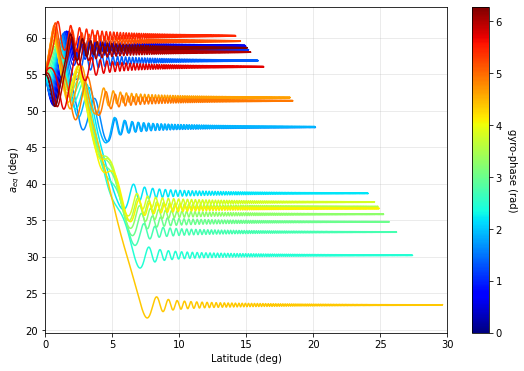

In [14]:
from matplotlib import cm

# for r in range(0,len(eta0)):
#     for i in range(0,len(aeq)-1):
#         print(r,i,np.rad2deg(lamda[r,i]),np.rad2deg(aeq[r,i]))

# for i in range(0,len(lamda[1,:])):
#     print(np.rad2deg(aeq[1,i]))
# from matplotlib import cm
# mask=np.isnan(aeq)

aeq = np.ma.array(aeq, mask=np.isnan(aeq))
print(np.max(aeq[1,-1]))
# print(np.shape(aeq[1,:]))
# dalpha=[]
# for r in range(0,len(eta0)):
#     ls=aeq[r,:].shape[1] - (~np.isnan(aeq[r,:]))[:, ::-1].argmax(1) - 1
#     print(ls)
#     ls=(~np.isnan(aeq[r,:])).cumsum(2).argmax(1)
#     dalphaf=np.rad2deg(aeq[r,ls])-aeq0_deg
#     print(eta0[r],np.rad2deg(aeq[r,-1]))
#     dalpha.append(dalphaf)
    

dalpha=[]
for r in range(0,len(eta0)):
    ls=np.max(np.nonzero(aeq[r,:]))
    dalphaf=np.rad2deg(aeq[r,ls])-aeq0_deg
    dalpha.append(dalphaf)
# # print(dalpha)
norm = cm.colors.Normalize(vmin=eta0.min(), vmax=eta0.max())
cmap = cm.ScalarMappable(norm=norm, cmap=cm.jet)
cmap.set_array([])
#################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),np.rad2deg(aeq[r,:-1]),c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel(r'$a_{eq}$ (deg)')

# ax.set_ylim(40,65)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

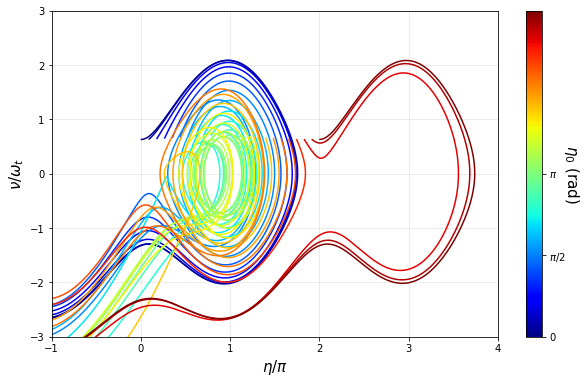

In [15]:
fonts=15
wtr=np.sqrt(wtrsq_out)

nplot=deta_dt/wtr
# print(wtr)


fig, ax = plt.subplots(figsize=(10,6))
s=5
last=1

for r in range(0,len(eta0)):
    ax.plot(eta[r,2:-last]/np.pi,nplot[r,2:-last],c=cmap.to_rgba(eta0[r]))

ax.grid(alpha=.3)
ax.set_xlim(-1,4)
ax.set_xlabel(r'$\eta/\pi$',fontsize=fonts)
ax.set_ylabel(r'$\nu/\omega_t$',fontsize=fonts)

ax.set_ylim(-3,3)

cbar=fig.colorbar(cmap, ticks=[-np.pi,-np.pi/2,0,np.pi/2,np.pi])
cbar.ax.set_yticklabels([r'$-\pi$',r'$-\pi/2$', '0',r'$\pi/2$', r'$\pi$'])  # horizontal colorbar
cbar.set_label(r'$\eta_0$ (rad)', rotation=270,labelpad=15,fontsize=fonts)
# ax.axvline(x=-5,color="black", linestyle="--")
plt.show()


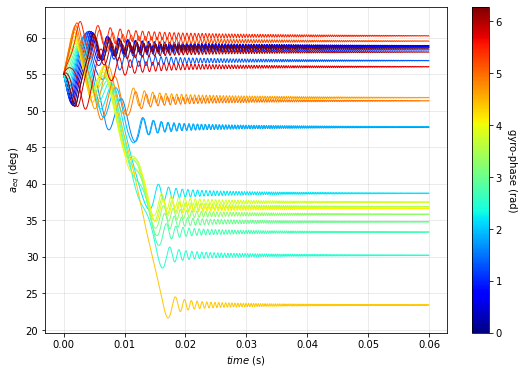

In [16]:
######################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(time[r,:-1],np.rad2deg(aeq[r,:-1]),c=cmap.to_rgba(eta0[r]), linewidth=1)
ax.grid(alpha=.3)
# ax.set_xlim(0,30)
ax.set_ylabel(r'$a_{eq}$ (deg)')
ax.set_xlabel(r'$time$ (s)')

# ax.set_ylim(40,65)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#####################################################

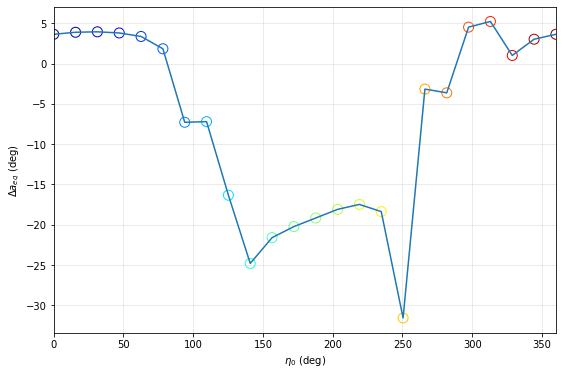

In [17]:
#####################################################
fig, ax = plt.subplots(figsize=(9,6))
s=5

colors=eta0[:]
# for r in range(0,len(eta0)):
#     ax.plot(np.rad2deg(lamda[r,:-1]),np.rad2deg(aeq[r,:-1]),c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.plot(np.rad2deg(eta0),dalpha)
ax.scatter(np.rad2deg(eta0),dalpha,marker='o',facecolors='none', edgecolors=cmap.to_rgba(eta0[:]),s=100)
ax.set_xlim(0,360)
ax.set_xlabel(r'$\eta_0$ (deg)')
ax.set_ylabel(r'$\Delta a_{eq}$ (deg)')

# ax.set_ylim(-10,10)
ticks=np.arange(0,2*np.pi,1)
# cbar=fig.colorbar(cmap, ticks=ticks)
# cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#################

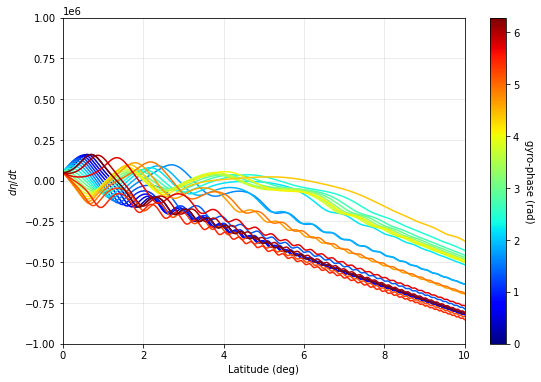

In [18]:

fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),np.rad2deg(deta_dt[r,:-1]),c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,10)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel(r'$d\eta/dt$ ')

ax.set_ylim(-1*10**6,1*10**6)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#####################################################

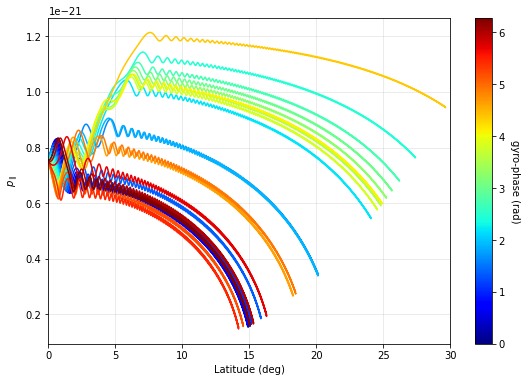

In [19]:
#################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),ppar[r,:-1],c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel(r'$p_{\parallel}$')

# ax.set_ylim(-2,2)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#####################################################

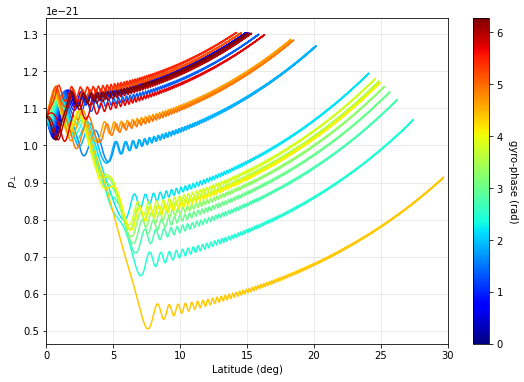

In [20]:

#################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),pper[r,:-1],c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel(r'$p_{\perp}$')

# ax.set_ylim(-2,2)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

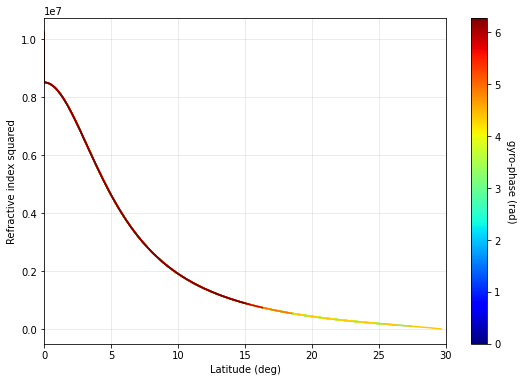

In [21]:
#################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),ref_sq[r,:-1],c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('Refractive index squared')

# ax.set_ylim(-2,2)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#####################################################

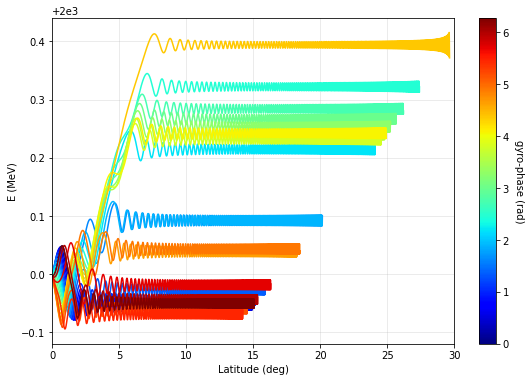

In [22]:

#################
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),E_kin[r,:-1]*6.2415e15,c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel('E (MeV)')

# ax.set_ylim(-1,2.5)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()
#####################################################


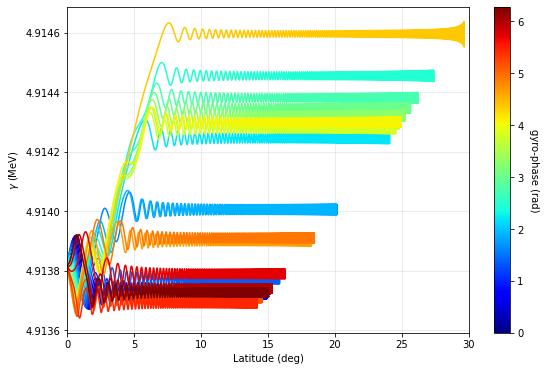

In [23]:

##############
fig, ax = plt.subplots(figsize=(9,6))
s=5


for r in range(0,len(eta0)):
    ax.plot(np.rad2deg(lamda[r,:-1]),gamma[r,:-1],c=cmap.to_rgba(eta0[r]))
ax.grid(alpha=.3)
ax.set_xlim(0,30)
ax.set_xlabel('Latitude (deg)')
ax.set_ylabel(r'$\gamma$ (MeV)')

# ax.set_ylim(-1,2.5)
ticks=np.arange(0,2*np.pi,1)
cbar=fig.colorbar(cmap, ticks=ticks)
cbar.set_label('gyro-phase (rad)', rotation=270,labelpad=15)
#     ax.axvline(x=-5,color="black", linestyle="--")
plt.show()

